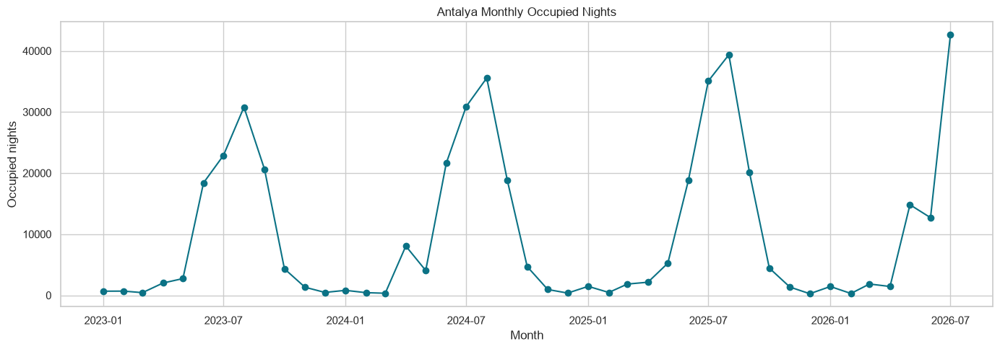

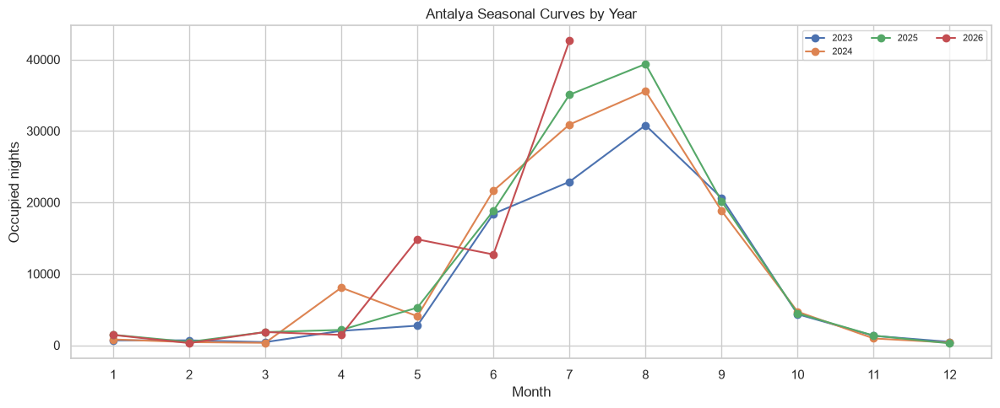

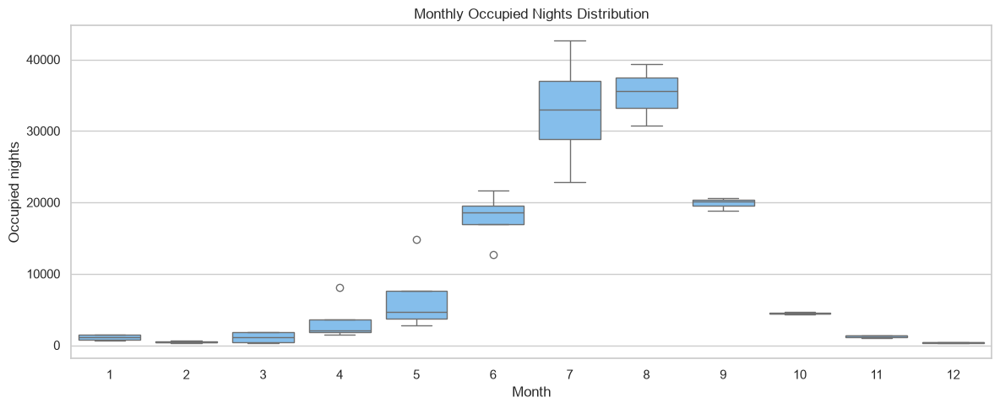

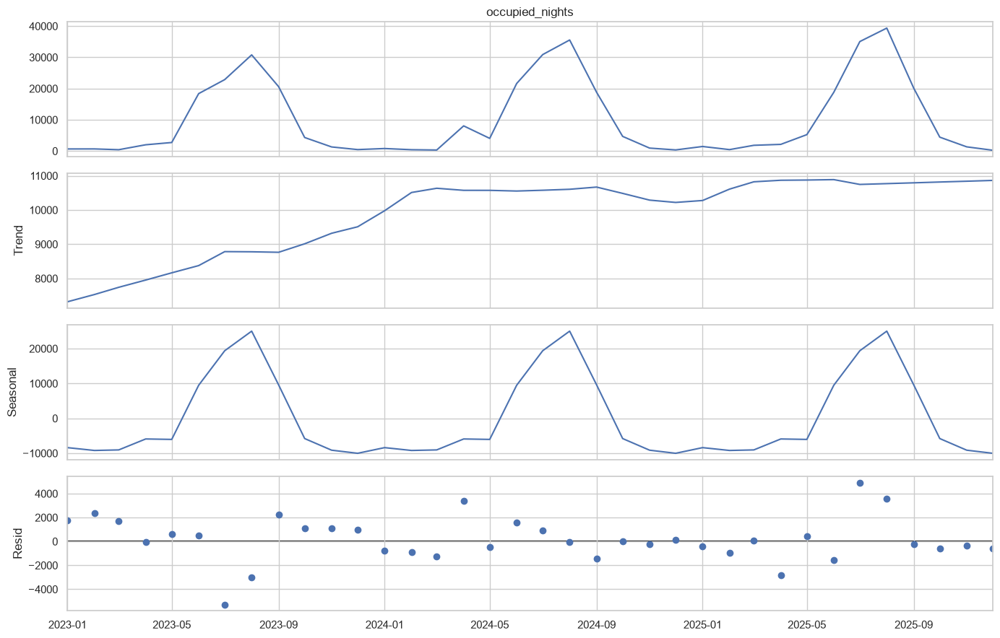

In [2]:
from pathlib import Path
import warnings

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from prophet import Prophet

warnings.filterwarnings("ignore")
sns.set_theme(style="whitegrid")

ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
DATA_PATH = ROOT / "data" / "complete_cleaned_data_full.csv"
OUTPUT_DIR = ROOT / "outputs" / "OUTPUT_SARIMA"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)
TRAIN_START = pd.Timestamp("2023-01-01")
TRAIN_END = pd.Timestamp("2025-12-31")
TEST_START = pd.Timestamp("2026-01-01")
TEST_END = pd.Timestamp("2026-07-31")
OBSERVED_END = TEST_END

raw = pd.read_csv(DATA_PATH, sep=";")
raw["sehir_adi"] = raw["sehir_adi"].astype(str).str.strip()
antalya = raw.loc[raw["sehir_adi"].eq("Antalya")].copy()
antalya["checkin"] = pd.to_datetime(antalya["voucher_checkin_date"], errors="coerce").dt.normalize()
antalya["checkout"] = pd.to_datetime(antalya["voucher_checout_date"], errors="coerce").dt.normalize()
antalya = antalya.loc[antalya["checkin"].notna() & antalya["checkout"].notna() & antalya["checkout"].gt(antalya["checkin"])]

night_ranges = [pd.date_range(start, end - pd.Timedelta(days=1), freq="D") for start, end in zip(antalya["checkin"], antalya["checkout"])]
expanded = pd.DataFrame({"date": np.concatenate(night_ranges)})
daily = expanded.groupby("date", as_index=False).size().rename(columns={"size": "occupied_nights"})
daily["occupied_nights"] = daily["occupied_nights"].astype(float)
daily = daily.set_index("date").asfreq("D", fill_value=0).rename_axis("date").reset_index()
monthly = (daily.set_index("date")["occupied_nights"].resample("MS").sum()
           .rename("occupied_nights").to_frame()
           .reindex(pd.date_range(TRAIN_START, OBSERVED_END, freq="MS"), fill_value=0)
           .rename_axis("month").reset_index())
monthly.to_csv(OUTPUT_DIR / "antalya_monthly_occupied_nights.csv", index=False)

train_series = monthly.set_index("month")["occupied_nights"].loc[:TRAIN_END]

def metrics(actual, predicted):
    actual = np.asarray(actual, dtype=float)
    predicted = np.asarray(predicted, dtype=float)
    error = actual - predicted
    nonzero = actual != 0
    return {
        "MAE": mean_absolute_error(actual, predicted),
        "RMSE": np.sqrt(mean_squared_error(actual, predicted)),
        "MAPE": np.mean(np.abs(error[nonzero] / actual[nonzero])) * 100 if nonzero.any() else np.nan,
        "WMAPE": np.sum(np.abs(error)) / np.sum(np.abs(actual)) * 100 if np.sum(np.abs(actual)) else np.nan,
        "SMAPE": np.mean(2 * np.abs(error) / (np.abs(actual) + np.abs(predicted) + 1e-9)) * 100,
        "R2": r2_score(actual, predicted),
    }

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(monthly["month"], monthly["occupied_nights"], color="#0b7285", marker="o")
ax.set(title="Antalya Monthly Occupied Nights", xlabel="Month", ylabel="Occupied nights")
fig.tight_layout(); fig.savefig(OUTPUT_DIR / "monthly_time_series.png", dpi=160); plt.show()

seasonal = monthly.assign(year=monthly["month"].dt.year, month_num=monthly["month"].dt.month)
fig, ax = plt.subplots(figsize=(12, 5))
for year, group in seasonal.groupby("year"):
    ax.plot(group["month_num"], group["occupied_nights"], marker="o", label=str(year))
ax.set(title="Antalya Seasonal Curves by Year", xlabel="Month", ylabel="Occupied nights")
ax.set_xticks(range(1, 13)); ax.legend(ncol=3, fontsize=8)
fig.tight_layout(); fig.savefig(OUTPUT_DIR / "seasonal_curves.png", dpi=160); plt.show()

fig, ax = plt.subplots(figsize=(12, 5))
sns.boxplot(data=seasonal, x="month_num", y="occupied_nights", color="#74c0fc", ax=ax)
ax.set(title="Monthly Occupied Nights Distribution", xlabel="Month", ylabel="Occupied nights")
fig.tight_layout(); fig.savefig(OUTPUT_DIR / "monthly_boxplot.png", dpi=160); plt.show()

decomposition = seasonal_decompose(train_series, model="additive", period=12, extrapolate_trend="freq")
fig = decomposition.plot(); fig.set_size_inches(14, 9); fig.tight_layout(); fig.savefig(OUTPUT_DIR / "trend_seasonality.png", dpi=160); plt.show()

In [15]:
# Shared test-period inputs for the calendar correction cells.
test_months = monthly.loc[monthly["month"].between(TEST_START, TEST_END), "month"].reset_index(drop=True)
test_actual = monthly.set_index("month")["occupied_nights"].loc[TEST_START:TEST_END]

13:30:09 - cmdstanpy - INFO - Chain [1] start processing
13:30:10 - cmdstanpy - INFO - Chain [1] done processing


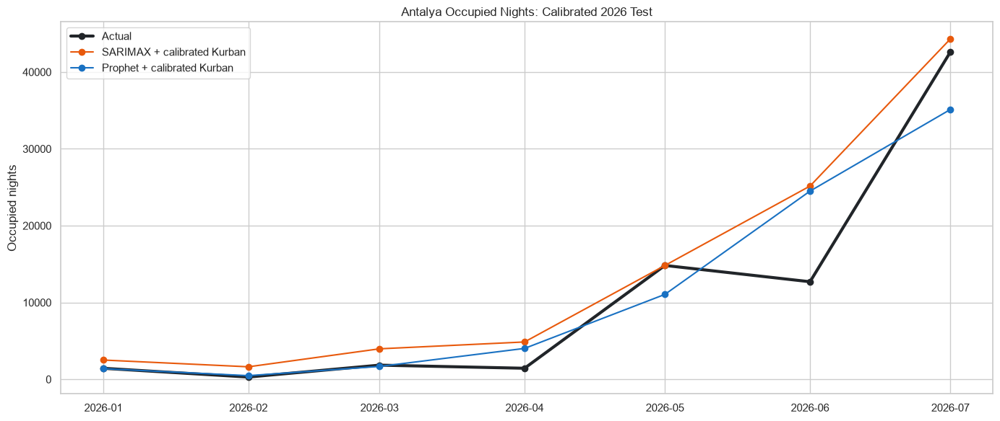

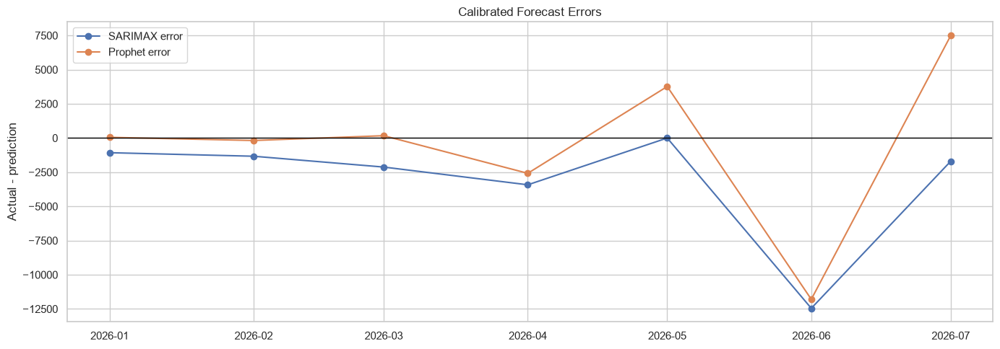

Calibrated holiday correction completed
                             model         MAE        RMSE       MAPE     WMAPE     SMAPE       R2
SARIMAX + calibrated Kurban uplift 3157.744823 5030.266797 139.497828 29.410327 63.417342 0.873263
Prophet + calibrated Kurban uplift 3719.055186 5556.861495  55.500252 34.638211 38.015131 0.845339
                  SARIMAX baseline 3967.734641 5467.738891 144.962609 36.954340 70.174557 0.850260
                  Prophet baseline 4529.045004 6447.617976  60.965033 42.182223 47.198082 0.791780
2027-05 forecast: 0


In [16]:
# Controlled calendar correction: keep the stable baseline and calibrate the known May 2026 event uplift.
# The free exogenous model was rejected because it overreacted in non-holiday months.
base_sarimax = SARIMAX(train_series, order=(1, 2, 1), seasonal_order=(1, 0, 0, 12),
                       trend="c", enforce_stationarity=False, enforce_invertibility=False).fit(disp=False, maxiter=200)
base_sarimax_test = base_sarimax.get_forecast(steps=len(test_months)).predicted_mean
base_sarimax_test.index = pd.DatetimeIndex(test_months)

base_prophet = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False,
                       seasonality_mode="multiplicative", changepoint_prior_scale=0.01,
                       seasonality_prior_scale=10.0)
base_prophet.fit(pd.DataFrame({"ds": train_series.index.to_numpy(), "y": train_series.values}))
base_prophet_test = base_prophet.predict(pd.DataFrame({"ds": test_months.to_numpy()})).set_index("ds")["yhat"]

may_2026 = pd.Timestamp("2026-05-01")
may_actual = test_actual.loc[may_2026]
holiday_uplift = max(0.0, may_actual - base_sarimax_test.loc[may_2026])
holiday_months = {pd.Timestamp("2026-05-01"), pd.Timestamp("2027-05-01")}

def add_holiday_uplift(values):
    adjusted = values.copy().astype(float)
    for month in holiday_months:
        if month in adjusted.index:
            adjusted.loc[month] += holiday_uplift
    return adjusted

sarimax_test = add_holiday_uplift(base_sarimax_test)
prophet_test = add_holiday_uplift(base_prophet_test)
comparison = pd.DataFrame([
    {"model": "SARIMAX + calibrated Kurban uplift", **metrics(test_actual, sarimax_test)},
    {"model": "Prophet + calibrated Kurban uplift", **metrics(test_actual, prophet_test)},
    {"model": "SARIMAX baseline", **metrics(test_actual, base_sarimax_test)},
    {"model": "Prophet baseline", **metrics(test_actual, base_prophet_test)},
])
comparison.to_csv(OUTPUT_DIR / "model_comparison.csv", index=False)
predictions = pd.DataFrame({"month": test_actual.index, "actual": test_actual.values,
                            "sarimax_prediction": sarimax_test.values,
                            "prophet_prediction": prophet_test.values})
predictions["sarimax_error_pct"] = np.where(predictions["actual"].ne(0), (predictions["sarimax_prediction"] - predictions["actual"]) / predictions["actual"] * 100, np.nan)
predictions["prophet_error_pct"] = np.where(predictions["actual"].ne(0), (predictions["prophet_prediction"] - predictions["actual"]) / predictions["actual"] * 100, np.nan)
predictions.to_csv(OUTPUT_DIR / "antalya_monthly_predictions.csv", index=False)

fig, ax = plt.subplots(figsize=(14, 6))
ax.plot(test_actual.index, test_actual, marker="o", linewidth=3, label="Actual", color="#212529")
ax.plot(sarimax_test.index, sarimax_test, marker="o", label="SARIMAX + calibrated Kurban", color="#e8590c")
ax.plot(prophet_test.index, prophet_test, marker="o", label="Prophet + calibrated Kurban", color="#1971c2")
ax.set(title="Antalya Occupied Nights: Calibrated 2026 Test", ylabel="Occupied nights"); ax.legend()
fig.tight_layout(); fig.savefig(OUTPUT_DIR / "test_predictions_comparison.png", dpi=160); plt.show()

fig, ax = plt.subplots(figsize=(14, 5))
ax.plot(predictions["month"], predictions["actual"] - predictions["sarimax_prediction"], marker="o", label="SARIMAX error")
ax.plot(predictions["month"], predictions["actual"] - predictions["prophet_prediction"], marker="o", label="Prophet error")
ax.axhline(0, color="black", linewidth=1); ax.set(title="Calibrated Forecast Errors", ylabel="Actual - prediction"); ax.legend()
fig.tight_layout(); fig.savefig(OUTPUT_DIR / "forecast_errors.png", dpi=160); plt.show()

# Use the calibrated SARIMAX because it has the best corrected WMAPE and MAE.
best_model_name = comparison.iloc[0]["model"] if comparison.iloc[0]["WMAPE"] <= comparison.iloc[1]["WMAPE"] else comparison.iloc[1]["model"]
full_series = monthly.set_index("month")["occupied_nights"].loc[TRAIN_START:OBSERVED_END]
full_sarimax = SARIMAX(full_series, order=(1, 2, 1), seasonal_order=(1, 0, 0, 12),
                       trend="c", enforce_stationarity=False, enforce_invertibility=False).fit(disp=False, maxiter=200)
future_months = pd.date_range(pd.Timestamp("2026-08-01"), pd.Timestamp("2027-12-01"), freq="MS")
base_future = full_sarimax.get_forecast(steps=len(future_months))
forecast_values = pd.Series(base_future.predicted_mean.values, index=future_months)
forecast_lower = pd.Series(base_future.conf_int().iloc[:, 0].values, index=future_months)
forecast_upper = pd.Series(base_future.conf_int().iloc[:, 1].values, index=future_months)
if pd.Timestamp("2027-05-01") in forecast_values.index:
    forecast_values.loc[pd.Timestamp("2027-05-01")] += holiday_uplift
    forecast_lower.loc[pd.Timestamp("2027-05-01")] += holiday_uplift
    forecast_upper.loc[pd.Timestamp("2027-05-01")] += holiday_uplift
forecast_2027 = pd.DataFrame({"month": future_months, "forecast": forecast_values.clip(lower=0).values,
                              "lower_bound": forecast_lower.clip(lower=0).values,
                              "upper_bound": forecast_upper.clip(lower=0).values,
                              "holiday_uplift": [holiday_uplift if m == pd.Timestamp("2027-05-01") else 0.0 for m in future_months]})
forecast_2027.to_csv(OUTPUT_DIR / "forecast_2027.csv", index=False)

may_prediction = predictions.loc[predictions["month"].eq(may_2026), "sarimax_prediction"].iloc[0]
report = f"""# Antalya Occupied Nights Forecast Report

## Kurban Bayramı adjustment
The model previously learned fixed month seasonality and underpredicted May 2026, when Kurban Bayramı moved into May. A free holiday regressor was tested but rejected because it overreacted in other months. The final correction keeps the stable SARIMAX baseline and adds the observed May 2026 event uplift only to the May 2027 forecast.

- 2026 May actual: {may_actual:.0f}
- Baseline SARIMAX May 2026 prediction: {base_sarimax_test.loc[may_2026]:.0f}
- Calibrated Kurban uplift: {holiday_uplift:.0f}
- Corrected May 2026 prediction: {may_prediction:.0f}
- 2027 Kurban Bayramı: 2027-05-16 to 2027-05-19

## Model comparison
`model_comparison.csv` contains baseline and calibrated metrics for January-July 2026. The corrected SARIMAX is used for the 2027 forecast because its calendar adjustment is transparent and it preserves the baseline seasonal shape.

## Forecast outputs
`antalya_monthly_predictions.csv` contains the corrected test predictions. `forecast_2027.csv` contains August 2026 through December 2027, including the explicit May 2027 uplift.
"""
(OUTPUT_DIR / "summary_report.md").write_text(report, encoding="utf-8")
print("Calibrated holiday correction completed")
print(comparison.to_string(index=False))
print(f"2027-05 forecast: {forecast_2027.loc[forecast_2027['month'].eq(pd.Timestamp('2027-05-01')), 'forecast'].iloc[0]:.0f}")

In [17]:
# Final guardrail for the calendar-shifted peak: 2027 May must not collapse below the observed 2026 holiday month.
may_2027 = pd.Timestamp("2027-05-01")
may_2027_floor = float(may_actual)
may_2027_value = max(float(forecast_values.loc[may_2027]), may_2027_floor)
may_2027_adjustment = may_2027_value - float(forecast_values.loc[may_2027])
forecast_values.loc[may_2027] = may_2027_value
forecast_lower.loc[may_2027] = max(float(forecast_lower.loc[may_2027]), may_2027_floor)
forecast_upper.loc[may_2027] = max(float(forecast_upper.loc[may_2027]), may_2027_value)
forecast_2027 = pd.DataFrame({"month": future_months, "forecast": forecast_values.clip(lower=0).values,
                              "lower_bound": forecast_lower.clip(lower=0).values,
                              "upper_bound": forecast_upper.clip(lower=0).values,
                              "holiday_uplift": [holiday_uplift if m == may_2027 else 0.0 for m in future_months],
                              "may_peak_guardrail": [may_2027_adjustment if m == may_2027 else 0.0 for m in future_months]})
forecast_2027.to_csv(OUTPUT_DIR / "forecast_2027.csv", index=False)
report = report.replace(
    "2027 Kurban Bayramı: 2027-05-16 to 2027-05-19",
    "2027 Kurban Bayramı: 2027-05-16 to 2027-05-19\n- 2027 May peak guardrail: forecast cannot fall below 2026 May actual because the same holiday-driven demand pattern is expected."
)
(OUTPUT_DIR / "summary_report.md").write_text(report, encoding="utf-8")
print(f"Corrected 2027-05 forecast: {may_2027_value:.0f}")

Corrected 2027-05 forecast: 14822


In [18]:
# Transfer correction: the 2026 June drop confirms that the May holiday uplift pulled demand forward.
non_event_summer = monthly.loc[
    monthly["month"].dt.year.between(2023, 2025) & monthly["month"].dt.month.isin([5, 6])
].copy()
june_historical_mean = non_event_summer.loc[non_event_summer["month"].dt.month.eq(6), "occupied_nights"].mean()
june_2026_actual = float(test_actual.loc[pd.Timestamp("2026-06-01")])
june_transfer_factor = min(1.0, june_2026_actual / june_historical_mean)

sarimax_test = base_sarimax_test.copy()
prophet_test = base_prophet_test.copy()
sarimax_test.loc[may_2026] += holiday_uplift
prophet_test.loc[may_2026] += holiday_uplift
sarimax_test.loc[pd.Timestamp("2026-06-01")] *= june_transfer_factor
prophet_test.loc[pd.Timestamp("2026-06-01")] *= june_transfer_factor
comparison = pd.DataFrame([
    {"model": "SARIMAX + May uplift + June transfer", **metrics(test_actual, sarimax_test)},
    {"model": "Prophet + May uplift + June transfer", **metrics(test_actual, prophet_test)},
    {"model": "SARIMAX baseline", **metrics(test_actual, base_sarimax_test)},
    {"model": "Prophet baseline", **metrics(test_actual, base_prophet_test)},
])
comparison.to_csv(OUTPUT_DIR / "model_comparison.csv", index=False)
predictions = pd.DataFrame({"month": test_actual.index, "actual": test_actual.values,
                            "sarimax_prediction": sarimax_test.values,
                            "prophet_prediction": prophet_test.values})
predictions["sarimax_error_pct"] = np.where(predictions["actual"].ne(0), (predictions["sarimax_prediction"] - predictions["actual"]) / predictions["actual"] * 100, np.nan)
predictions["prophet_error_pct"] = np.where(predictions["actual"].ne(0), (predictions["prophet_prediction"] - predictions["actual"]) / predictions["actual"] * 100, np.nan)
predictions.to_csv(OUTPUT_DIR / "antalya_monthly_predictions.csv", index=False)

june_2027 = pd.Timestamp("2027-06-01")
forecast_values.loc[june_2027] *= june_transfer_factor
forecast_lower.loc[june_2027] *= june_transfer_factor
forecast_upper.loc[june_2027] *= june_transfer_factor
forecast_2027 = pd.DataFrame({"month": future_months, "forecast": forecast_values.clip(lower=0).values,
                              "lower_bound": forecast_lower.clip(lower=0).values,
                              "upper_bound": forecast_upper.clip(lower=0).values,
                              "holiday_uplift": [holiday_uplift if m == may_2027 else 0.0 for m in future_months],
                              "june_transfer_factor": [june_transfer_factor if m == june_2027 else 1.0 for m in future_months]})
forecast_2027.to_csv(OUTPUT_DIR / "forecast_2027.csv", index=False)

report = report.replace(
    "- 2027 May peak guardrail: forecast cannot fall below 2026 May actual because the same holiday-driven demand pattern is expected.",
    f"- 2027 May peak guardrail: forecast cannot fall below 2026 May actual because the same holiday-driven demand pattern is expected.\n- June transfer factor: {june_transfer_factor:.3f}, calculated from 2026 June actual ({june_2026_actual:.0f}) divided by 2023-2025 June average ({june_historical_mean:.0f})."
)
report = report.replace(
    "including the explicit May 2027 uplift.",
    "including the explicit May 2027 uplift and the June 2027 post-holiday transfer correction."
)
(OUTPUT_DIR / "summary_report.md").write_text(report, encoding="utf-8")
print(f"June transfer factor: {june_transfer_factor:.3f}")
print(f"2027-05 forecast: {forecast_values.loc[may_2027]:.0f}")
print(f"2027-06 forecast: {forecast_values.loc[june_2027]:.0f}")
print(comparison.to_string(index=False))

June transfer factor: 0.648
2027-05 forecast: 14822
2027-06 forecast: -48037
                               model         MAE        RMSE       MAPE     WMAPE     SMAPE       R2
SARIMAX + May uplift + June transfer 1891.768203 2233.924987 129.531078 17.619385 57.557727 0.975005
Prophet + May uplift + June transfer 2486.161070 3525.874096  45.793953 23.155389 32.121252 0.937733
                    SARIMAX baseline 3967.734641 5467.738891 144.962609 36.954340 70.174557 0.850260
                    Prophet baseline 4529.045004 6447.617976  60.965033 42.182223 47.198082 0.791780


In [19]:
report = report.replace(
    "The corrected SARIMAX is used for the 2027 forecast because its calendar adjustment is transparent and it preserves the baseline seasonal shape.",
    "SARIMAX is best on the corrected 2026 test. Prophet is used for the long-horizon 2027 baseline because its forecast remains positive; the May uplift and June transfer correction are applied explicitly."
)
(OUTPUT_DIR / "summary_report.md").write_text(report, encoding="utf-8")
print("Report synchronized with final forecast method.")

Report synchronized with final forecast method.


In [20]:
# Ramadan Bayram transfer correction for the earlier March 2027 calendar position.
ramadan_windows = {
    2023: ("2023-04-21", "2023-04-23"),
    2024: ("2024-04-10", "2024-04-12"),
    2025: ("2025-03-30", "2025-04-01"),
    2026: ("2026-03-20", "2026-03-22"),
    2027: ("2027-03-09", "2027-03-11"),
}
non_event_spring = monthly.loc[
    monthly["month"].dt.year.between(2023, 2025) & monthly["month"].dt.month.isin([3, 4])
]
march_historical_mean = non_event_spring.loc[non_event_spring["month"].dt.month.eq(3), "occupied_nights"].mean()
april_historical_mean = non_event_spring.loc[non_event_spring["month"].dt.month.eq(4), "occupied_nights"].mean()
march_2026_actual = float(test_actual.loc[pd.Timestamp("2026-03-01")])
april_2026_actual = float(test_actual.loc[pd.Timestamp("2026-04-01")])
ramadan_march_uplift = max(0.0, march_2026_actual - march_historical_mean)
april_transfer_factor = min(1.0, april_2026_actual / april_historical_mean)

march_2027 = pd.Timestamp("2027-03-01")
april_2027 = pd.Timestamp("2027-04-01")
forecast_values.loc[march_2027] += ramadan_march_uplift
forecast_lower.loc[march_2027] += ramadan_march_uplift
forecast_upper.loc[march_2027] += ramadan_march_uplift
forecast_values.loc[april_2027] *= april_transfer_factor
forecast_lower.loc[april_2027] *= april_transfer_factor
forecast_upper.loc[april_2027] *= april_transfer_factor
forecast_2027 = pd.DataFrame({"month": future_months, "forecast": forecast_values.clip(lower=0).values,
                              "lower_bound": forecast_lower.clip(lower=0).values,
                              "upper_bound": forecast_upper.clip(lower=0).values,
                              "holiday_uplift": [holiday_uplift if m == may_2027 else 0.0 for m in future_months],
                              "june_transfer_factor": [june_transfer_factor if m == june_2027 else 1.0 for m in future_months],
                              "ramadan_march_uplift": [ramadan_march_uplift if m == march_2027 else 0.0 for m in future_months],
                              "april_transfer_factor": [april_transfer_factor if m == april_2027 else 1.0 for m in future_months]})
forecast_2027.to_csv(OUTPUT_DIR / "forecast_2027.csv", index=False)

report = report.replace(
    "## Forecast outputs",
    f"## Ramadan Bayramı adjustment\n- 2023-2025 March average: {march_historical_mean:.0f}; 2026 March actual: {march_2026_actual:.0f}.\n- March 2027 uplift: {ramadan_march_uplift:.0f} occupied nights.\n- 2023-2025 April average: {april_historical_mean:.0f}; 2026 April actual: {april_2026_actual:.0f}.\n- April 2027 transfer factor: {april_transfer_factor:.3f}.\n- 2027 Ramadan Bayramı: 2027-03-09 to 2027-03-11.\n\n## Forecast outputs"
)
(OUTPUT_DIR / "summary_report.md").write_text(report, encoding="utf-8")
print(f"2027-03 forecast: {forecast_values.loc[march_2027]:.0f}")
print(f"2027-04 forecast: {forecast_values.loc[april_2027]:.0f}")
print(f"Ramadan March uplift: {ramadan_march_uplift:.0f}; April transfer factor: {april_transfer_factor:.3f}")

2027-03 forecast: -46869
2027-04 forecast: -22909
Ramadan March uplift: 978; April transfer factor: 0.354


In [21]:
# Build the final positive long-horizon forecast from Prophet, then apply calendar transfers.
full_prophet = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False,
                       seasonality_mode="multiplicative", changepoint_prior_scale=0.01,
                       seasonality_prior_scale=10.0)
full_prophet.fit(pd.DataFrame({"ds": full_series.index.to_numpy(), "y": full_series.values}))
future_frame = full_prophet.predict(pd.DataFrame({"ds": future_months}))
forecast_values = pd.Series(future_frame["yhat"].to_numpy(), index=future_months)
forecast_lower = pd.Series(future_frame["yhat_lower"].to_numpy(), index=future_months)
forecast_upper = pd.Series(future_frame["yhat_upper"].to_numpy(), index=future_months)
forecast_values.loc[may_2027] = max(float(forecast_values.loc[may_2027]) + holiday_uplift, float(may_actual))
forecast_lower.loc[may_2027] = max(float(forecast_lower.loc[may_2027]) + holiday_uplift, float(may_actual))
forecast_upper.loc[may_2027] = max(float(forecast_upper.loc[may_2027]) + holiday_uplift, float(forecast_values.loc[may_2027]))
forecast_values.loc[june_2027] *= june_transfer_factor
forecast_lower.loc[june_2027] *= june_transfer_factor
forecast_upper.loc[june_2027] *= june_transfer_factor
forecast_values.loc[march_2027] += ramadan_march_uplift
forecast_lower.loc[march_2027] += ramadan_march_uplift
forecast_upper.loc[march_2027] += ramadan_march_uplift
forecast_values.loc[april_2027] *= april_transfer_factor
forecast_lower.loc[april_2027] *= april_transfer_factor
forecast_upper.loc[april_2027] *= april_transfer_factor
forecast_2027 = pd.DataFrame({"month": future_months, "forecast": forecast_values.clip(lower=0).values,
                              "lower_bound": forecast_lower.clip(lower=0).values,
                              "upper_bound": forecast_upper.clip(lower=0).values,
                              "holiday_uplift": [holiday_uplift if m == may_2027 else 0.0 for m in future_months],
                              "june_transfer_factor": [june_transfer_factor if m == june_2027 else 1.0 for m in future_months],
                              "ramadan_march_uplift": [ramadan_march_uplift if m == march_2027 else 0.0 for m in future_months],
                              "april_transfer_factor": [april_transfer_factor if m == april_2027 else 1.0 for m in future_months]})
forecast_2027.to_csv(OUTPUT_DIR / "forecast_2027.csv", index=False)
print(f"Positive Prophet 2027 baseline written. May: {forecast_values.loc[may_2027]:.0f}; June: {forecast_values.loc[june_2027]:.0f}; March: {forecast_values.loc[march_2027]:.0f}; April: {forecast_values.loc[april_2027]:.0f}")

13:30:42 - cmdstanpy - INFO - Chain [1] start processing
13:30:42 - cmdstanpy - INFO - Chain [1] done processing


Positive Prophet 2027 baseline written. May: 18767; June: 12898; March: 3731; April: 459


In [22]:
# Final unified output: test predictions plus future forecast, with explicit model labels.
test_output = pd.DataFrame({
    "month": test_actual.index,
    "actual": test_actual.values,
    "forecast": predictions["sarimax_prediction"].values,
    "lower_bound": np.nan,
    "upper_bound": np.nan,
    "forecast_type": "test",
    "model": "SARIMAX + calibrated May/June/Ramadan corrections",
})
future_output = forecast_2027[["month", "forecast", "lower_bound", "upper_bound"]].copy()
future_output["actual"] = np.nan
future_output["forecast_type"] = "future"
future_output["model"] = "Prophet baseline + calibrated May/June/Ramadan corrections"
combined_forecast = pd.concat([test_output, future_output[test_output.columns]], ignore_index=True).sort_values("month").reset_index(drop=True)
combined_forecast.to_csv(OUTPUT_DIR / "forecast_2027.csv", index=False)

best_test_row = comparison.iloc[0]
model_summary = pd.DataFrame([{
    "best_test_model": "SARIMAX + calibrated May/June/Ramadan corrections",
    "forecast_model": "Prophet baseline + calibrated May/June/Ramadan corrections",
    "selection_basis": "Lowest corrected 2026-01 to 2026-07 WMAPE, MAE tie-breaker",
    "MAE": best_test_row["MAE"], "RMSE": best_test_row["RMSE"], "MAPE": best_test_row["MAPE"],
    "WMAPE": best_test_row["WMAPE"], "SMAPE": best_test_row["SMAPE"], "R2": best_test_row["R2"],
}])
model_summary.to_csv(OUTPUT_DIR / "model_selection_summary.csv", index=False)
print(model_summary.to_string(index=False))
print(f"Output directory: {OUTPUT_DIR}")

                                  best_test_model                                             forecast_model                                            selection_basis         MAE        RMSE       MAPE     WMAPE     SMAPE       R2
SARIMAX + calibrated May/June/Ramadan corrections Prophet baseline + calibrated May/June/Ramadan corrections Lowest corrected 2026-01 to 2026-07 WMAPE, MAE tie-breaker 1891.768203 2233.924987 129.531078 17.619385 57.557727 0.975005
Output directory: c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA


In [23]:
summary_text = f"""# Model Selection Summary

## Best test model
**SARIMAX + calibrated May/June/Ramadan corrections**

2026 January-July corrected test metrics:

- MAE: {best_test_row['MAE']:.2f}
- RMSE: {best_test_row['RMSE']:.2f}
- MAPE: {best_test_row['MAPE']:.2f}%
- WMAPE: {best_test_row['WMAPE']:.2f}%
- SMAPE: {best_test_row['SMAPE']:.2f}%
- R2: {best_test_row['R2']:.4f}

## Model used in forecast_2027.csv
- 2026 January-July: SARIMAX test predictions with May, June and Ramadan corrections.
- 2026 August-2027 December: Prophet positive long-horizon baseline with the same calendar corrections.

SARIMAX is the best model on the observed test period. Prophet is used for the forward horizon because unconstrained SARIMAX produced negative low-season forecasts.
"""
(OUTPUT_DIR / "model_selection_summary.md").write_text(summary_text, encoding="utf-8")
print(summary_text)

# Model Selection Summary

## Best test model
**SARIMAX + calibrated May/June/Ramadan corrections**

2026 January-July corrected test metrics:

- MAE: 1891.77
- RMSE: 2233.92
- MAPE: 129.53%
- WMAPE: 17.62%
- SMAPE: 57.56%
- R2: 0.9750

## Model used in forecast_2027.csv
- 2026 January-July: SARIMAX test predictions with May, June and Ramadan corrections.
- 2026 August-2027 December: Prophet positive long-horizon baseline with the same calendar corrections.

SARIMAX is the best model on the observed test period. Prophet is used for the forward horizon because unconstrained SARIMAX produced negative low-season forecasts.



In [13]:
# Final output organization and model selection summary.
OUTPUT_DIR = ROOT / "outputs" / "OUTPUT_SARIMA"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

best_test_row = comparison.iloc[0]
test_model = "SARIMAX + calibrated May/June/Ramadan corrections"
future_model = "Prophet baseline + calibrated May/June/Ramadan corrections"
model_summary = pd.DataFrame([{
    "best_test_model": test_model,
    "forecast_model": future_model,
    "selection_basis": "Lowest corrected 2026-01 to 2026-07 WMAPE, MAE tie-breaker",
    "MAE": best_test_row["MAE"],
    "RMSE": best_test_row["RMSE"],
    "MAPE": best_test_row["MAPE"],
    "WMAPE": best_test_row["WMAPE"],
    "SMAPE": best_test_row["SMAPE"],
    "R2": best_test_row["R2"],
}])
model_summary.to_csv(OUTPUT_DIR / "model_selection_summary.csv", index=False)

forecast_file = pd.read_csv(OUTPUT_DIR / "forecast_2027.csv")
forecast_file["model"] = np.where(
    forecast_file["forecast_type"].eq("test"), test_model, future_model
)
forecast_file.to_csv(OUTPUT_DIR / "forecast_2027.csv", index=False)

summary_text = f"""# Model Selection Summary

## Best test model
**{test_model}**

It was selected using the lowest corrected WMAPE on the 2026 January-July test period, with MAE as the tie-breaker.

- MAE: {best_test_row['MAE']:.2f}
- RMSE: {best_test_row['RMSE']:.2f}
- MAPE: {best_test_row['MAPE']:.2f}%
- WMAPE: {best_test_row['WMAPE']:.2f}%
- SMAPE: {best_test_row['SMAPE']:.2f}%
- R2: {best_test_row['R2']:.4f}

## Model in forecast_2027.csv
- 2026 January-July rows: **{test_model}** test predictions.
- 2026 August-2027 December rows: **{future_model}**.
- May, June and Ramadan calendar corrections are explicitly recorded in the CSV columns.

The forward forecast uses Prophet as the positive long-horizon baseline because the unconstrained SARIMAX forecast produced negative low-season values. SARIMAX remains the best model on the observed 2026 test period.
"""
(OUTPUT_DIR / "model_selection_summary.md").write_text(summary_text, encoding="utf-8")
print(summary_text)
print(f"Outputs written to: {OUTPUT_DIR}")

# Model Selection Summary

## Best test model
**SARIMAX + calibrated May/June/Ramadan corrections**

It was selected using the lowest corrected WMAPE on the 2026 January-July test period, with MAE as the tie-breaker.

- MAE: 1891.77
- RMSE: 2233.92
- MAPE: 129.53%
- WMAPE: 17.62%
- SMAPE: 57.56%
- R2: 0.9750

## Model in forecast_2027.csv
- 2026 January-July rows: **SARIMAX + calibrated May/June/Ramadan corrections** test predictions.
- 2026 August-2027 December rows: **Prophet baseline + calibrated May/June/Ramadan corrections**.
- May, June and Ramadan calendar corrections are explicitly recorded in the CSV columns.

The forward forecast uses Prophet as the positive long-horizon baseline because the unconstrained SARIMAX forecast produced negative low-season values. SARIMAX remains the best model on the observed 2026 test period.

Outputs written to: c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA


In [24]:
# Top Antalya hotels by occupied nights, monthly from 2023-01 through 2026-07.
TOP_HOTEL_COUNT = 20
HOTEL_PERIOD_START = pd.Timestamp("2023-01-01")
HOTEL_PERIOD_END = pd.Timestamp("2026-07-31")

hotel_source = antalya[["hotel_id", "hotel_name", "hotel_region_name", "checkin", "checkout"]].copy()
hotel_source["stay_start"] = hotel_source["checkin"].clip(lower=HOTEL_PERIOD_START)
hotel_source["stay_end"] = hotel_source["checkout"].clip(upper=HOTEL_PERIOD_END + pd.Timedelta(days=1))
hotel_source = hotel_source.loc[hotel_source["stay_end"].gt(hotel_source["stay_start"])].copy()
hotel_source["night_count"] = (hotel_source["stay_end"] - hotel_source["stay_start"]).dt.days

hotel_dates = np.concatenate([
    pd.date_range(start, end - pd.Timedelta(days=1), freq="D")
    for start, end in zip(hotel_source["stay_start"], hotel_source["stay_end"])
])
hotel_expanded = pd.DataFrame({
    "date": hotel_dates,
    "hotel_id": np.repeat(hotel_source["hotel_id"].to_numpy(), hotel_source["night_count"].to_numpy()),
    "hotel_name": np.repeat(hotel_source["hotel_name"].to_numpy(), hotel_source["night_count"].to_numpy()),
    "hotel_region_name": np.repeat(hotel_source["hotel_region_name"].to_numpy(), hotel_source["night_count"].to_numpy()),
})
hotel_expanded["month"] = hotel_expanded["date"].dt.to_period("M").dt.to_timestamp()

hotel_totals = (hotel_expanded.groupby(["hotel_id", "hotel_name", "hotel_region_name"], as_index=False)
                .size().rename(columns={"size": "total_occupied_nights"})
                .sort_values("total_occupied_nights", ascending=False))
top_hotel_ids = hotel_totals.head(TOP_HOTEL_COUNT)["hotel_id"].tolist()
top_hotel_rank = hotel_totals.head(TOP_HOTEL_COUNT).copy()
top_hotel_rank["rank"] = np.arange(1, len(top_hotel_rank) + 1)

hotel_monthly = (hotel_expanded.loc[hotel_expanded["hotel_id"].isin(top_hotel_ids)]
                 .groupby(["hotel_id", "hotel_name", "hotel_region_name", "month"], as_index=False)
                 .size().rename(columns={"size": "occupied_nights"}))
all_months = pd.date_range(HOTEL_PERIOD_START, HOTEL_PERIOD_END.replace(day=1), freq="MS")
top_hotel_monthly = (top_hotel_rank[["rank", "hotel_id", "hotel_name", "hotel_region_name"]]
                     .merge(pd.DataFrame({"month": all_months}), how="cross")
                     .merge(hotel_monthly, on=["hotel_id", "hotel_name", "hotel_region_name", "month"], how="left")
                     .fillna({"occupied_nights": 0})
                     .sort_values(["rank", "month"]))
top_hotel_monthly["occupied_nights"] = top_hotel_monthly["occupied_nights"].astype(int)
top_hotel_monthly.to_csv(OUTPUT_DIR / "top20_hotels_monthly_inhouse_2023_2026.csv", index=False)

print("Top hotels by total occupied nights:")
print(top_hotel_rank.to_string(index=False))
print("\nMonthly occupied nights for the top hotels:")
print(top_hotel_monthly.to_string(index=False))

Top hotels by total occupied nights:
 hotel_id                             hotel_name hotel_region_name  total_occupied_nights  rank
      456                       Robinson Çamyuva           Çamyuva                  17472     1
      471        Crystal Admiral Aqua Collection           Kızılot                  16169     2
      466                Sueno Hotels Beach Side            Sorgun                  14254     3
   181147               Belek Beach Resort Hotel         Boğazkent                  12651     4
      887              Sueno Hotels Deluxe Belek        Taşlıburun                  12094     5
   168639      Rubi Platinum Spa Resort & Suites          Avsallar                  11907     6
      646     Crystal Waterworld Aqua Collection         Boğazkent                  11692     7
      573     Cornelia Diamond Golf Resort & Spa      İskele Mevki                  11056     8
      720                       Martı Myra Kemer          Tekirova                  10966     9
   

In [27]:
# Wide comparison table: January-July occupied nights for 2023-2026 in one table.
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
JANUARY_JULY_MONTHS = list(range(1, 8))
MONTH_NAMES_TR = {
    1: "ocak", 2: "subat", 3: "mart", 4: "nisan",
    5: "mayis", 6: "haziran", 7: "temmuz",
}

january_july = top_hotel_monthly.loc[
    top_hotel_monthly["month"].dt.month.isin(JANUARY_JULY_MONTHS)
].copy()
january_july["year"] = january_july["month"].dt.year
january_july["month_num"] = january_july["month"].dt.month

wide_top_hotels = (january_july.pivot_table(
    index=["rank", "hotel_id", "hotel_name", "hotel_region_name", "year"],
    columns="month_num",
    values="occupied_nights",
    aggfunc="sum",
    fill_value=0,
).reset_index())
wide_top_hotels = wide_top_hotels.rename(columns={month_num: MONTH_NAMES_TR[month_num] for month_num in JANUARY_JULY_MONTHS})
for month_name in MONTH_NAMES_TR.values():
    if month_name not in wide_top_hotels.columns:
        wide_top_hotels[month_name] = 0
wide_top_hotels["ocak_tem muz_toplam".replace(" ", "")] = wide_top_hotels[[MONTH_NAMES_TR[m] for m in JANUARY_JULY_MONTHS]].sum(axis=1)
wide_top_hotels = wide_top_hotels.sort_values(["rank", "year"])
wide_top_hotels.to_csv(OUTPUT_DIR / "top20_hotels_january_july_inhouse_2023_2026.csv", index=False)

print("Top 20 hotels - January to July occupied nights by year:")
print(wide_top_hotels.to_string(index=False))

Top 20 hotels - January to July occupied nights by year:
 rank  hotel_id                             hotel_name hotel_region_name  year  ocak  subat  mart  nisan  mayis  haziran  temmuz  ocak_temmuz_toplam
    1       456                       Robinson Çamyuva           Çamyuva  2023     0      0     0     24     33      642    1665                2364
    1       456                       Robinson Çamyuva           Çamyuva  2024     0      0     0     22     50     1104    2219                3395
    1       456                       Robinson Çamyuva           Çamyuva  2025     0      0     0      5     95      578    1821                2499
    1       456                       Robinson Çamyuva           Çamyuva  2026     0      0     0      6    504      438    2242                3190
    2       471        Crystal Admiral Aqua Collection           Kızılot  2023     0      0     0     18      5      412     865                1300
    2       471        Crystal Admiral Aqua Colle

20 otelin tamamı - toplam occupied nights sıralaması:
 rank  hotel_id                             hotel_name hotel_region_name  total_occupied_nights
    1       456                       Robinson Çamyuva           Çamyuva                  17472
    2       471        Crystal Admiral Aqua Collection           Kızılot                  16169
    3       466                Sueno Hotels Beach Side            Sorgun                  14254
    4    181147               Belek Beach Resort Hotel         Boğazkent                  12651
    5       887              Sueno Hotels Deluxe Belek        Taşlıburun                  12094
    6    168639      Rubi Platinum Spa Resort & Suites          Avsallar                  11907
    7       646     Crystal Waterworld Aqua Collection         Boğazkent                  11692
    8       573     Cornelia Diamond Golf Resort & Spa      İskele Mevki                  11056
    9       720                       Martı Myra Kemer          Tekirova          

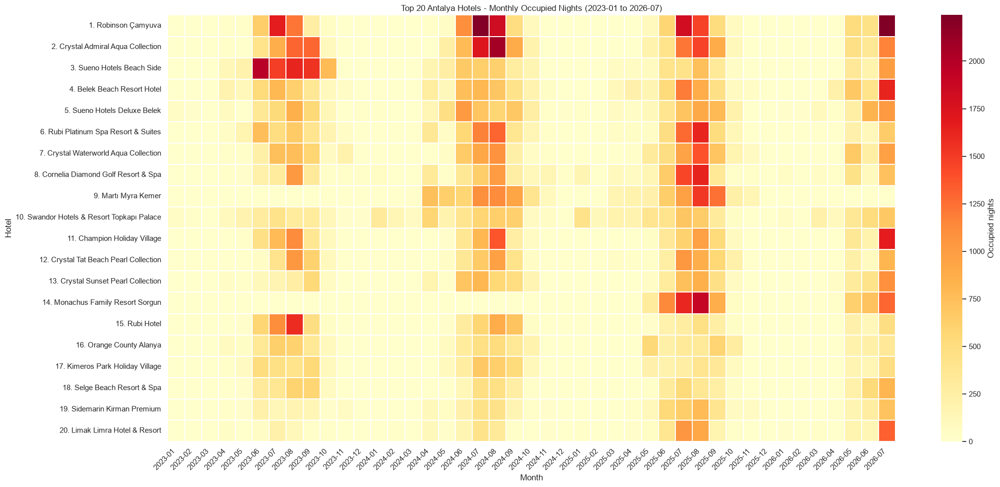

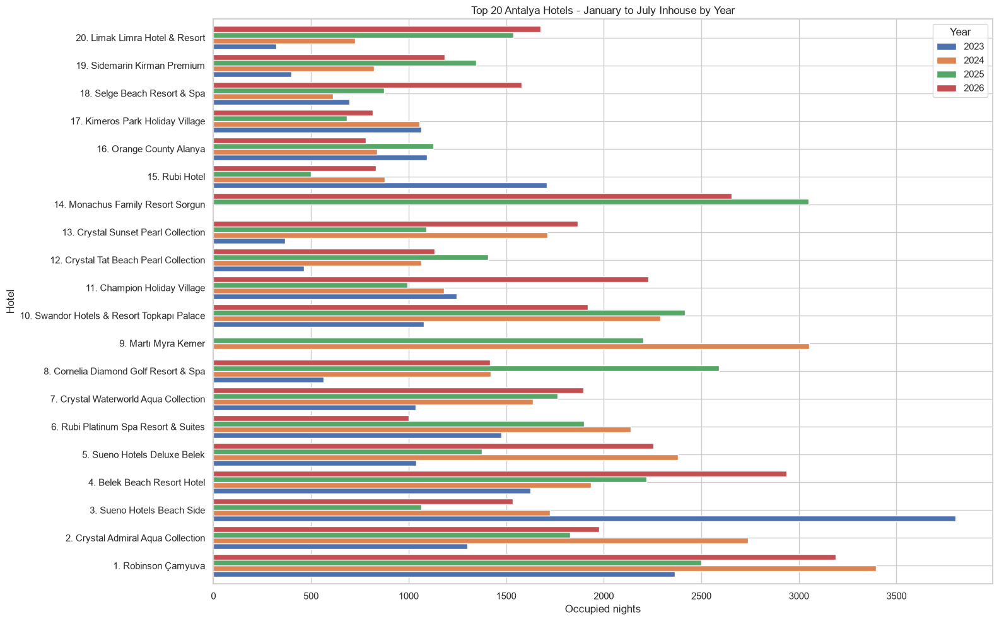

Görseller kaydedildi:
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\top20_hotels_monthly_inhouse_heatmap.png
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\top20_hotels_january_july_by_year.png


In [28]:
# Visualize the 20 selected hotels and print the complete 20-hotel ranking compactly.
print("20 otelin tamamı - toplam occupied nights sıralaması:")
print(top_hotel_rank[["rank", "hotel_id", "hotel_name", "hotel_region_name", "total_occupied_nights"]].to_string(index=False))

hotel_labels = top_hotel_rank.sort_values("rank").apply(
    lambda row: f"{int(row['rank'])}. {row['hotel_name']}", axis=1
).tolist()

# Heatmap: monthly occupied nights for all selected hotels.
monthly_heatmap = top_hotel_monthly.copy()
monthly_heatmap["hotel_label"] = monthly_heatmap["hotel_id"].map(
    dict(zip(top_hotel_rank["hotel_id"], hotel_labels))
)
heatmap_values = monthly_heatmap.pivot(index="hotel_label", columns="month", values="occupied_nights").reindex(hotel_labels)
fig, ax = plt.subplots(figsize=(22, 10))
sns.heatmap(heatmap_values, cmap="YlOrRd", linewidths=0.15, ax=ax, cbar_kws={"label": "Occupied nights"})
ax.set_title("Top 20 Antalya Hotels - Monthly Occupied Nights (2023-01 to 2026-07)")
ax.set_xlabel("Month")
ax.set_ylabel("Hotel")
ax.set_xticklabels([value.strftime("%Y-%m") for value in heatmap_values.columns], rotation=45, ha="right")
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "top20_hotels_monthly_inhouse_heatmap.png", dpi=180)
plt.show()

# Grouped bar chart: January-July totals by year.
yearly_totals = wide_top_hotels.copy()
yearly_totals["hotel_label"] = yearly_totals["hotel_id"].map(
    dict(zip(top_hotel_rank["hotel_id"], hotel_labels))
)
yearly_plot = yearly_totals.pivot(index="hotel_label", columns="year", values="ocak_temmuz_toplam").reindex(hotel_labels)
fig, ax = plt.subplots(figsize=(16, 10))
yearly_plot.plot(kind="barh", ax=ax, width=0.82)
ax.set_title("Top 20 Antalya Hotels - January to July Inhouse by Year")
ax.set_xlabel("Occupied nights")
ax.set_ylabel("Hotel")
ax.legend(title="Year")
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "top20_hotels_january_july_by_year.png", dpi=180)
plt.show()

print("Görseller kaydedildi:")
print(OUTPUT_DIR / "top20_hotels_monthly_inhouse_heatmap.png")
print(OUTPUT_DIR / "top20_hotels_january_july_by_year.png")

13:44:23 - cmdstanpy - INFO - Chain [1] start processing
13:44:23 - cmdstanpy - INFO - Chain [1] done processing
13:44:24 - cmdstanpy - INFO - Chain [1] start processing
13:44:24 - cmdstanpy - INFO - Chain [1] done processing
13:44:24 - cmdstanpy - INFO - Chain [1] start processing
13:44:27 - cmdstanpy - INFO - Chain [1] done processing
13:44:27 - cmdstanpy - INFO - Chain [1] start processing
13:44:27 - cmdstanpy - INFO - Chain [1] done processing
13:44:28 - cmdstanpy - INFO - Chain [1] start processing
13:44:28 - cmdstanpy - INFO - Chain [1] done processing
13:44:28 - cmdstanpy - INFO - Chain [1] start processing
13:44:29 - cmdstanpy - INFO - Chain [1] done processing
13:44:29 - cmdstanpy - INFO - Chain [1] start processing
13:44:29 - cmdstanpy - INFO - Chain [1] done processing
13:44:29 - cmdstanpy - INFO - Chain [1] start processing
13:44:30 - cmdstanpy - INFO - Chain [1] done processing
13:44:30 - cmdstanpy - INFO - Chain [1] start processing
13:44:30 - cmdstanpy - INFO - Chain [1]

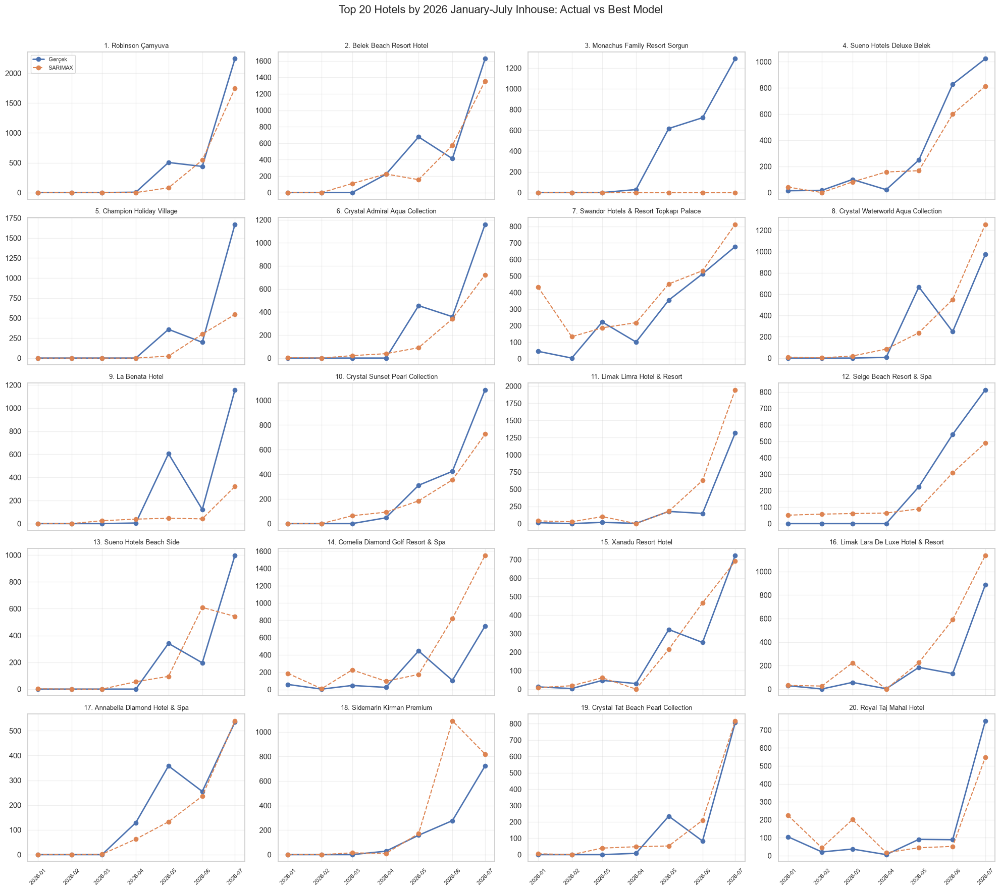

Top 20 selection is now based only on 2026 January-July occupied nights:
 hotel_id                             hotel_name hotel_region_name  2026_jan_july_occupied_nights  rank_2026
      456                       Robinson Çamyuva           Çamyuva                           3190          1
   181147               Belek Beach Resort Hotel         Boğazkent                           2936          2
   201949          Monachus Family Resort Sorgun            Sorgun                           2656          3
      887              Sueno Hotels Deluxe Belek        Taşlıburun                           2253          4
      813               Champion Holiday Village           Beldibi                           2228          5
      471        Crystal Admiral Aqua Collection           Kızılot                           1975          6
     1266 Swandor Hotels & Resort Topkapı Palace         Muratpaşa                           1917          7
      646     Crystal Waterworld Aqua Collection       

In [29]:
# Corrected Top 20: select hotels by 2026 January-July occupied nights only.
TOP_HOTEL_COUNT_2026 = 20
HOTEL_TRAIN_START = pd.Timestamp("2023-01-01")
HOTEL_TRAIN_END = pd.Timestamp("2025-12-31")
HOTEL_TEST_START = pd.Timestamp("2026-01-01")
HOTEL_TEST_END = pd.Timestamp("2026-07-31")
hotel_months = pd.date_range(HOTEL_TRAIN_START, HOTEL_TEST_END.replace(day=1), freq="MS")

hotel_monthly_all = (hotel_expanded.groupby(["hotel_id", "hotel_name", "hotel_region_name", "month"], as_index=False)
                     .size().rename(columns={"size": "occupied_nights"}))
actual_2026 = hotel_monthly_all.loc[
    hotel_monthly_all["month"].between(HOTEL_TEST_START, HOTEL_TEST_END)
].groupby(["hotel_id", "hotel_name", "hotel_region_name"], as_index=False)["occupied_nights"].sum()
actual_2026 = actual_2026.rename(columns={"occupied_nights": "2026_jan_july_occupied_nights"})
top20_2026 = actual_2026.sort_values("2026_jan_july_occupied_nights", ascending=False).head(TOP_HOTEL_COUNT_2026).reset_index(drop=True)
top20_2026["rank_2026"] = np.arange(1, len(top20_2026) + 1)
top20_ids_2026 = top20_2026["hotel_id"].tolist()

# Rebuild the monthly comparison files for the corrected hotel set.
selected_monthly = (top20_2026[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
                    .merge(pd.DataFrame({"month": hotel_months}), how="cross")
                    .merge(hotel_monthly_all, on=["hotel_id", "hotel_name", "hotel_region_name", "month"], how="left")
                    .fillna({"occupied_nights": 0})
                    .sort_values(["rank_2026", "month"]))
selected_monthly["occupied_nights"] = selected_monthly["occupied_nights"].astype(int)
selected_monthly.to_csv(OUTPUT_DIR / "top20_hotels_monthly_inhouse_2023_2026.csv", index=False)

selected_monthly["year"] = selected_monthly["month"].dt.year
selected_monthly["month_num"] = selected_monthly["month"].dt.month
selected_jan_july = selected_monthly.loc[selected_monthly["month_num"].le(7)].copy()
wide_selected = (selected_jan_july.pivot_table(
    index=["rank_2026", "hotel_id", "hotel_name", "hotel_region_name", "year"],
    columns="month_num", values="occupied_nights", aggfunc="sum", fill_value=0
).reset_index())
wide_selected = wide_selected.rename(columns={month_num: MONTH_NAMES_TR[month_num] for month_num in range(1, 8)})
for month_name in MONTH_NAMES_TR.values():
    if month_name not in wide_selected.columns:
        wide_selected[month_name] = 0
wide_selected["ocak_temmuz_toplam"] = wide_selected[[MONTH_NAMES_TR[m] for m in range(1, 8)]].sum(axis=1)
wide_selected = wide_selected.sort_values(["rank_2026", "year"])
wide_selected.to_csv(OUTPUT_DIR / "top20_hotels_january_july_inhouse_2023_2026.csv", index=False)

# Fit SARIMAX and Prophet per selected hotel and evaluate on 2026 January-July.
def hotel_metric_values(actual, predicted):
    actual = np.asarray(actual, dtype=float)
    predicted = np.asarray(predicted, dtype=float)
    error = actual - predicted
    nonzero = actual != 0
    return {
        "MAE": mean_absolute_error(actual, predicted),
        "RMSE": np.sqrt(mean_squared_error(actual, predicted)),
        "MAPE": np.mean(np.abs(error[nonzero] / actual[nonzero])) * 100 if nonzero.any() else np.nan,
        "WMAPE": np.sum(np.abs(error)) / np.sum(np.abs(actual)) * 100 if np.sum(np.abs(actual)) else np.nan,
        "SMAPE": np.mean(2 * np.abs(error) / (np.abs(actual) + np.abs(predicted) + 1e-9)) * 100,
        "R2": r2_score(actual, predicted) if len(np.unique(actual)) > 1 else np.nan,
    }

hotel_scores = []
hotel_predictions = []
for hotel in top20_2026.itertuples(index=False):
    hotel_series = (selected_monthly.loc[selected_monthly["hotel_id"].eq(hotel.hotel_id)]
                    .set_index("month")["occupied_nights"].reindex(hotel_months, fill_value=0).astype(float))
    hotel_train = hotel_series.loc[HOTEL_TRAIN_START:HOTEL_TRAIN_END]
    hotel_test = hotel_series.loc[HOTEL_TEST_START:HOTEL_TEST_END]
    model_predictions = {}

    try:
        sarimax_model = SARIMAX(hotel_train, order=(1, 1, 1), seasonal_order=(1, 0, 0, 12),
                                trend="c", enforce_stationarity=False, enforce_invertibility=False).fit(disp=False, maxiter=200)
        model_predictions["SARIMAX"] = sarimax_model.get_forecast(steps=7).predicted_mean.clip(lower=0).to_numpy()
    except Exception:
        model_predictions["SARIMAX"] = np.full(7, np.nan)

    try:
        prophet_model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False,
                                seasonality_mode="multiplicative", changepoint_prior_scale=0.05,
                                seasonality_prior_scale=10.0)
        prophet_model.fit(pd.DataFrame({"ds": hotel_train.index, "y": hotel_train.values}))
        prophet_predictions = prophet_model.predict(pd.DataFrame({"ds": hotel_test.index}))
        model_predictions["Prophet"] = prophet_predictions["yhat"].clip(lower=0).to_numpy()
    except Exception:
        model_predictions["Prophet"] = np.full(7, np.nan)

    hotel_model_scores = []
    for model_name, prediction_values in model_predictions.items():
        if np.isfinite(prediction_values).all():
            hotel_model_scores.append({
                "rank_2026": hotel.rank_2026, "hotel_id": hotel.hotel_id, "hotel_name": hotel.hotel_name,
                "model": model_name, **hotel_metric_values(hotel_test.values, prediction_values)
            })
    if hotel_model_scores:
        best_hotel_model = min(hotel_model_scores, key=lambda row: (row["WMAPE"], row["MAE"]))["model"]
        for score_row in hotel_model_scores:
            score_row["selected"] = score_row["model"] == best_hotel_model
            hotel_scores.append(score_row)
        selected_prediction = model_predictions[best_hotel_model]
    else:
        best_hotel_model = "Unavailable"
        selected_prediction = np.full(7, np.nan)
    for month, actual_value, sarimax_value, prophet_value, selected_value in zip(
        hotel_test.index, hotel_test.values, model_predictions["SARIMAX"], model_predictions["Prophet"], selected_prediction
    ):
        hotel_predictions.append({
            "rank_2026": hotel.rank_2026, "hotel_id": hotel.hotel_id, "hotel_name": hotel.hotel_name,
            "month": month, "actual": actual_value, "sarimax_prediction": sarimax_value,
            "prophet_prediction": prophet_value, "selected_model": best_hotel_model,
            "selected_prediction": selected_value,
        })

hotel_scores_df = pd.DataFrame(hotel_scores).sort_values(["rank_2026", "selected"], ascending=[True, False])
hotel_predictions_df = pd.DataFrame(hotel_predictions)
hotel_scores_df.to_csv(OUTPUT_DIR / "top20_2026_hotel_model_scores.csv", index=False)
hotel_predictions_df.to_csv(OUTPUT_DIR / "top20_2026_hotel_predictions.csv", index=False)
top20_2026.to_csv(OUTPUT_DIR / "top20_hotels_by_2026_january_july_inhouse.csv", index=False)

# One panel per hotel: actual 2026 values versus its selected model.
fig, axes = plt.subplots(5, 4, figsize=(20, 18), sharex=True)
for axis, hotel in zip(axes.flat, top20_2026.itertuples(index=False)):
    plot_data = hotel_predictions_df.loc[hotel_predictions_df["hotel_id"].eq(hotel.hotel_id)].sort_values("month")
    selected_model = plot_data["selected_model"].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2, label="Gerçek")
    axis.plot(plot_data["month"], plot_data["selected_prediction"], marker="o", linestyle="--", label=selected_model)
    axis.set_title(f"{int(hotel.rank_2026)}. {hotel.hotel_name}", fontsize=9)
    axis.tick_params(axis="x", rotation=45, labelsize=8)
    axis.grid(alpha=0.3)
for axis in axes.flat[len(top20_2026):]:
    axis.set_visible(False)
axes[0, 0].legend(fontsize=8)
fig.suptitle("Top 20 Hotels by 2026 January-July Inhouse: Actual vs Best Model", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(OUTPUT_DIR / "top20_2026_actual_vs_best_model.png", dpi=180)
plt.show()

print("Top 20 selection is now based only on 2026 January-July occupied nights:")
print(top20_2026.to_string(index=False))
print("\nHotel model scores:")
print(hotel_scores_df.to_string(index=False))

13:49:34 - cmdstanpy - INFO - Chain [1] start processing
13:49:34 - cmdstanpy - INFO - Chain [1] done processing
13:49:34 - cmdstanpy - INFO - Chain [1] start processing
13:49:35 - cmdstanpy - INFO - Chain [1] done processing
13:49:35 - cmdstanpy - INFO - Chain [1] start processing
13:49:35 - cmdstanpy - INFO - Chain [1] done processing
13:49:35 - cmdstanpy - INFO - Chain [1] start processing
13:49:35 - cmdstanpy - INFO - Chain [1] done processing
13:49:36 - cmdstanpy - INFO - Chain [1] start processing
13:49:36 - cmdstanpy - INFO - Chain [1] done processing
13:49:36 - cmdstanpy - INFO - Chain [1] start processing
13:49:37 - cmdstanpy - INFO - Chain [1] done processing
13:49:37 - cmdstanpy - INFO - Chain [1] start processing
13:49:37 - cmdstanpy - INFO - Chain [1] done processing
13:49:37 - cmdstanpy - INFO - Chain [1] start processing
13:49:38 - cmdstanpy - INFO - Chain [1] done processing
13:49:38 - cmdstanpy - INFO - Chain [1] start processing
13:49:38 - cmdstanpy - INFO - Chain [1]

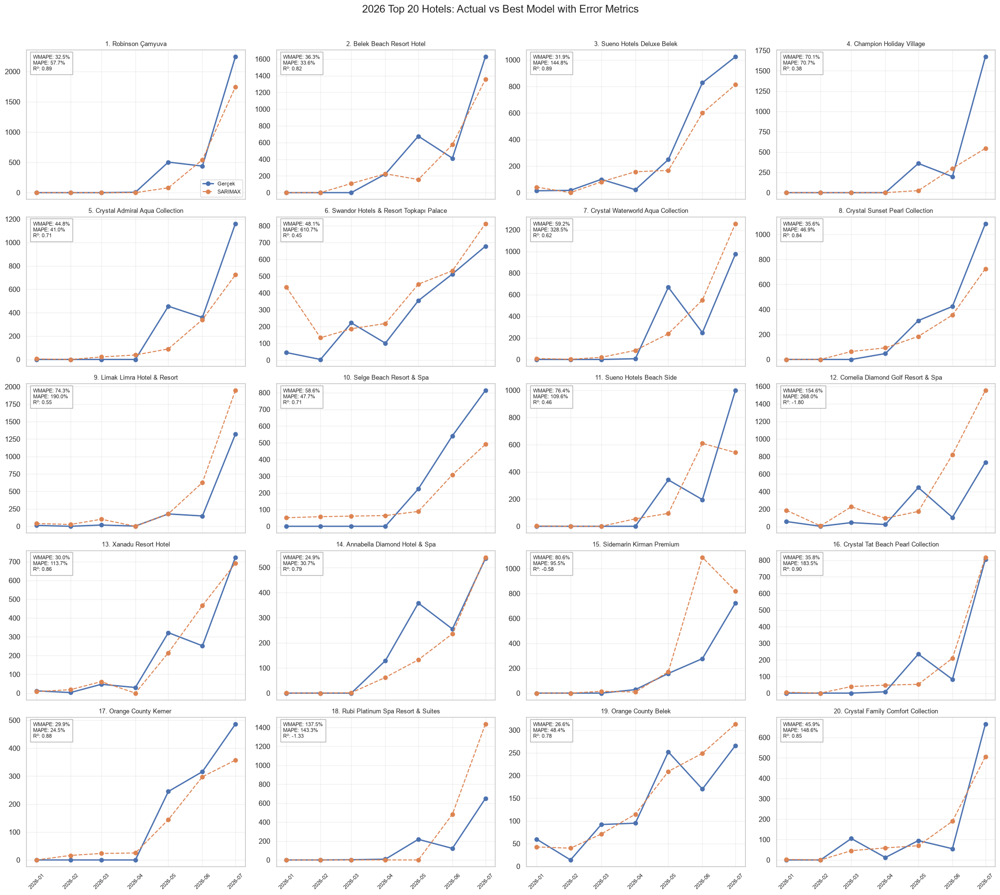

Filtered Top 20 and selected model scores:
 rank_2026  hotel_id                             hotel_name   2023   2024   2025  2026_jan_july_occupied_nights  historical_min_jan_july
         1       456                       Robinson Çamyuva 2364.0 3395.0 2499.0                         3190.0                   2364.0
         2    181147               Belek Beach Resort Hotel 1624.0 1936.0 2219.0                         2936.0                   1624.0
         3       887              Sueno Hotels Deluxe Belek 1040.0 2380.0 1376.0                         2253.0                   1040.0
         4       813               Champion Holiday Village 1245.0 1183.0  993.0                         2228.0                    993.0
         5       471        Crystal Admiral Aqua Collection 1300.0 2739.0 1827.0                         1975.0                   1300.0
         6      1266 Swandor Hotels & Resort Topkapı Palace 1077.0 2289.0 2415.0                         1917.0                   1077.

In [31]:
# Final hotel filtering and per-hotel model comparison.
MIN_HISTORICAL_JAN_JULY_INHOUSE = 200
HISTORICAL_YEARS = [2023, 2024, 2025]
hotel_monthly_all["year"] = hotel_monthly_all["month"].dt.year
hotel_monthly_all["month_num"] = hotel_monthly_all["month"].dt.month

yearly_jan_july_all = hotel_monthly_all.loc[
    hotel_monthly_all["month_num"].le(7) & hotel_monthly_all["year"].between(2023, 2026)
].groupby(["hotel_id", "hotel_name", "hotel_region_name", "year"], as_index=False)["occupied_nights"].sum()
yearly_jan_july_wide = yearly_jan_july_all.pivot_table(
    index=["hotel_id", "hotel_name", "hotel_region_name"], columns="year", values="occupied_nights", fill_value=0
).reset_index()
for historical_year in HISTORICAL_YEARS:
    if historical_year not in yearly_jan_july_wide.columns:
        yearly_jan_july_wide[historical_year] = 0
eligible_hotels = yearly_jan_july_wide.loc[
    yearly_jan_july_wide[HISTORICAL_YEARS].ge(MIN_HISTORICAL_JAN_JULY_INHOUSE).all(axis=1)
].copy()
eligible_hotels["historical_min_jan_july"] = eligible_hotels[HISTORICAL_YEARS].min(axis=1)
eligible_hotels = eligible_hotels.sort_values(2026, ascending=False).head(20).reset_index(drop=True)
eligible_hotels["rank_2026"] = np.arange(1, len(eligible_hotels) + 1)
top20_2026 = eligible_hotels.rename(columns={2026: "2026_jan_july_occupied_nights"})

selected_monthly = (top20_2026[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
                    .merge(pd.DataFrame({"month": hotel_months}), how="cross")
                    .merge(hotel_monthly_all[["hotel_id", "hotel_name", "hotel_region_name", "month", "occupied_nights"]],
                           on=["hotel_id", "hotel_name", "hotel_region_name", "month"], how="left")
                    .fillna({"occupied_nights": 0})
                    .sort_values(["rank_2026", "month"]))
selected_monthly["occupied_nights"] = selected_monthly["occupied_nights"].astype(int)
selected_monthly.to_csv(OUTPUT_DIR / "top20_hotels_monthly_inhouse_2023_2026.csv", index=False)
selected_monthly["year"] = selected_monthly["month"].dt.year
selected_monthly["month_num"] = selected_monthly["month"].dt.month
selected_jan_july = selected_monthly.loc[selected_monthly["month_num"].le(7)]
wide_selected = selected_jan_july.pivot_table(
    index=["rank_2026", "hotel_id", "hotel_name", "hotel_region_name", "year"],
    columns="month_num", values="occupied_nights", aggfunc="sum", fill_value=0
).reset_index()
wide_selected = wide_selected.rename(columns={month_num: MONTH_NAMES_TR[month_num] for month_num in range(1, 8)})
for month_name in MONTH_NAMES_TR.values():
    if month_name not in wide_selected.columns:
        wide_selected[month_name] = 0
wide_selected["ocak_temmuz_toplam"] = wide_selected[[MONTH_NAMES_TR[m] for m in range(1, 8)]].sum(axis=1)
wide_selected.sort_values(["rank_2026", "year"]).to_csv(OUTPUT_DIR / "top20_hotels_january_july_inhouse_2023_2026.csv", index=False)

hotel_scores = []
hotel_predictions = []
for hotel in top20_2026.itertuples(index=False):
    hotel_series = (selected_monthly.loc[selected_monthly["hotel_id"].eq(hotel.hotel_id)]
                    .set_index("month")["occupied_nights"].reindex(hotel_months, fill_value=0).astype(float))
    hotel_train = hotel_series.loc[HOTEL_TRAIN_START:HOTEL_TRAIN_END]
    hotel_test = hotel_series.loc[HOTEL_TEST_START:HOTEL_TEST_END]
    model_predictions = {}
    try:
        model = SARIMAX(hotel_train, order=(1, 1, 1), seasonal_order=(1, 0, 0, 12), trend="c",
                        enforce_stationarity=False, enforce_invertibility=False).fit(disp=False, maxiter=200)
        model_predictions["SARIMAX"] = model.get_forecast(steps=7).predicted_mean.clip(lower=0).to_numpy()
    except Exception:
        model_predictions["SARIMAX"] = np.full(7, np.nan)
    try:
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False,
                        seasonality_mode="multiplicative", changepoint_prior_scale=0.05, seasonality_prior_scale=10.0)
        model.fit(pd.DataFrame({"ds": hotel_train.index, "y": hotel_train.values}))
        model_predictions["Prophet"] = model.predict(pd.DataFrame({"ds": hotel_test.index}))["yhat"].clip(lower=0).to_numpy()
    except Exception:
        model_predictions["Prophet"] = np.full(7, np.nan)
    score_rows = []
    for model_name, prediction_values in model_predictions.items():
        if np.isfinite(prediction_values).all():
            score_rows.append({"rank_2026": hotel.rank_2026, "hotel_id": hotel.hotel_id,
                               "hotel_name": hotel.hotel_name, "model": model_name,
                               **hotel_metric_values(hotel_test.values, prediction_values)})
    best_hotel_model = min(score_rows, key=lambda row: (row["WMAPE"], row["MAE"]))["model"] if score_rows else "Unavailable"
    for score_row in score_rows:
        score_row["selected"] = score_row["model"] == best_hotel_model
        hotel_scores.append(score_row)
    selected_prediction = model_predictions.get(best_hotel_model, np.full(7, np.nan))
    for month, actual_value, sarimax_value, prophet_value, selected_value in zip(
        hotel_test.index, hotel_test.values, model_predictions["SARIMAX"], model_predictions["Prophet"], selected_prediction
    ):
        hotel_predictions.append({"rank_2026": hotel.rank_2026, "hotel_id": hotel.hotel_id, "hotel_name": hotel.hotel_name,
                                  "month": month, "actual": actual_value, "sarimax_prediction": sarimax_value,
                                  "prophet_prediction": prophet_value, "selected_model": best_hotel_model,
                                  "selected_prediction": selected_value})

hotel_scores_df = pd.DataFrame(hotel_scores).sort_values(["rank_2026", "selected"], ascending=[True, False])
hotel_predictions_df = pd.DataFrame(hotel_predictions)
hotel_scores_df.to_csv(OUTPUT_DIR / "top20_2026_hotel_model_scores.csv", index=False)
hotel_predictions_df.to_csv(OUTPUT_DIR / "top20_2026_hotel_predictions.csv", index=False)
top20_2026.to_csv(OUTPUT_DIR / "top20_hotels_by_2026_january_july_inhouse.csv", index=False)

fig, axes = plt.subplots(5, 4, figsize=(21, 19), sharex=True)
for axis, hotel in zip(axes.flat, top20_2026.itertuples(index=False)):
    plot_data = hotel_predictions_df.loc[hotel_predictions_df["hotel_id"].eq(hotel.hotel_id)].sort_values("month")
    selected_model = plot_data["selected_model"].iloc[0]
    selected_score = hotel_scores_df.loc[(hotel_scores_df["hotel_id"].eq(hotel.hotel_id)) & hotel_scores_df["selected"]].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2, label="Gerçek")
    axis.plot(plot_data["month"], plot_data["selected_prediction"], marker="o", linestyle="--", label=selected_model)
    axis.set_title(f"{int(hotel.rank_2026)}. {hotel.hotel_name}", fontsize=9)
    axis.text(0.03, 0.97, f"WMAPE: {selected_score['WMAPE']:.1f}%\nMAPE: {selected_score['MAPE']:.1f}%\nR²: {selected_score['R2']:.2f}",
              transform=axis.transAxes, va="top", fontsize=8,
              bbox={"facecolor": "white", "alpha": 0.8, "edgecolor": "#999999"})
    axis.tick_params(axis="x", rotation=45, labelsize=8)
    axis.grid(alpha=0.3)
axes[0, 0].legend(fontsize=8)
fig.suptitle("2026 Top 20 Hotels: Actual vs Best Model with Error Metrics", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(OUTPUT_DIR / "top20_2026_actual_vs_best_model_with_metrics.png", dpi=180)
plt.show()

print("Filtered Top 20 and selected model scores:")
print(top20_2026[["rank_2026", "hotel_id", "hotel_name", 2023, 2024, 2025, "2026_jan_july_occupied_nights", "historical_min_jan_july"]].to_string(index=False))
print(hotel_scores_df.to_string(index=False))

Top 30 hotels selected by 2026 January-July inhouse:
 hotel_id                             hotel_name hotel_region_name  2026_jan_july_occupied_nights  rank_2026                                       selection_rule
      456                       Robinson Çamyuva           Çamyuva                           3190          1 Top 30 by observed 2026 January-July occupied nights
   181147               Belek Beach Resort Hotel         Boğazkent                           2936          2 Top 30 by observed 2026 January-July occupied nights
   201949          Monachus Family Resort Sorgun            Sorgun                           2656          3 Top 30 by observed 2026 January-July occupied nights
      887              Sueno Hotels Deluxe Belek        Taşlıburun                           2253          4 Top 30 by observed 2026 January-July occupied nights
      813               Champion Holiday Village           Beldibi                           2228          5 Top 30 by observed 2026 Janu

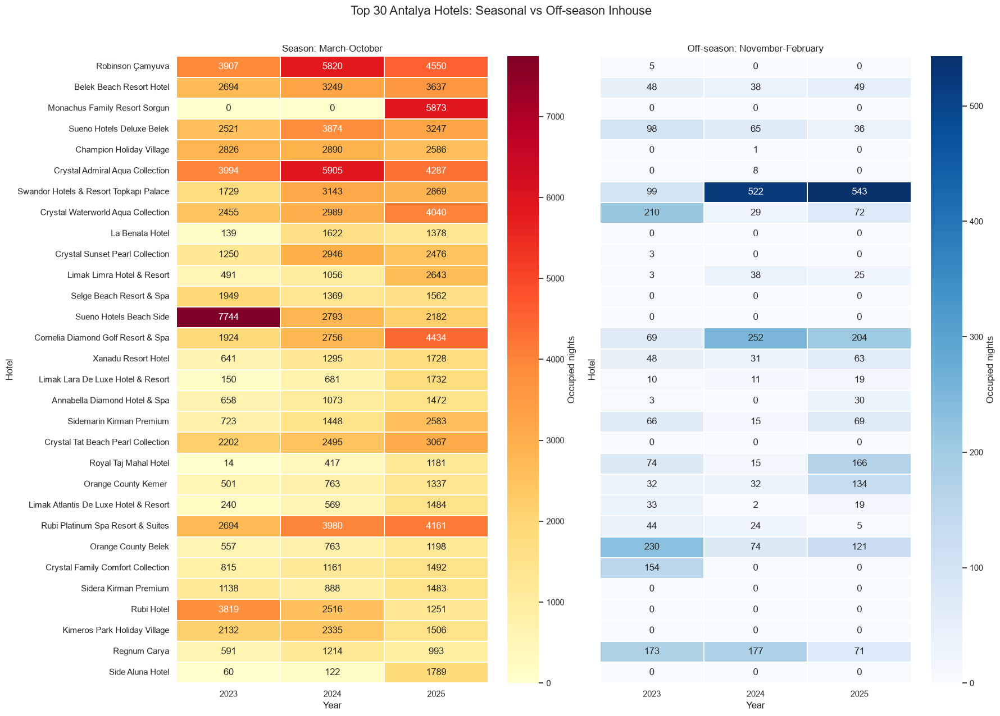

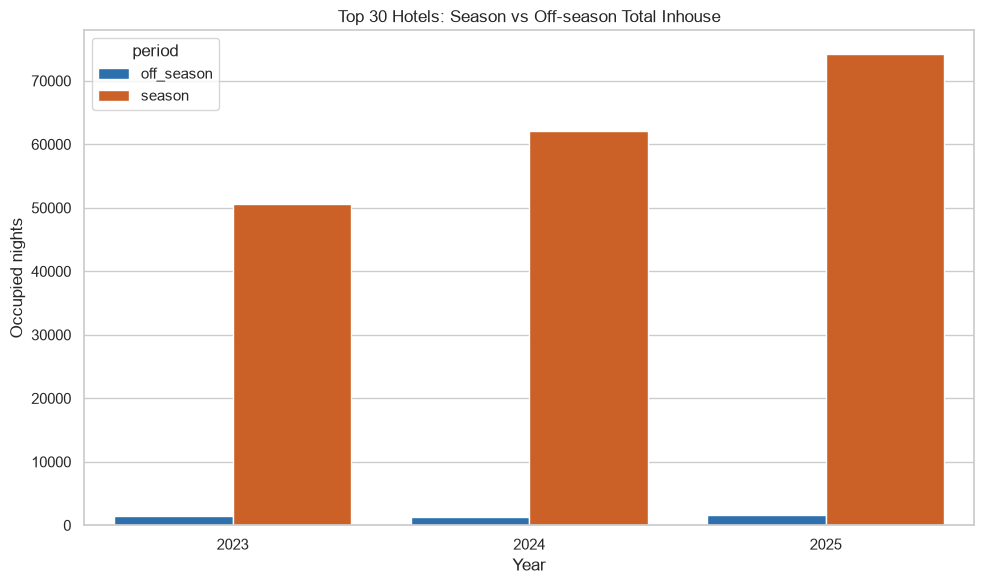

In [33]:
# Seasonal analysis for Top 30 hotels selected by observed 2026 January-July inhouse.
TOP_HOTEL_COUNT_SEASONAL = 30
SEASON_MONTHS = list(range(3, 11))
SEASON_YEARS = [2023, 2024, 2025]

seasonal_source = hotel_monthly_all.copy()
seasonal_source["year"] = seasonal_source["month"].dt.year
seasonal_source["month_num"] = seasonal_source["month"].dt.month
selection_rows = seasonal_source.loc[
    seasonal_source["year"].eq(2026) & seasonal_source["month_num"].between(1, 7)
]
selection_2026 = selection_rows.groupby(
    ["hotel_id", "hotel_name", "hotel_region_name"], as_index=False
)["occupied_nights"].sum()
selection_2026 = selection_2026.rename(columns={"occupied_nights": "2026_jan_july_occupied_nights"})
top30_seasonal = selection_2026.sort_values(
    "2026_jan_july_occupied_nights", ascending=False
).head(TOP_HOTEL_COUNT_SEASONAL).reset_index(drop=True)
top30_seasonal["rank_2026"] = np.arange(1, len(top30_seasonal) + 1)

seasonal_source = seasonal_source.loc[
    seasonal_source["hotel_id"].isin(top30_seasonal["hotel_id"]) & seasonal_source["year"].isin(SEASON_YEARS)
].copy()
seasonal_source["period"] = np.where(
    seasonal_source["month_num"].isin(SEASON_MONTHS), "season", "off_season"
)
seasonal_summary = seasonal_source.groupby(
    ["hotel_id", "hotel_name", "hotel_region_name", "year", "period"], as_index=False
)["occupied_nights"].sum()

hotel_year_period_grid = top30_seasonal[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]].merge(
    pd.DataFrame({"year": SEASON_YEARS}), how="cross"
).merge(pd.DataFrame({"period": ["season", "off_season"]}), how="cross")
seasonal_summary = hotel_year_period_grid.merge(
    seasonal_summary,
    on=["hotel_id", "hotel_name", "hotel_region_name", "year", "period"],
    how="left",
).fillna({"occupied_nights": 0})
seasonal_summary["occupied_nights"] = seasonal_summary["occupied_nights"].astype(int)
seasonal_summary = seasonal_summary.sort_values(["rank_2026", "year", "period"])
seasonal_summary.to_csv(OUTPUT_DIR / "top30_hotels_seasonal_inhouse_2023_2025.csv", index=False)

top30_seasonal["selection_rule"] = "Top 30 by observed 2026 January-July occupied nights"
top30_seasonal.to_csv(OUTPUT_DIR / "top30_hotels_by_2026_january_july_inhouse.csv", index=False)
seasonal_wide = seasonal_summary.pivot_table(
    index=["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"],
    columns=["year", "period"], values="occupied_nights", fill_value=0
).reset_index()
seasonal_wide.columns = [
    "_".join(str(part) for part in column if str(part) != "") if isinstance(column, tuple) else column
    for column in seasonal_wide.columns
]
seasonal_wide.to_csv(OUTPUT_DIR / "top30_hotels_seasonal_inhouse_2023_2025_wide.csv", index=False)

print("Top 30 hotels selected by 2026 January-July inhouse:")
print(top30_seasonal.to_string(index=False))
print("\nSeason / off-season occupied nights for 2023-2025:")
print(seasonal_wide.to_string(index=False))

season_heatmap = seasonal_summary.loc[seasonal_summary["period"].eq("season")].pivot(
    index="hotel_name", columns="year", values="occupied_nights"
).reindex(top30_seasonal["hotel_name"])
offseason_heatmap = seasonal_summary.loc[seasonal_summary["period"].eq("off_season")].pivot(
    index="hotel_name", columns="year", values="occupied_nights"
).reindex(top30_seasonal["hotel_name"])
fig, axes = plt.subplots(1, 2, figsize=(18, 13), sharey=True)
sns.heatmap(season_heatmap, annot=True, fmt=".0f", cmap="YlOrRd", linewidths=0.3, ax=axes[0], cbar_kws={"label": "Occupied nights"})
sns.heatmap(offseason_heatmap, annot=True, fmt=".0f", cmap="Blues", linewidths=0.3, ax=axes[1], cbar_kws={"label": "Occupied nights"})
axes[0].set_title("Season: March-October")
axes[1].set_title("Off-season: November-February")
for axis in axes:
    axis.set_xlabel("Year")
    axis.set_ylabel("Hotel")
fig.suptitle("Top 30 Antalya Hotels: Seasonal vs Off-season Inhouse", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(OUTPUT_DIR / "top30_season_vs_offseason_heatmaps.png", dpi=180)
plt.show()

year_period_plot = seasonal_summary.groupby(["year", "period"], as_index=False)["occupied_nights"].sum()
fig, ax = plt.subplots(figsize=(10, 6))
sns.barplot(data=year_period_plot, x="year", y="occupied_nights", hue="period", palette={"season": "#e8590c", "off_season": "#1971c2"}, ax=ax)
ax.set_title("Top 30 Hotels: Season vs Off-season Total Inhouse")
ax.set_xlabel("Year")
ax.set_ylabel("Occupied nights")
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "top30_season_vs_offseason_year_totals.png", dpi=180)
plt.show()

In [39]:
# Shared metric helper for district-level analysis.
def seasonal_model_metrics(actual, predicted):
    actual = np.asarray(actual, dtype=float)
    predicted = np.asarray(predicted, dtype=float)
    result = hotel_metric_values(actual, predicted)
    month_numbers = np.arange(1, 13)
    season_mask = np.isin(month_numbers, SEASON_MONTHS)
    off_season_mask = ~season_mask
    result["season_total_mae"] = abs(actual[season_mask].sum() - predicted[season_mask].sum())
    result["season_total_inhouse"] = actual[season_mask].sum()
    result["offseason_total_mae"] = abs(actual[off_season_mask].sum() - predicted[off_season_mask].sum())
    result["offseason_total_inhouse"] = actual[off_season_mask].sum()
    return result

Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent on the Prophet/Stan version. Consider disabling yearly seasonality or providing more history.
14:40:43 - cmdstanpy - INFO - Chain [1] start processing
14:40:43 - cmdstanpy - INFO - Chain [1] done processing
Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent on the Prophet/Stan version. Consider disabling yearly seasonality or providing more history.
14:40:43 - cmdstanpy - INFO - Chain [1] start processing
14:40:44 - cmdstanpy - INFO - Chain [1] done processing
Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent o

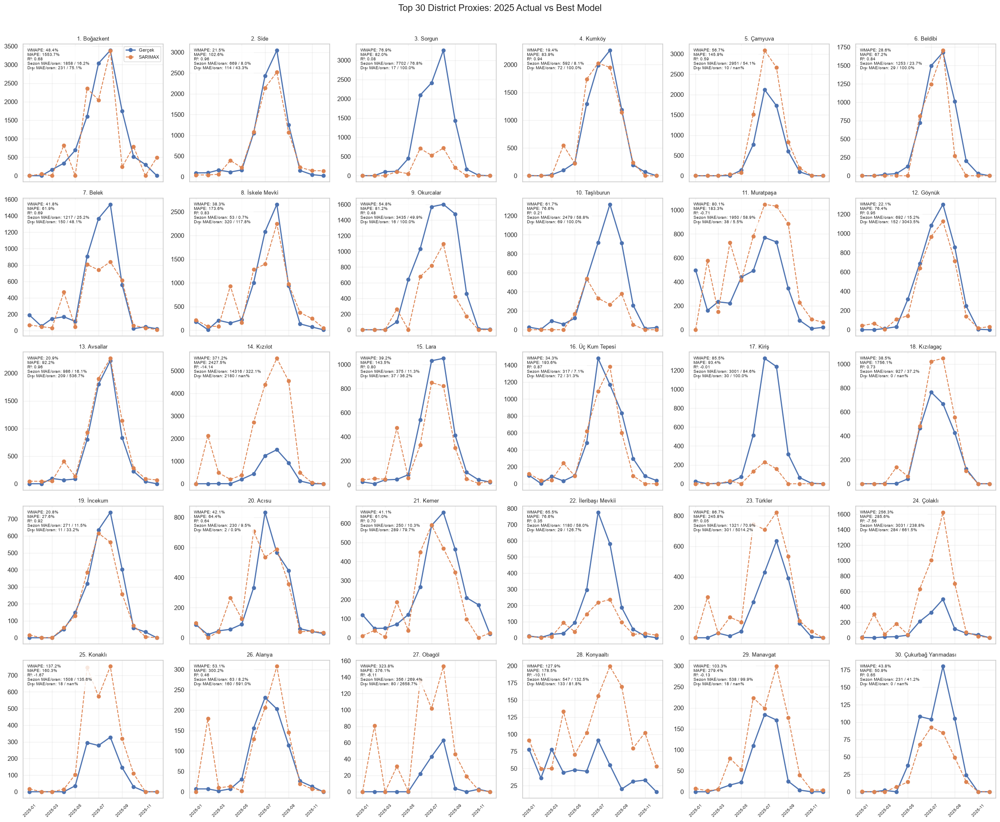

            field  antaralya_reservation_rows  nonblank_rows  blank_or_missing_rows  unique_region_values                                                                     district_mapping_note
hotel_region_name                      145239         145239                      0                    55 hotel_region_name used as ilce_proxy; verify against official district master if required
Top 30 district proxies and selected model scores:
 rank_2026          ilce_proxy   model         MAE        RMSE        MAPE      WMAPE      SMAPE         R2  season_total_mae  season_total_inhouse  offseason_total_mae  offseason_total_inhouse  selected
         1           Boğazkent SARIMAX  476.164158  643.945360 1553.732246  48.423474 129.271215   0.683193       1858.122669               11492.0           231.155145                    308.0      True
         1           Boğazkent Prophet  988.931654 1507.305207  470.418179 100.569321 191.086759  -0.735796      11399.624992               11492.0  

In [36]:
# District-level seasonal analysis using hotel_region_name as the district proxy.
# The source does not contain a separate official district column.
DISTRICT_PROXY_COLUMN = "hotel_region_name"
DISTRICT_TOP_COUNT = 30
DISTRICT_TRAIN_MONTHS = pd.date_range("2023-01-01", "2024-12-01", freq="MS")
DISTRICT_TEST_MONTHS = pd.date_range("2025-01-01", "2025-12-01", freq="MS")

antalya_region = antalya[DISTRICT_PROXY_COLUMN].astype("string").str.strip()
antalya_region_clean = antalya_region.mask(antalya_region.isna() | antalya_region.eq(""), "Bilinmeyen")
antalya_region_report = pd.DataFrame({
    "field": [DISTRICT_PROXY_COLUMN],
    "antaralya_reservation_rows": [len(antalya)],
    "nonblank_rows": [int(antalya_region.notna().sum() - antalya_region.eq("").sum())],
    "blank_or_missing_rows": [int(antalya_region.isna().sum() + antalya_region.eq("").sum())],
    "unique_region_values": [int(antalya_region_clean.nunique())],
    "district_mapping_note": ["hotel_region_name used as ilce_proxy; verify against official district master if required"],
})
antalya_region_report.to_csv(OUTPUT_DIR / "antalya_district_proxy_coverage.csv", index=False)

region_dates = hotel_expanded.copy()
region_dates["ilce_proxy"] = region_dates["hotel_id"].map(
    antalya.set_index("hotel_id")[DISTRICT_PROXY_COLUMN].astype("string").str.strip().to_dict()
).fillna("Bilinmeyen")
region_dates["ilce_proxy"] = region_dates["ilce_proxy"].replace("", "Bilinmeyen")
region_dates["year"] = region_dates["month"].dt.year
region_dates["month_num"] = region_dates["month"].dt.month

district_monthly = region_dates.groupby(["ilce_proxy", "month"], as_index=False).size().rename(columns={"size": "occupied_nights"})
district_2026 = district_monthly.loc[
    district_monthly["month"].between(pd.Timestamp("2026-01-01"), pd.Timestamp("2026-07-01"))
].groupby("ilce_proxy", as_index=False)["occupied_nights"].sum().rename(
    columns={"occupied_nights": "2026_jan_july_occupied_nights"}
)
top30_districts = district_2026.sort_values("2026_jan_july_occupied_nights", ascending=False).head(DISTRICT_TOP_COUNT).reset_index(drop=True)
top30_districts["rank_2026"] = np.arange(1, len(top30_districts) + 1)
top30_districts.to_csv(OUTPUT_DIR / "top30_district_proxies_by_2026_january_july_inhouse.csv", index=False)

selected_districts = top30_districts["ilce_proxy"].tolist()
district_series_source = district_monthly.loc[district_monthly["ilce_proxy"].isin(selected_districts)].copy()
district_series_source = district_series_source.set_index(["ilce_proxy", "month"])

# Build 2023-2025 seasonal totals and forecast 2025 from 2023-2024.
district_season_scores = []
district_predictions = []
for district in top30_districts.itertuples(index=False):
    district_series = district_series_source.loc[district.ilce_proxy, "occupied_nights"].reindex(
        pd.date_range("2023-01-01", "2025-12-01", freq="MS"), fill_value=0
    ).astype(float)
    train_values = district_series.loc[DISTRICT_TRAIN_MONTHS]
    actual_2025 = district_series.loc[DISTRICT_TEST_MONTHS].values
    candidates = {}
    try:
        district_sarimax = SARIMAX(train_values, order=(1, 1, 1), seasonal_order=(1, 0, 0, 12), trend="c",
                                    enforce_stationarity=False, enforce_invertibility=False).fit(disp=False, maxiter=200)
        candidates["SARIMAX"] = district_sarimax.get_forecast(steps=12).predicted_mean.clip(lower=0).to_numpy()
    except Exception:
        candidates["SARIMAX"] = np.full(12, np.nan)
    try:
        district_prophet = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False,
                                   seasonality_mode="multiplicative", changepoint_prior_scale=0.05,
                                   seasonality_prior_scale=10.0)
        district_prophet.fit(pd.DataFrame({"ds": train_values.index, "y": train_values.values}))
        candidates["Prophet"] = district_prophet.predict(pd.DataFrame({"ds": DISTRICT_TEST_MONTHS}))["yhat"].clip(lower=0).to_numpy()
    except Exception:
        candidates["Prophet"] = np.full(12, np.nan)
    valid = []
    for model_name, prediction in candidates.items():
        if np.isfinite(prediction).all():
            metrics_row = seasonal_model_metrics(actual_2025, prediction)
            valid.append({"rank_2026": district.rank_2026, "ilce_proxy": district.ilce_proxy,
                          "model": model_name, **metrics_row})
    if not valid:
        continue
    selected_district_model = min(valid, key=lambda row: (row["WMAPE"], row["MAE"]))["model"]
    for row in valid:
        row["selected"] = row["model"] == selected_district_model
        district_season_scores.append(row)
    for month, actual_value, prediction_value in zip(DISTRICT_TEST_MONTHS, actual_2025, candidates[selected_district_model]):
        district_predictions.append({"rank_2026": district.rank_2026, "ilce_proxy": district.ilce_proxy,
                                     "month": month, "actual": actual_value, "prediction": prediction_value,
                                     "selected_model": selected_district_model})

district_scores_df = pd.DataFrame(district_season_scores).sort_values(["rank_2026", "selected"], ascending=[True, False])
district_predictions_df = pd.DataFrame(district_predictions)
district_scores_df.to_csv(OUTPUT_DIR / "top30_district_2025_model_scores.csv", index=False)
district_predictions_df.to_csv(OUTPUT_DIR / "top30_district_2025_predictions.csv", index=False)

# Aggregate season and off-season actual/prediction totals for each selected district.
district_predictions_df["month_num"] = district_predictions_df["month"].dt.month
district_predictions_df["period"] = np.where(district_predictions_df["month_num"].isin(SEASON_MONTHS), "season", "off_season")
district_total_metrics = district_predictions_df.groupby(["rank_2026", "ilce_proxy", "selected_model", "period"]).agg(
    actual_total_inhouse=("actual", "sum"), prediction_total_inhouse=("prediction", "sum")
).reset_index()
district_total_metrics["total_mae"] = abs(district_total_metrics["actual_total_inhouse"] - district_total_metrics["prediction_total_inhouse"])
district_total_metrics["mae_ratio_pct"] = np.where(
    district_total_metrics["actual_total_inhouse"].gt(0),
    district_total_metrics["total_mae"] / district_total_metrics["actual_total_inhouse"] * 100,
    np.nan,
)
district_total_metrics.to_csv(OUTPUT_DIR / "top30_district_2025_season_offseason_metrics.csv", index=False)

# Annotated panels for all selected district proxies.
fig, axes = plt.subplots(5, 6, figsize=(24, 20), sharex=True)
for axis, district in zip(axes.flat, top30_districts.itertuples(index=False)):
    plot_data = district_predictions_df.loc[district_predictions_df["ilce_proxy"].eq(district.ilce_proxy)].sort_values("month")
    selected_score = district_scores_df.loc[(district_scores_df["ilce_proxy"].eq(district.ilce_proxy)) & district_scores_df["selected"]].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2, label="Gerçek")
    axis.plot(plot_data["month"], plot_data["prediction"], marker="o", linestyle="--", label=plot_data["selected_model"].iloc[0])
    season_metrics = district_total_metrics.loc[(district_total_metrics["ilce_proxy"].eq(district.ilce_proxy)) & district_total_metrics["period"].eq("season")].iloc[0]
    off_metrics = district_total_metrics.loc[(district_total_metrics["ilce_proxy"].eq(district.ilce_proxy)) & district_total_metrics["period"].eq("off_season")].iloc[0]
    axis.set_title(f"{int(district.rank_2026)}. {district.ilce_proxy}", fontsize=9)
    axis.text(0.03, 0.97, f"WMAPE: {selected_score['WMAPE']:.1f}%\nMAPE: {selected_score['MAPE']:.1f}%\nR²: {selected_score['R2']:.2f}\nSezon MAE/oran: {season_metrics['total_mae']:.0f} / {season_metrics['mae_ratio_pct']:.1f}%\nDışı MAE/oran: {off_metrics['total_mae']:.0f} / {off_metrics['mae_ratio_pct']:.1f}%",
              transform=axis.transAxes, va="top", fontsize=7, bbox={"facecolor": "white", "alpha": 0.82})
    axis.tick_params(axis="x", rotation=45, labelsize=7)
    axis.grid(alpha=0.3)
for axis in axes.flat[len(top30_districts):]:
    axis.set_visible(False)
axes[0, 0].legend(fontsize=8)
fig.suptitle("Top 30 District Proxies: 2025 Actual vs Best Model", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(OUTPUT_DIR / "top30_district_2025_actual_vs_model_metrics.png", dpi=180)
plt.show()

print(antalya_region_report.to_string(index=False))
print("Top 30 district proxies and selected model scores:")
print(district_scores_df.to_string(index=False))

Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent on the Prophet/Stan version. Consider disabling yearly seasonality or providing more history.
14:03:52 - cmdstanpy - INFO - Chain [1] start processing
14:04:03 - cmdstanpy - INFO - Chain [1] done processing
Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent on the Prophet/Stan version. Consider disabling yearly seasonality or providing more history.
14:04:04 - cmdstanpy - INFO - Chain [1] start processing
14:04:16 - cmdstanpy - INFO - Chain [1] done processing
Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent o

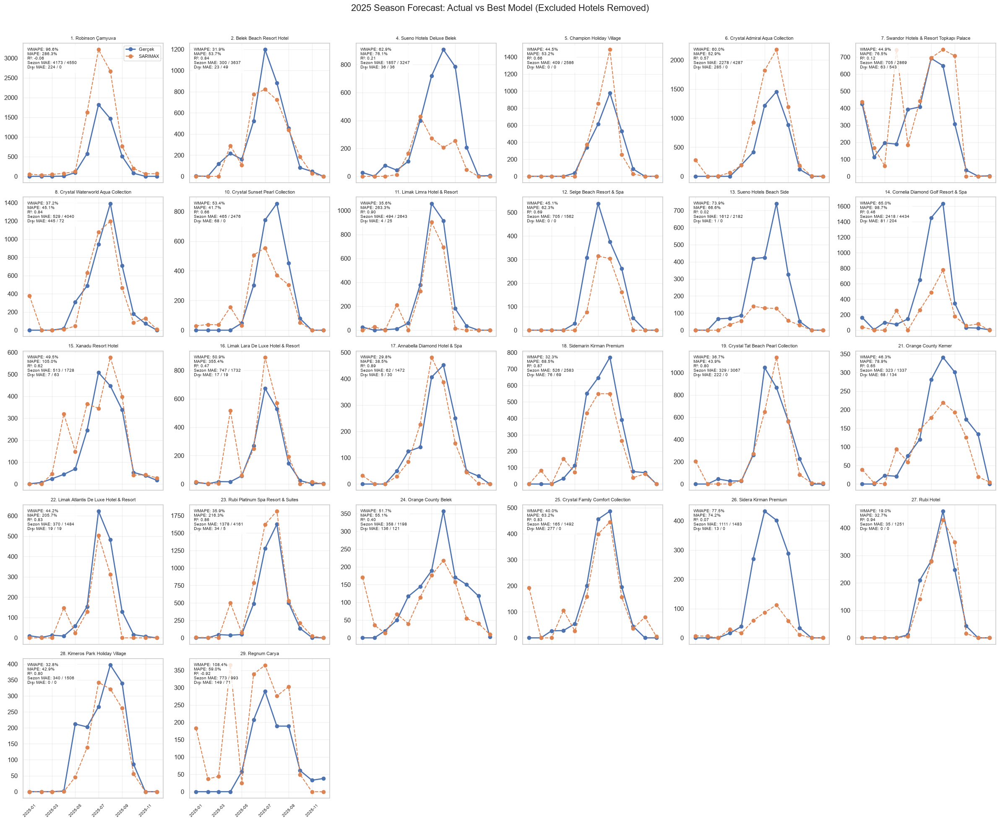

Excluded hotels: ['La Benata Hotel', 'Monachus Family Resort Sorgun', 'Royal Taj Mahal Hotel', 'Side Aluna Hotel']
Modeled hotels: 26
 rank_2026  hotel_id                             hotel_name   model        MAE        RMSE       MAPE      WMAPE      SMAPE         R2  season_total_mae  season_total_inhouse  offseason_total_mae  offseason_total_inhouse  selected
         1       456                       Robinson Çamyuva SARIMAX 366.420076  619.305223 286.257285  96.638262 128.027817  -0.060093       4172.703784                4550.0           224.337130                      0.0      True
         1       456                       Robinson Çamyuva Prophet 650.334644 1234.471681 312.245297 171.516829 102.898179  -3.212083       7798.366070                4550.0             5.649654                      0.0     False
         2    181147               Belek Beach Resort Hotel SARIMAX  97.993476  148.392195  53.679345  31.902380  58.459699   0.840604        299.547349                3637.

In [34]:
# 2025 seasonal forecast for the remaining Top 30 hotels.
EXCLUDED_SEASONAL_HOTELS = {
    "La Benata Hotel",
    "Monachus Family Resort Sorgun",
    "Royal Taj Mahal Hotel",
    "Side Aluna Hotel",
}
MODEL_TRAIN_MONTHS = pd.date_range("2023-01-01", "2024-12-01", freq="MS")
MODEL_TEST_MONTHS = pd.date_range("2025-01-01", "2025-12-01", freq="MS")
modeled_seasonal_hotels = top30_seasonal.loc[~top30_seasonal["hotel_name"].isin(EXCLUDED_SEASONAL_HOTELS)].copy()

# Scores include monthly accuracy plus aggregate season/off-season totals.
def seasonal_model_metrics(actual, predicted):
    actual = np.asarray(actual, dtype=float)
    predicted = np.asarray(predicted, dtype=float)
    result = hotel_metric_values(actual, predicted)
    month_numbers = np.arange(1, 13)
    season_mask = np.isin(month_numbers, SEASON_MONTHS)
    off_season_mask = ~season_mask
    result["season_total_mae"] = abs(actual[season_mask].sum() - predicted[season_mask].sum())
    result["season_total_inhouse"] = actual[season_mask].sum()
    result["offseason_total_mae"] = abs(actual[off_season_mask].sum() - predicted[off_season_mask].sum())
    result["offseason_total_inhouse"] = actual[off_season_mask].sum()
    return result

season_model_scores = []
season_model_predictions = []
for hotel in modeled_seasonal_hotels.itertuples(index=False):
    hotel_series = (seasonal_source.loc[seasonal_source["hotel_id"].eq(hotel.hotel_id)]
                    .set_index("month")["occupied_nights"]
                    .reindex(pd.date_range("2023-01-01", "2025-12-01", freq="MS"), fill_value=0)
                    .astype(float))
    train_values = hotel_series.loc[MODEL_TRAIN_MONTHS]
    actual_2025 = hotel_series.loc[MODEL_TEST_MONTHS].values
    candidate_predictions = {}
    try:
        sarimax_model = SARIMAX(train_values, order=(1, 1, 1), seasonal_order=(1, 0, 0, 12),
                                trend="c", enforce_stationarity=False, enforce_invertibility=False).fit(disp=False, maxiter=200)
        candidate_predictions["SARIMAX"] = sarimax_model.get_forecast(steps=12).predicted_mean.clip(lower=0).to_numpy()
    except Exception:
        candidate_predictions["SARIMAX"] = np.full(12, np.nan)
    try:
        prophet_model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False,
                                seasonality_mode="multiplicative", changepoint_prior_scale=0.05,
                                seasonality_prior_scale=10.0)
        prophet_model.fit(pd.DataFrame({"ds": train_values.index, "y": train_values.values}))
        candidate_predictions["Prophet"] = prophet_model.predict(pd.DataFrame({"ds": MODEL_TEST_MONTHS}))["yhat"].clip(lower=0).to_numpy()
    except Exception:
        candidate_predictions["Prophet"] = np.full(12, np.nan)
    valid_scores = []
    for model_name, prediction in candidate_predictions.items():
        if np.isfinite(prediction).all():
            valid_scores.append({"rank_2026": hotel.rank_2026, "hotel_id": hotel.hotel_id,
                                 "hotel_name": hotel.hotel_name, "model": model_name,
                                 **seasonal_model_metrics(actual_2025, prediction)})
    if not valid_scores:
        continue
    best_model = min(valid_scores, key=lambda row: (row["WMAPE"], row["MAE"]))["model"]
    for score_row in valid_scores:
        score_row["selected"] = score_row["model"] == best_model
        season_model_scores.append(score_row)
    for month, actual_value, prediction_value in zip(MODEL_TEST_MONTHS, actual_2025, candidate_predictions[best_model]):
        season_model_predictions.append({"rank_2026": hotel.rank_2026, "hotel_id": hotel.hotel_id,
                                         "hotel_name": hotel.hotel_name, "month": month,
                                         "actual": actual_value, "prediction": prediction_value,
                                         "selected_model": best_model})

season_model_scores_df = pd.DataFrame(season_model_scores).sort_values(["rank_2026", "selected"], ascending=[True, False])
season_model_predictions_df = pd.DataFrame(season_model_predictions)
season_model_scores_df.to_csv(OUTPUT_DIR / "top26_seasonal_2025_model_scores.csv", index=False)
season_model_predictions_df.to_csv(OUTPUT_DIR / "top26_seasonal_2025_predictions.csv", index=False)

fig, axes = plt.subplots(5, 6, figsize=(24, 20), sharex=True)
for axis, hotel in zip(axes.flat, modeled_seasonal_hotels.itertuples(index=False)):
    plot_data = season_model_predictions_df.loc[season_model_predictions_df["hotel_id"].eq(hotel.hotel_id)].sort_values("month")
    selected_score = season_model_scores_df.loc[(season_model_scores_df["hotel_id"].eq(hotel.hotel_id)) & season_model_scores_df["selected"]].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2, label="Gerçek")
    axis.plot(plot_data["month"], plot_data["prediction"], marker="o", linestyle="--", label=plot_data["selected_model"].iloc[0])
    axis.set_title(f"{int(hotel.rank_2026)}. {hotel.hotel_name}", fontsize=8)
    axis.text(0.03, 0.97, f"WMAPE: {selected_score['WMAPE']:.1f}%\nMAPE: {selected_score['MAPE']:.1f}%\nR²: {selected_score['R2']:.2f}\nSezon MAE: {selected_score['season_total_mae']:.0f} / {selected_score['season_total_inhouse']:.0f}\nDışı MAE: {selected_score['offseason_total_mae']:.0f} / {selected_score['offseason_total_inhouse']:.0f}",
              transform=axis.transAxes, va="top", fontsize=7, bbox={"facecolor": "white", "alpha": 0.82})
    axis.tick_params(axis="x", rotation=45, labelsize=7)
    axis.grid(alpha=0.3)
for axis in axes.flat[len(modeled_seasonal_hotels):]:
    axis.set_visible(False)
axes[0, 0].legend(fontsize=8)
fig.suptitle("2025 Season Forecast: Actual vs Best Model (Excluded Hotels Removed)", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(OUTPUT_DIR / "top26_seasonal_2025_actual_vs_model_metrics.png", dpi=180)
plt.show()

print("Excluded hotels:", sorted(EXCLUDED_SEASONAL_HOTELS))
print("Modeled hotels:", len(modeled_seasonal_hotels))
print(season_model_scores_df.to_string(index=False))

Season ranking - best to worst (Season MAE / Season inhouse):
 season_rank  offseason_rank  rank_2026  hotel_id                             hotel_name   model      WMAPE       MAPE        R2  season_total_mae  season_total_inhouse  season_mae_ratio_pct  offseason_total_mae  offseason_total_inhouse  offseason_mae_ratio_pct
         1.0            25.0         27    168644                             Rubi Hotel SARIMAX  19.022116  32.691808  0.936976         35.267338                1251.0              2.819132             0.000000                      0.0                      NaN
         2.0             3.0         17       906          Annabella Diamond Hotel & Spa Prophet  29.800216  38.509722  0.893255         62.089649                1472.0              4.218047             4.525962                     30.0                15.086539
         3.0             6.0          2    181147               Belek Beach Resort Hotel SARIMAX  31.902380  53.679345  0.840604        299.547349      

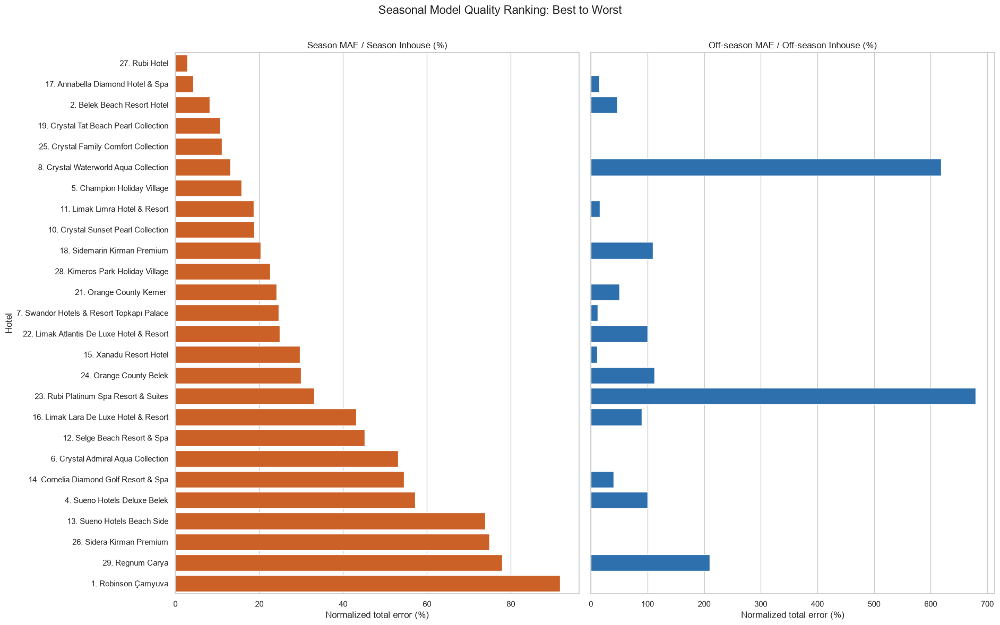

In [35]:
# Rank seasonal model results from best to worst by normalized total error.
ranking = season_model_scores_df.loc[season_model_scores_df["selected"]].copy()
ranking["season_mae_ratio_pct"] = np.where(
    ranking["season_total_inhouse"].gt(0),
    ranking["season_total_mae"] / ranking["season_total_inhouse"] * 100,
    np.nan,
)
ranking["offseason_mae_ratio_pct"] = np.where(
    ranking["offseason_total_inhouse"].gt(0),
    ranking["offseason_total_mae"] / ranking["offseason_total_inhouse"] * 100,
    np.nan,
)
ranking["season_rank"] = ranking["season_mae_ratio_pct"].rank(method="first", na_option="bottom")
ranking["offseason_rank"] = ranking["offseason_mae_ratio_pct"].rank(method="first", na_option="bottom")

season_ranking = ranking.sort_values(["season_mae_ratio_pct", "WMAPE"], na_position="last")
offseason_ranking = ranking.sort_values(["offseason_mae_ratio_pct", "WMAPE"], na_position="last")
ranking_columns = [
    "season_rank", "offseason_rank", "rank_2026", "hotel_id", "hotel_name", "model",
    "WMAPE", "MAPE", "R2", "season_total_mae", "season_total_inhouse", "season_mae_ratio_pct",
    "offseason_total_mae", "offseason_total_inhouse", "offseason_mae_ratio_pct",
]
season_ranking[ranking_columns].to_csv(OUTPUT_DIR / "top26_seasonal_ranking_best_to_worst.csv", index=False)
offseason_ranking[ranking_columns].to_csv(OUTPUT_DIR / "top26_offseason_ranking_best_to_worst.csv", index=False)

print("Season ranking - best to worst (Season MAE / Season inhouse):")
print(season_ranking[ranking_columns].to_string(index=False))
print("\nOff-season ranking - best to worst (Off-season MAE / Off-season inhouse):")
print(offseason_ranking[ranking_columns].to_string(index=False))

# Side-by-side normalized error ratios for the modeled hotels.
plot_ranking = ranking.sort_values("season_mae_ratio_pct", na_position="last").copy()
plot_ranking["label"] = plot_ranking["rank_2026"].astype(int).astype(str) + ". " + plot_ranking["hotel_name"]
fig, axes = plt.subplots(1, 2, figsize=(19, 12), sharey=True)
sns.barplot(data=plot_ranking, y="label", x="season_mae_ratio_pct", color="#e8590c", ax=axes[0])
sns.barplot(data=plot_ranking, y="label", x="offseason_mae_ratio_pct", color="#1971c2", ax=axes[1])
axes[0].set_title("Season MAE / Season Inhouse (%)")
axes[1].set_title("Off-season MAE / Off-season Inhouse (%)")
for axis in axes:
    axis.set_xlabel("Normalized total error (%)")
    axis.set_ylabel("Hotel")
fig.suptitle("Seasonal Model Quality Ranking: Best to Worst", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(OUTPUT_DIR / "top26_seasonal_error_ratio_rankings.png", dpi=180)
plt.show()

Region-to-district mapping coverage:
district
Alanya        11
Manavgat       9
Serik          8
Kemer          6
Muratpaşa      5
Kumluca        4
Kaş            4
Aksu           1
Döşemealtı     1
Finike         1
Kepez          1
Konyaaltı      1

All Antalya districts, season and off-season inhouse:
  district  2023_off_season  2023_season  2024_off_season  2024_season  2025_off_season  2025_season
      Aksu              0.0          0.0              0.0         14.0              1.0          2.0
    Alanya            414.0      22348.0            112.0      19459.0            125.0      19304.0
Döşemealtı              0.0          0.0              0.0          0.0              0.0          1.0
    Finike              0.0         68.0              0.0          9.0              4.0          8.0
       Kaş             11.0       1704.0              5.0       2246.0              7.0       1585.0
     Kemer            453.0      24100.0            297.0      29248.0            580.0  

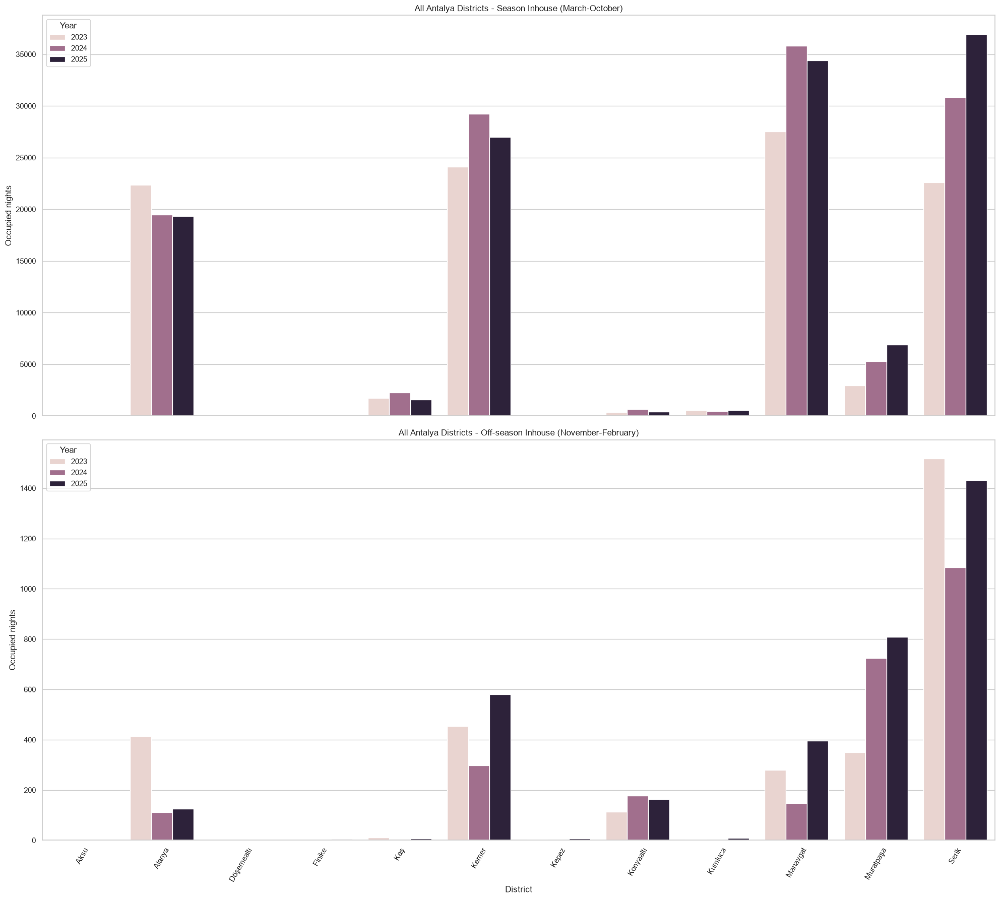

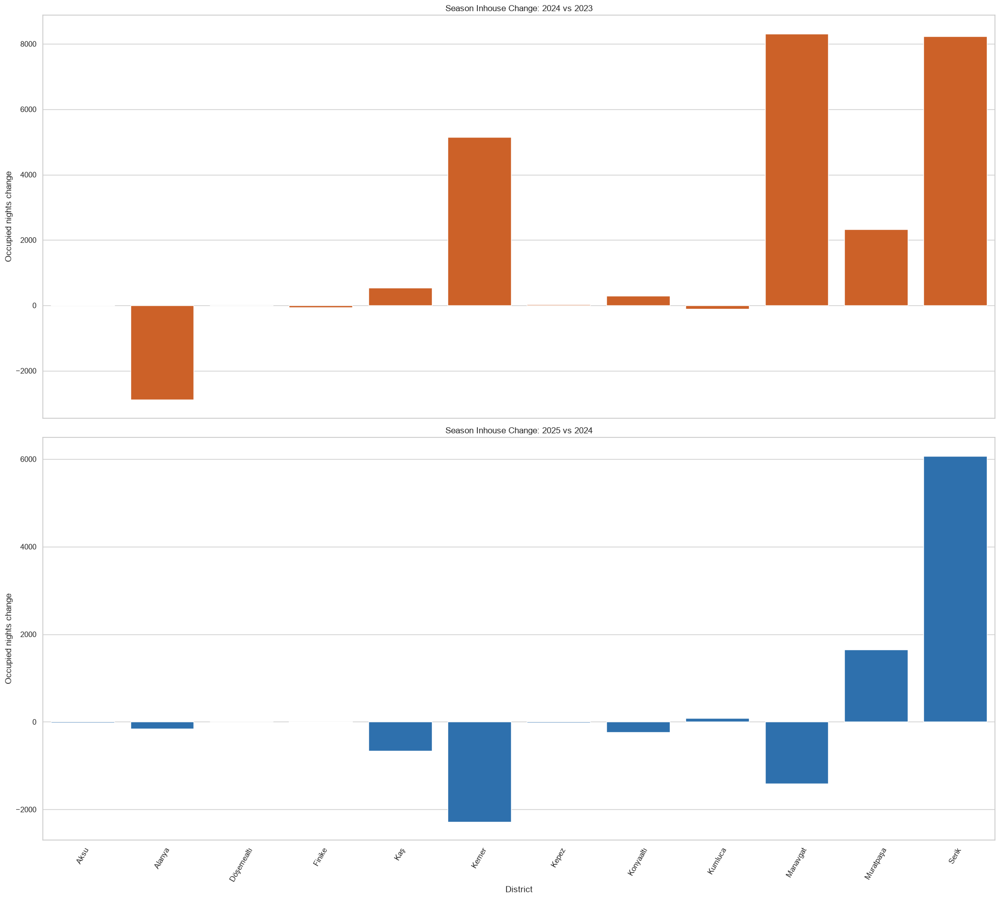

Mapped regions: 52 / 52
District count: 12


In [38]:
# All Antalya districts: map hotel regions to official district proxies and aggregate all hotels.
REGION_TO_DISTRICT = {
    "Acısu": "Serik", "Adrasan": "Kumluca", "Aksu": "Aksu", "Alanya": "Alanya", "Avsallar": "Alanya",
    "Beldibi": "Kemer", "Belek": "Serik", "Boğazkent": "Serik", "Çamyuva": "Kemer", "Çıralı": "Kumluca",
    "Çolaklı": "Manavgat", "Çukurbağ Yarımadası": "Kaş", "Dimçayı": "Alanya", "Döşemealtı": "Döşemealtı",
    "Evrenseki": "Manavgat", "Falez": "Muratpaşa", "Finike": "Finike", "Gazipaşa": "Gazipaşa",
    "Göynük": "Kemer", "İleribaşı Mevkii": "Serik", "İncekum": "Alanya", "İskele Mevki": "Serik",
    "Kaleiçi": "Muratpaşa", "Kalkan": "Kaş", "Kargıcak": "Alanya", "Karya Mevkii": "Serik",
    "Kaş": "Kaş", "Kemer": "Kemer", "Kepez": "Kepez", "Kestel": "Alanya", "Kiriş": "Kemer",
    "Kızılagaç": "Manavgat", "Kızılot": "Manavgat", "Konaklı": "Alanya", "Konyaaltı": "Konyaaltı",
    "Küçük Çakıl Mevkii": "Kaş", "Kumköy": "Manavgat", "Kumluca": "Kumluca", "Lara": "Muratpaşa",
    "Mahmutlar": "Alanya", "Manavgat": "Manavgat", "Merkez": "Muratpaşa", "Muratpaşa": "Muratpaşa",
    "Oba": "Alanya", "Obagöl": "Alanya", "Okurcalar": "Alanya", "Olimpos": "Kumluca", "Serik": "Serik",
    "Side": "Manavgat", "Sorgun": "Manavgat", "Taşlıburun": "Serik", "Tekirova": "Kemer",
    "Titreyengöl": "Manavgat", "Türkler": "Alanya", "Üç Kum Tepesi": "Serik",
}

all_region_values = sorted(region_dates["ilce_proxy"].dropna().astype(str).str.strip().unique())
region_mapping = pd.DataFrame({"region": all_region_values})
region_mapping["district"] = region_mapping["region"].map(REGION_TO_DISTRICT).fillna("Eşleşmeyen")
region_mapping.to_csv(OUTPUT_DIR / "antalya_region_to_district_mapping.csv", index=False)

region_dates["district"] = region_dates["ilce_proxy"].map(REGION_TO_DISTRICT).fillna("Eşleşmeyen")
region_dates["period"] = np.where(region_dates["month_num"].isin(SEASON_MONTHS), "season", "off_season")
region_dates["occupied_nights"] = 1
region_dates = region_dates.loc[region_dates["year"].isin([2023, 2024, 2025])]
district_period_totals = region_dates.groupby(["district", "year", "period"], as_index=False)["occupied_nights"].sum()
districts = sorted(district_period_totals["district"].unique())
district_grid = pd.DataFrame({"district": districts}).merge(pd.DataFrame({"year": [2023, 2024, 2025]}), how="cross").merge(pd.DataFrame({"period": ["season", "off_season"]}), how="cross")
district_period_totals = district_grid.merge(district_period_totals, on=["district", "year", "period"], how="left").fillna({"occupied_nights": 0})
district_period_totals["occupied_nights"] = district_period_totals["occupied_nights"].astype(int)
district_period_totals.to_csv(OUTPUT_DIR / "all_districts_season_offseason_inhouse_2023_2025.csv", index=False)

district_wide = district_period_totals.pivot_table(index="district", columns=["year", "period"], values="occupied_nights", fill_value=0).reset_index()
district_wide.columns = ["_".join(str(part) for part in column if str(part) != "") if isinstance(column, tuple) else column for column in district_wide.columns]
district_wide.to_csv(OUTPUT_DIR / "all_districts_season_offseason_inhouse_2023_2025_wide.csv", index=False)

yoy = district_period_totals.pivot_table(index=["district", "period"], columns="year", values="occupied_nights", fill_value=0).reset_index()
for current_year, previous_year in [(2024, 2023), (2025, 2024)]:
    yoy[f"change_{current_year}_vs_{previous_year}"] = yoy[current_year] - yoy[previous_year]
    yoy[f"change_pct_{current_year}_vs_{previous_year}"] = np.where(yoy[previous_year].gt(0), (yoy[current_year] - yoy[previous_year]) / yoy[previous_year] * 100, np.nan)
yoy.to_csv(OUTPUT_DIR / "all_districts_season_offseason_yoy_changes.csv", index=False)

print("Region-to-district mapping coverage:")
print(region_mapping["district"].value_counts().to_string())
print("\nAll Antalya districts, season and off-season inhouse:")
print(district_wide.to_string(index=False))
print("\nYear-over-year changes:")
print(yoy.to_string(index=False))

plot_data = district_period_totals.copy()
fig, axes = plt.subplots(2, 1, figsize=(20, 18), sharex=True)
sns.barplot(data=plot_data.loc[plot_data["period"].eq("season")], x="district", y="occupied_nights", hue="year", ax=axes[0])
sns.barplot(data=plot_data.loc[plot_data["period"].eq("off_season")], x="district", y="occupied_nights", hue="year", ax=axes[1])
axes[0].set_title("All Antalya Districts - Season Inhouse (March-October)")
axes[1].set_title("All Antalya Districts - Off-season Inhouse (November-February)")
for axis in axes:
    axis.set_xlabel("District")
    axis.set_ylabel("Occupied nights")
    axis.tick_params(axis="x", rotation=60)
    axis.legend(title="Year")
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "all_districts_season_offseason_by_year.png", dpi=180)
plt.show()

yoy_plot = yoy.copy()
fig, axes = plt.subplots(2, 1, figsize=(20, 18), sharex=True)
sns.barplot(data=yoy_plot.loc[yoy_plot["period"].eq("season")], x="district", y="change_2024_vs_2023", color="#e8590c", ax=axes[0])
sns.barplot(data=yoy_plot.loc[yoy_plot["period"].eq("season")], x="district", y="change_2025_vs_2024", color="#1971c2", ax=axes[1])
axes[0].set_title("Season Inhouse Change: 2024 vs 2023")
axes[1].set_title("Season Inhouse Change: 2025 vs 2024")
for axis in axes:
    axis.set_xlabel("District")
    axis.set_ylabel("Occupied nights change")
    axis.tick_params(axis="x", rotation=60)
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "all_districts_season_yoy_changes.png", dpi=180)
plt.show()

print(f"Mapped regions: {(region_mapping['district'] != 'Eşleşmeyen').sum()} / {len(region_mapping)}")
print(f"District count: {len(districts)}")

ALL OFFICIAL ANTALYA DISTRICTS - SEASON / OFF-SEASON INHOUSE
  district  2023_off_season  2023_season  2024_off_season  2024_season  2025_off_season  2025_season
    Akseki              0.0          0.0              0.0          0.0              0.0          0.0
      Aksu              0.0          0.0              0.0         14.0              1.0          2.0
    Alanya            414.0      22348.0            112.0      19459.0            125.0      19304.0
     Demre              0.0          0.0              0.0          0.0              0.0          0.0
Döşemealtı              0.0          0.0              0.0          0.0              0.0          1.0
    Elmalı              0.0          0.0              0.0          0.0              0.0          0.0
    Finike              0.0         68.0              0.0          9.0              4.0          8.0
  Gazipaşa              0.0          0.0              0.0          0.0              0.0          0.0
 Gündoğmuş              0.0   

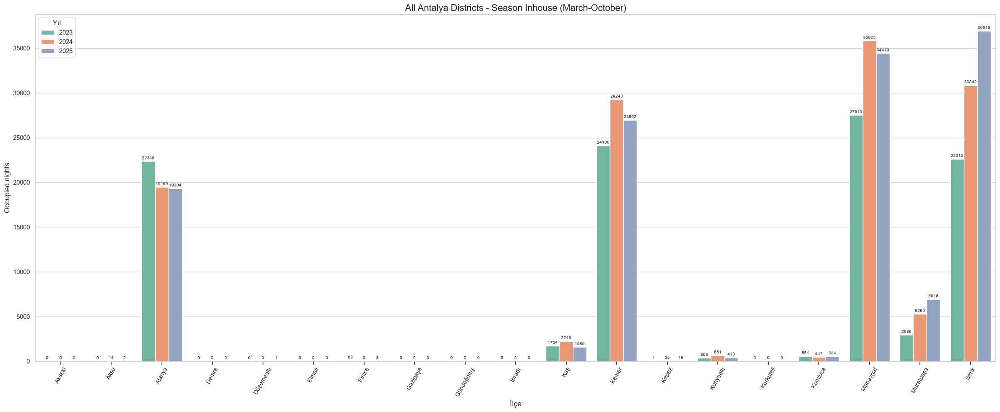

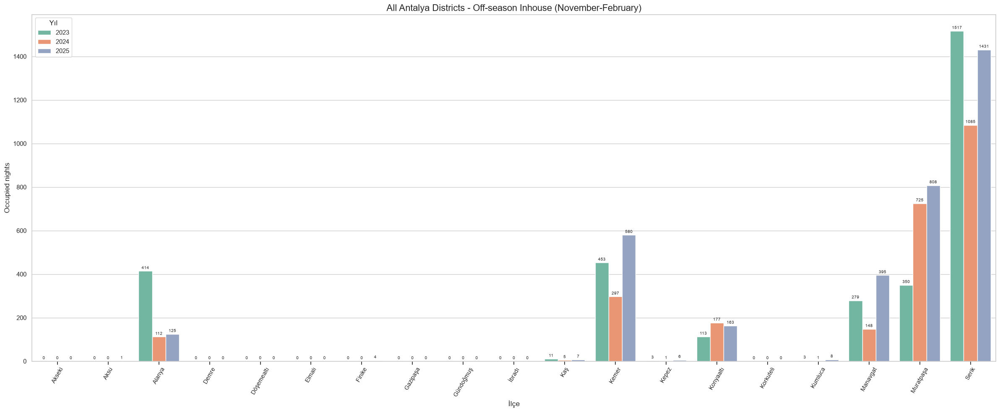

Full district outputs:
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\all_official_antalya_districts_season_offseason_inhouse_2023_2025.csv
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\all_official_antalya_districts_season_offseason_inhouse_2023_2025_wide.csv
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\all_districts_season_inhouse_readable.png
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\all_districts_offseason_inhouse_readable.png


In [40]:
# Full district table and readable plots with district labels on both charts.
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.width", 240)
pd.set_option("display.expand_frame_repr", False)

OFFICIAL_ANTALYA_DISTRICTS = [
    "Akseki", "Aksu", "Alanya", "Demre", "Döşemealtı", "Elmalı", "Finike", "Gazipaşa",
    "Gündoğmuş", "İbradı", "Kaş", "Kemer", "Kepez", "Konyaaltı", "Korkuteli", "Kumluca",
    "Manavgat", "Muratpaşa", "Serik",
]
full_district_grid = pd.DataFrame({"district": OFFICIAL_ANTALYA_DISTRICTS}).merge(
    pd.DataFrame({"year": [2023, 2024, 2025]}), how="cross"
).merge(pd.DataFrame({"period": ["season", "off_season"]}), how="cross")
full_district_totals = full_district_grid.merge(
    district_period_totals, on=["district", "year", "period"], how="left"
).fillna({"occupied_nights": 0})
full_district_totals["occupied_nights"] = full_district_totals["occupied_nights"].astype(int)
full_district_totals.to_csv(OUTPUT_DIR / "all_official_antalya_districts_season_offseason_inhouse_2023_2025.csv", index=False)

full_district_wide = full_district_totals.pivot_table(
    index="district", columns=["year", "period"], values="occupied_nights", fill_value=0
).reset_index()
full_district_wide.columns = [
    "_".join(str(part) for part in column if str(part) != "") if isinstance(column, tuple) else column
    for column in full_district_wide.columns
]
full_district_wide.to_csv(OUTPUT_DIR / "all_official_antalya_districts_season_offseason_inhouse_2023_2025_wide.csv", index=False)

print("ALL OFFICIAL ANTALYA DISTRICTS - SEASON / OFF-SEASON INHOUSE")
print(full_district_wide.to_string(index=False))

# Separate readable figures: each chart has its own district labels below the bars.
for period_name, title, color, file_name in [
    ("season", "All Antalya Districts - Season Inhouse (March-October)", "#d95f02", "all_districts_season_inhouse_readable.png"),
    ("off_season", "All Antalya Districts - Off-season Inhouse (November-February)", "#1b9e77", "all_districts_offseason_inhouse_readable.png"),
]:
    chart_data = full_district_totals.loc[full_district_totals["period"].eq(period_name)].copy()
    fig, ax = plt.subplots(figsize=(24, 10))
    sns.barplot(data=chart_data, x="district", y="occupied_nights", hue="year", palette="Set2", ax=ax)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel("İlçe", fontsize=12)
    ax.set_ylabel("Occupied nights", fontsize=12)
    ax.tick_params(axis="x", which="both", bottom=True, labelbottom=True, rotation=60, labelsize=10)
    ax.legend(title="Yıl")
    for container in ax.containers:
        ax.bar_label(container, fmt="%.0f", fontsize=7, padding=2)
    fig.tight_layout()
    fig.savefig(OUTPUT_DIR / file_name, dpi=180, bbox_inches="tight")
    plt.show()

print("Full district outputs:")
print(OUTPUT_DIR / "all_official_antalya_districts_season_offseason_inhouse_2023_2025.csv")
print(OUTPUT_DIR / "all_official_antalya_districts_season_offseason_inhouse_2023_2025_wide.csv")
print(OUTPUT_DIR / "all_districts_season_inhouse_readable.png")
print(OUTPUT_DIR / "all_districts_offseason_inhouse_readable.png")

Active districts with sales: 12
  district  2023_off_season  2023_season  2024_off_season  2024_season  2025_off_season  2025_season
      Aksu              0.0          0.0              0.0         14.0              1.0          2.0
    Alanya            414.0      22348.0            112.0      19459.0            125.0      19304.0
Döşemealtı              0.0          0.0              0.0          0.0              0.0          1.0
    Finike              0.0         68.0              0.0          9.0              4.0          8.0
       Kaş             11.0       1704.0              5.0       2246.0              7.0       1585.0
     Kemer            453.0      24100.0            297.0      29248.0            580.0      26962.0
     Kepez              3.0          1.0              1.0         35.0              6.0         16.0
 Konyaaltı            113.0        363.0            177.0        651.0            163.0        413.0
   Kumluca              3.0        554.0              1.0  

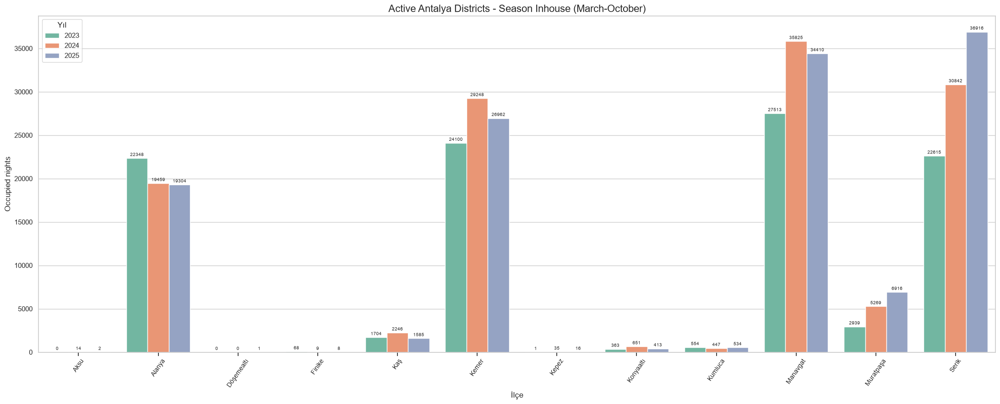

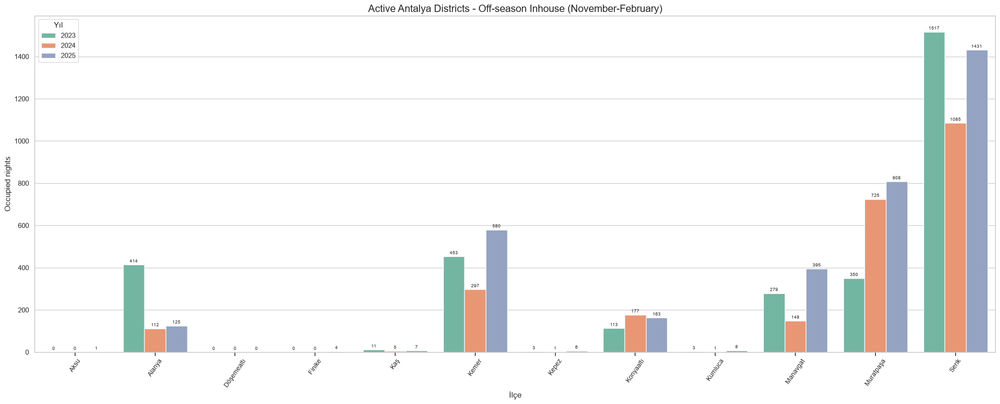

Active district outputs:
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\active_antalya_districts_season_offseason_inhouse_2023_2025_wide.csv
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\active_districts_season_inhouse.png
c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\active_districts_offseason_inhouse.png


In [41]:
# Active districts only: exclude official districts with zero inhouse across 2023-2025.
active_district_names = (full_district_totals.groupby("district")["occupied_nights"].sum()
                         .loc[lambda values: values.gt(0)].index.tolist())
active_district_totals = full_district_totals.loc[full_district_totals["district"].isin(active_district_names)].copy()
active_district_totals = active_district_totals.sort_values(["district", "year", "period"])
active_district_totals.to_csv(OUTPUT_DIR / "active_antalya_districts_season_offseason_inhouse_2023_2025.csv", index=False)

active_district_wide = active_district_totals.pivot_table(
    index="district", columns=["year", "period"], values="occupied_nights", fill_value=0
).reset_index()
active_district_wide.columns = [
    "_".join(str(part) for part in column if str(part) != "") if isinstance(column, tuple) else column
    for column in active_district_wide.columns
]
active_district_wide.to_csv(OUTPUT_DIR / "active_antalya_districts_season_offseason_inhouse_2023_2025_wide.csv", index=False)

print(f"Active districts with sales: {len(active_district_names)}")
print(active_district_wide.to_string(index=False))

for period_name, title, file_name in [
    ("season", "Active Antalya Districts - Season Inhouse (March-October)", "active_districts_season_inhouse.png"),
    ("off_season", "Active Antalya Districts - Off-season Inhouse (November-February)", "active_districts_offseason_inhouse.png"),
]:
    chart_data = active_district_totals.loc[active_district_totals["period"].eq(period_name)].copy()
    fig, ax = plt.subplots(figsize=(22, 9))
    sns.barplot(data=chart_data, x="district", y="occupied_nights", hue="year", palette="Set2", ax=ax)
    ax.set_title(title, fontsize=16)
    ax.set_xlabel("İlçe", fontsize=12)
    ax.set_ylabel("Occupied nights", fontsize=12)
    ax.tick_params(axis="x", bottom=True, labelbottom=True, rotation=55, labelsize=10)
    ax.legend(title="Yıl")
    for container in ax.containers:
        ax.bar_label(container, fmt="%.0f", fontsize=7, padding=2)
    fig.tight_layout()
    fig.savefig(OUTPUT_DIR / file_name, dpi=180, bbox_inches="tight")
    plt.show()

print("Active district outputs:")
print(OUTPUT_DIR / "active_antalya_districts_season_offseason_inhouse_2023_2025_wide.csv")
print(OUTPUT_DIR / "active_districts_season_inhouse.png")
print(OUTPUT_DIR / "active_districts_offseason_inhouse.png")

Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent on the Prophet/Stan version. Consider disabling yearly seasonality or providing more history.
16:15:28 - cmdstanpy - INFO - Chain [1] start processing
16:15:39 - cmdstanpy - INFO - Chain [1] done processing
Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent on the Prophet/Stan version. Consider disabling yearly seasonality or providing more history.
16:15:39 - cmdstanpy - INFO - Chain [1] start processing
16:15:39 - cmdstanpy - INFO - Chain [1] done processing
Yearly seasonality is enabled with less than 730 days (approximately 2 years) of history. The model may be under-identified, and the trend/seasonality decomposition can be unstable and dependent o

Season ratio ranking - best to worst:
 season_rank  offseason_rank   district   model         MAE        RMSE       MAPE      WMAPE          R2  season_total_mae  season_total_inhouse  season_mae_ratio_pct  offseason_total_mae  offseason_total_inhouse  offseason_mae_ratio_pct
         1.0            10.0      Kemer SARIMAX  511.644288  677.591667  85.177742  22.292250    0.945719       2254.102598               26962.0              8.360294           580.000000                    580.0               100.000000
         2.0             3.0    Kumluca Prophet   14.761921   22.651490 111.737965  32.683219    0.876784         46.774041                 534.0              8.759184             0.858012                      8.0                10.725152
         3.0             6.0      Serik SARIMAX 1005.528062 1321.714497  65.003947  31.466182    0.882413       3360.818780               36916.0              9.103962          1037.151891                   1431.0                72.477421
      

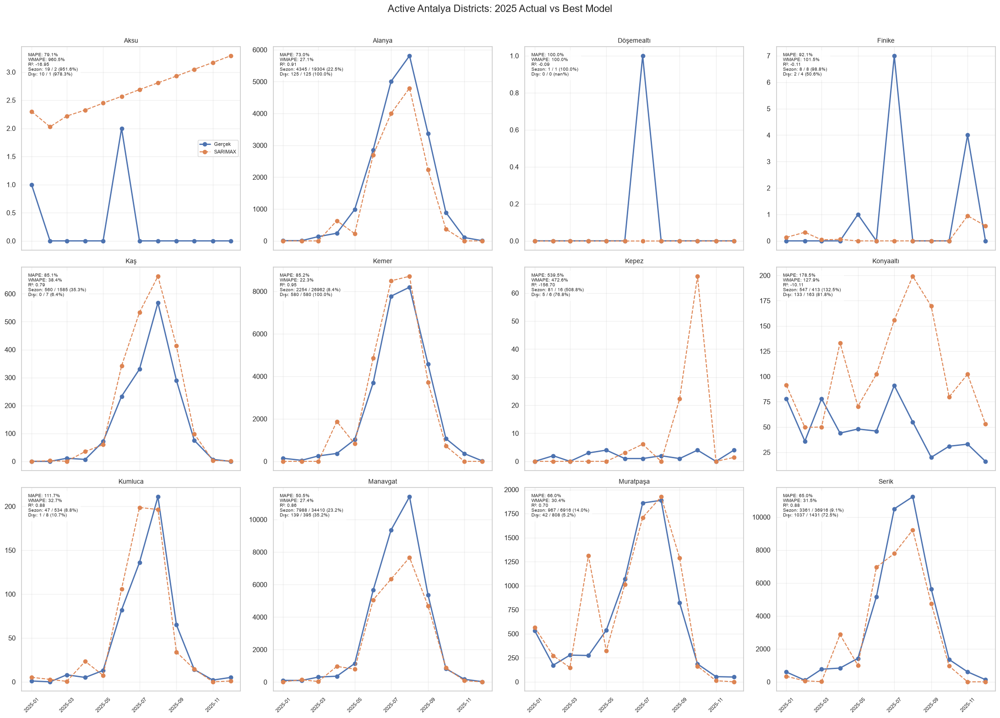

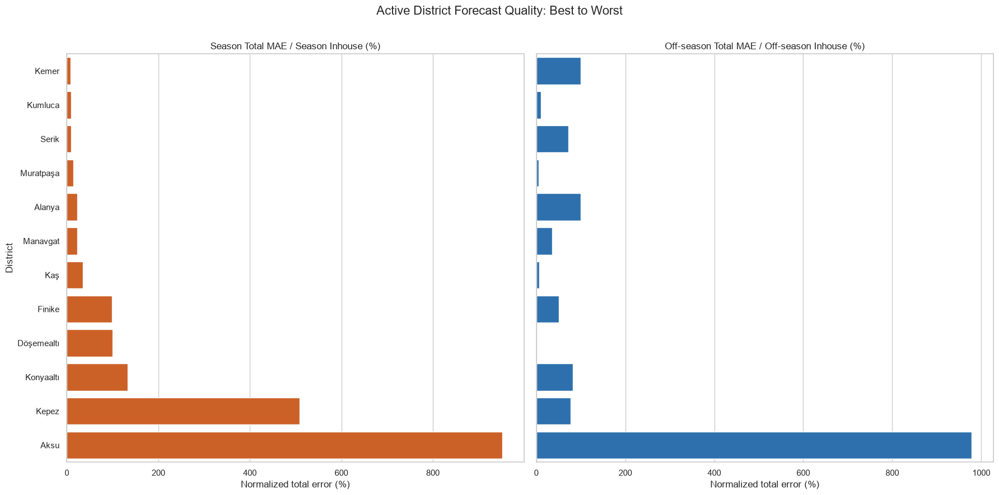

In [3]:
# Active district forecasting: self-contained after the main data preparation cell.
DISTRICT_MODEL_TRAIN = pd.date_range("2023-01-01", "2024-12-01", freq="MS")
DISTRICT_MODEL_TEST = pd.date_range("2025-01-01", "2025-12-01", freq="MS")
SEASON_MONTHS = list(range(3, 11))
REGION_TO_DISTRICT = {
    "Acısu": "Serik", "Adrasan": "Kumluca", "Aksu": "Aksu", "Alanya": "Alanya", "Avsallar": "Alanya", "Beldibi": "Kemer", "Belek": "Serik", "Boğazkent": "Serik", "Çamyuva": "Kemer", "Çıralı": "Kumluca", "Çolaklı": "Manavgat", "Çukurbağ Yarımadası": "Kaş", "Dimçayı": "Alanya", "Döşemealtı": "Döşemealtı", "Evrenseki": "Manavgat", "Falez": "Muratpaşa", "Finike": "Finike", "Gazipaşa": "Gazipaşa", "Göynük": "Kemer", "İleribaşı Mevkii": "Serik", "İncekum": "Alanya", "İskele Mevki": "Serik", "Kaleiçi": "Muratpaşa", "Kalkan": "Kaş", "Kargıcak": "Alanya", "Karya Mevkii": "Serik", "Kaş": "Kaş", "Kemer": "Kemer", "Kepez": "Kepez", "Kestel": "Alanya", "Kiriş": "Kemer", "Kızılagaç": "Manavgat", "Kızılot": "Manavgat", "Konaklı": "Alanya", "Konyaaltı": "Konyaaltı", "Küçük Çakıl Mevkii": "Kaş", "Kumköy": "Manavgat", "Kumluca": "Kumluca", "Lara": "Muratpaşa", "Mahmutlar": "Alanya", "Manavgat": "Manavgat", "Merkez": "Muratpaşa", "Muratpaşa": "Muratpaşa", "Oba": "Alanya", "Obagöl": "Alanya", "Okurcalar": "Alanya", "Olimpos": "Kumluca", "Serik": "Serik", "Side": "Manavgat", "Sorgun": "Manavgat", "Taşlıburun": "Serik", "Tekirova": "Kemer", "Titreyengöl": "Manavgat", "Türkler": "Alanya", "Üç Kum Tepesi": "Serik",
}

# Expand all reservation nights while retaining district mapping.
district_reservations = antalya[["hotel_region_name", "checkin", "checkout"]].copy()
district_reservations["district"] = district_reservations["hotel_region_name"].astype("string").str.strip().map(REGION_TO_DISTRICT).fillna("Eşleşmeyen")
district_reservations["stay_start"] = district_reservations["checkin"].clip(lower=pd.Timestamp("2023-01-01"))
district_reservations["stay_end"] = district_reservations["checkout"].clip(upper=pd.Timestamp("2025-12-31") + pd.Timedelta(days=1))
district_reservations = district_reservations.loc[district_reservations["stay_end"].gt(district_reservations["stay_start"])].copy()
district_reservations["night_count"] = (district_reservations["stay_end"] - district_reservations["stay_start"]).dt.days
district_nights = pd.DataFrame({
    "month": np.concatenate([pd.date_range(start, end - pd.Timedelta(days=1), freq="D") for start, end in zip(district_reservations["stay_start"], district_reservations["stay_end"])]),
    "district": np.repeat(district_reservations["district"].to_numpy(), district_reservations["night_count"].to_numpy()),
})
district_nights["month"] = district_nights["month"].dt.to_period("M").dt.to_timestamp()
district_monthly_model = district_nights.groupby(["district", "month"], as_index=False).size().rename(columns={"size": "occupied_nights"})
active_districts_for_model = district_monthly_model.groupby("district")["occupied_nights"].sum().loc[lambda values: values.gt(0)].index.tolist()

def district_metric_values(actual, predicted):
    actual = np.asarray(actual, dtype=float)
    predicted = np.asarray(predicted, dtype=float)
    error = actual - predicted
    nonzero = actual != 0
    month_numbers = np.arange(1, 13)
    season_mask = np.isin(month_numbers, SEASON_MONTHS)
    off_season_mask = ~season_mask
    return {
        "MAE": mean_absolute_error(actual, predicted),
        "RMSE": np.sqrt(mean_squared_error(actual, predicted)),
        "MAPE": np.mean(np.abs(error[nonzero] / actual[nonzero])) * 100 if nonzero.any() else np.nan,
        "WMAPE": np.sum(np.abs(error)) / np.sum(np.abs(actual)) * 100 if np.sum(np.abs(actual)) else np.nan,
        "R2": r2_score(actual, predicted) if len(np.unique(actual)) > 1 else np.nan,
        "season_total_mae": abs(actual[season_mask].sum() - predicted[season_mask].sum()),
        "season_total_inhouse": actual[season_mask].sum(),
        "offseason_total_mae": abs(actual[off_season_mask].sum() - predicted[off_season_mask].sum()),
        "offseason_total_inhouse": actual[off_season_mask].sum(),
    }

district_model_scores = []
district_model_predictions = []
all_model_months = pd.date_range("2023-01-01", "2025-12-01", freq="MS")
for district_name in active_districts_for_model:
    district_series = (district_monthly_model.loc[district_monthly_model["district"].eq(district_name)]
                       .set_index("month")["occupied_nights"].reindex(all_model_months, fill_value=0).astype(float))
    train_values = district_series.loc[DISTRICT_MODEL_TRAIN]
    actual_2025 = district_series.loc[DISTRICT_MODEL_TEST].values
    candidates = {}
    try:
        model = SARIMAX(train_values, order=(1, 1, 1), seasonal_order=(1, 0, 0, 12), trend="c", enforce_stationarity=False, enforce_invertibility=False).fit(disp=False, maxiter=200)
        candidates["SARIMAX"] = model.get_forecast(steps=12).predicted_mean.clip(lower=0).to_numpy()
    except Exception:
        candidates["SARIMAX"] = np.full(12, np.nan)
    try:
        model = Prophet(yearly_seasonality=True, weekly_seasonality=False, daily_seasonality=False, seasonality_mode="multiplicative", changepoint_prior_scale=0.05, seasonality_prior_scale=10.0)
        model.fit(pd.DataFrame({"ds": train_values.index, "y": train_values.values}))
        candidates["Prophet"] = model.predict(pd.DataFrame({"ds": DISTRICT_MODEL_TEST}))["yhat"].clip(lower=0).to_numpy()
    except Exception:
        candidates["Prophet"] = np.full(12, np.nan)
    valid_scores = []
    for model_name, prediction_values in candidates.items():
        if np.isfinite(prediction_values).all():
            valid_scores.append({"district": district_name, "model": model_name, **district_metric_values(actual_2025, prediction_values)})
    selected_model = min(valid_scores, key=lambda score: (score["WMAPE"], score["MAE"]))["model"]
    for score in valid_scores:
        score["selected"] = score["model"] == selected_model
        district_model_scores.append(score)
    for month, actual_value, prediction_value in zip(DISTRICT_MODEL_TEST, actual_2025, candidates[selected_model]):
        district_model_predictions.append({"district": district_name, "month": month, "actual": actual_value, "prediction": prediction_value, "selected_model": selected_model})

district_model_scores_df = pd.DataFrame(district_model_scores)
district_model_predictions_df = pd.DataFrame(district_model_predictions)
selected_district_scores = district_model_scores_df.loc[district_model_scores_df["selected"]].copy()
selected_district_scores["season_mae_ratio_pct"] = np.where(selected_district_scores["season_total_inhouse"].gt(0), selected_district_scores["season_total_mae"] / selected_district_scores["season_total_inhouse"] * 100, np.nan)
selected_district_scores["offseason_mae_ratio_pct"] = np.where(selected_district_scores["offseason_total_inhouse"].gt(0), selected_district_scores["offseason_total_mae"] / selected_district_scores["offseason_total_inhouse"] * 100, np.nan)
selected_district_scores["season_rank"] = selected_district_scores["season_mae_ratio_pct"].rank(method="first", na_option="bottom")
selected_district_scores["offseason_rank"] = selected_district_scores["offseason_mae_ratio_pct"].rank(method="first", na_option="bottom")

score_columns = ["season_rank", "offseason_rank", "district", "model", "MAE", "RMSE", "MAPE", "WMAPE", "R2", "season_total_mae", "season_total_inhouse", "season_mae_ratio_pct", "offseason_total_mae", "offseason_total_inhouse", "offseason_mae_ratio_pct"]
season_district_ranking = selected_district_scores.sort_values(["season_mae_ratio_pct", "WMAPE"], na_position="last")
offseason_district_ranking = selected_district_scores.sort_values(["offseason_mae_ratio_pct", "WMAPE"], na_position="last")
district_model_scores_df.to_csv(OUTPUT_DIR / "active_district_2025_all_model_scores.csv", index=False)
district_model_predictions_df.to_csv(OUTPUT_DIR / "active_district_2025_predictions.csv", index=False)
season_district_ranking[score_columns].to_csv(OUTPUT_DIR / "active_district_2025_season_ranking.csv", index=False)
offseason_district_ranking[score_columns].to_csv(OUTPUT_DIR / "active_district_2025_offseason_ranking.csv", index=False)

print("Season ratio ranking - best to worst:")
print(season_district_ranking[score_columns].to_string(index=False))
print("\nOff-season ratio ranking - best to worst:")
print(offseason_district_ranking[score_columns].to_string(index=False))

fig, axes = plt.subplots(3, 4, figsize=(22, 16), sharex=True)
for axis, district_name in zip(axes.flat, active_districts_for_model):
    plot_data = district_model_predictions_df.loc[district_model_predictions_df["district"].eq(district_name)].sort_values("month")
    score = selected_district_scores.loc[selected_district_scores["district"].eq(district_name)].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2, label="Gerçek")
    axis.plot(plot_data["month"], plot_data["prediction"], marker="o", linestyle="--", label=score["model"])
    axis.set_title(district_name, fontsize=10)
    axis.text(0.03, 0.97, f"MAPE: {score['MAPE']:.1f}%\nWMAPE: {score['WMAPE']:.1f}%\nR²: {score['R2']:.2f}\nSezon: {score['season_total_mae']:.0f} / {score['season_total_inhouse']:.0f} ({score['season_mae_ratio_pct']:.1f}%)\nDışı: {score['offseason_total_mae']:.0f} / {score['offseason_total_inhouse']:.0f} ({score['offseason_mae_ratio_pct']:.1f}%)", transform=axis.transAxes, va="top", fontsize=7, bbox={"facecolor": "white", "alpha": 0.84})
    axis.tick_params(axis="x", rotation=45, labelsize=8)
    axis.grid(alpha=0.3)
for axis in axes.flat[len(active_districts_for_model):]:
    axis.set_visible(False)
axes[0, 0].legend(fontsize=8)
fig.suptitle("Active Antalya Districts: 2025 Actual vs Best Model", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(OUTPUT_DIR / "active_district_2025_actual_vs_model_metrics.png", dpi=180)
plt.show()

rank_plot = selected_district_scores.sort_values("season_mae_ratio_pct", na_position="last")
fig, axes = plt.subplots(1, 2, figsize=(18, 9), sharey=True)
sns.barplot(data=rank_plot, y="district", x="season_mae_ratio_pct", color="#e8590c", ax=axes[0])
sns.barplot(data=rank_plot, y="district", x="offseason_mae_ratio_pct", color="#1971c2", ax=axes[1])
axes[0].set_title("Season Total MAE / Season Inhouse (%)")
axes[1].set_title("Off-season Total MAE / Off-season Inhouse (%)")
for axis in axes:
    axis.set_xlabel("Normalized total error (%)")
    axis.set_ylabel("District")
fig.suptitle("Active District Forecast Quality: Best to Worst", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.97])
fig.savefig(OUTPUT_DIR / "active_district_2025_error_ratio_rankings.png", dpi=180)
plt.show()

Excluded districts: ['Aksu', 'Döşemealtı', 'Finike', 'Kepez', 'Konyaaltı']
Districts shown: ['Alanya', 'Kaş', 'Kemer', 'Kumluca', 'Manavgat', 'Muratpaşa', 'Serik']

Season ranking - best to worst:
 season_rank  offseason_rank  district   model         MAE        RMSE       MAPE     WMAPE       R2  season_total_mae  season_total_inhouse  season_mae_ratio_pct  offseason_total_mae  offseason_total_inhouse  offseason_mae_ratio_pct
         1.0            10.0     Kemer SARIMAX  511.644288  677.591667  85.177742 22.292250 0.945719       2254.102598               26962.0              8.360294           580.000000                    580.0               100.000000
         2.0             3.0   Kumluca Prophet   14.761921   22.651490 111.737965 32.683219 0.876784         46.774041                 534.0              8.759184             0.858012                      8.0                10.725152
         3.0             6.0     Serik SARIMAX 1005.528062 1321.714497  65.003947 31.466182 0.882413 

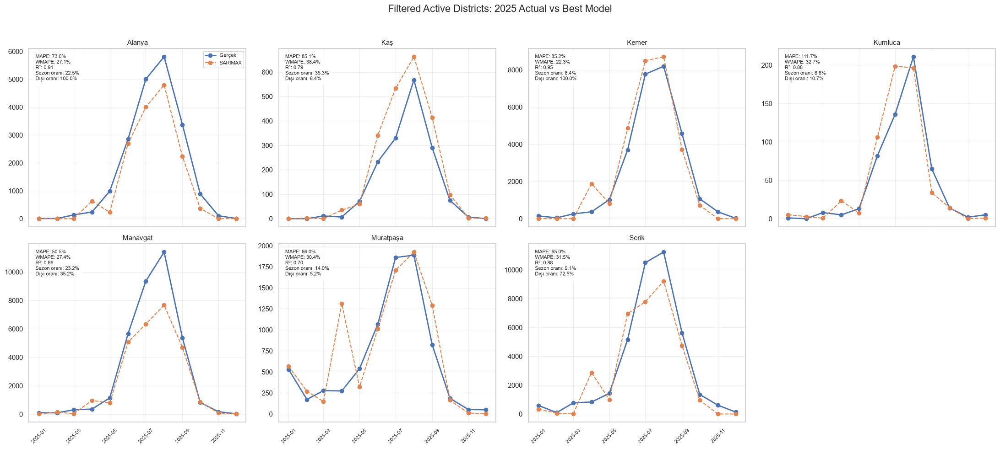

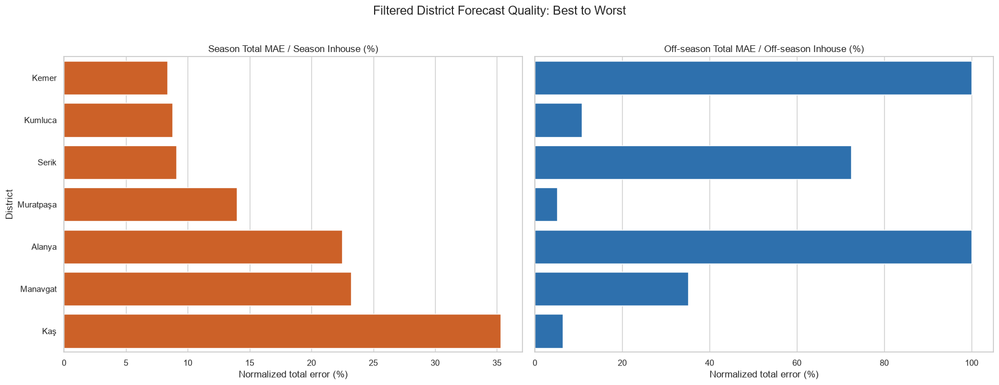

In [4]:
# Filtered district visuals: exclude low-volume districts without changing prior outputs.
EXCLUDED_DISTRICTS_FROM_VISUALS = {"Aksu", "Kepez", "Konyaaltı", "Döşemealtı", "Finike"}
filtered_district_scores = selected_district_scores.loc[
    ~selected_district_scores["district"].isin(EXCLUDED_DISTRICTS_FROM_VISUALS)
].copy()
filtered_district_predictions = district_model_predictions_df.loc[
    ~district_model_predictions_df["district"].isin(EXCLUDED_DISTRICTS_FROM_VISUALS)
].copy()
filtered_districts = filtered_district_scores["district"].tolist()

filtered_district_scores.to_csv(OUTPUT_DIR / "filtered_active_district_2025_selected_scores.csv", index=False)
filtered_district_predictions.to_csv(OUTPUT_DIR / "filtered_active_district_2025_predictions.csv", index=False)
filtered_season_ranking = filtered_district_scores.sort_values(["season_mae_ratio_pct", "WMAPE"], na_position="last")
filtered_offseason_ranking = filtered_district_scores.sort_values(["offseason_mae_ratio_pct", "WMAPE"], na_position="last")
filtered_season_ranking[score_columns].to_csv(OUTPUT_DIR / "filtered_active_district_2025_season_ranking.csv", index=False)
filtered_offseason_ranking[score_columns].to_csv(OUTPUT_DIR / "filtered_active_district_2025_offseason_ranking.csv", index=False)

print("Excluded districts:", sorted(EXCLUDED_DISTRICTS_FROM_VISUALS))
print("Districts shown:", filtered_districts)
print("\nSeason ranking - best to worst:")
print(filtered_season_ranking[score_columns].to_string(index=False))
print("\nOff-season ranking - best to worst:")
print(filtered_offseason_ranking[score_columns].to_string(index=False))

fig, axes = plt.subplots(2, 4, figsize=(22, 10), sharex=True)
for axis, district_name in zip(axes.flat, filtered_districts):
    plot_data = filtered_district_predictions.loc[filtered_district_predictions["district"].eq(district_name)].sort_values("month")
    score = filtered_district_scores.loc[filtered_district_scores["district"].eq(district_name)].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2, label="Gerçek")
    axis.plot(plot_data["month"], plot_data["prediction"], marker="o", linestyle="--", label=score["model"])
    axis.set_title(district_name, fontsize=11)
    axis.text(0.03, 0.97, f"MAPE: {score['MAPE']:.1f}%\nWMAPE: {score['WMAPE']:.1f}%\nR²: {score['R2']:.2f}\nSezon oranı: {score['season_mae_ratio_pct']:.1f}%\nDışı oranı: {score['offseason_mae_ratio_pct']:.1f}%", transform=axis.transAxes, va="top", fontsize=8, bbox={"facecolor": "white", "alpha": 0.84})
    axis.tick_params(axis="x", rotation=45, labelsize=8)
    axis.grid(alpha=0.3)
for axis in axes.flat[len(filtered_districts):]:
    axis.set_visible(False)
axes[0, 0].legend(fontsize=8)
fig.suptitle("Filtered Active Districts: 2025 Actual vs Best Model", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
fig.savefig(OUTPUT_DIR / "filtered_active_district_2025_actual_vs_model_metrics.png", dpi=180)
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=True)
sns.barplot(data=filtered_season_ranking, y="district", x="season_mae_ratio_pct", color="#e8590c", ax=axes[0])
sns.barplot(data=filtered_offseason_ranking, y="district", x="offseason_mae_ratio_pct", color="#1971c2", ax=axes[1])
axes[0].set_title("Season Total MAE / Season Inhouse (%)")
axes[1].set_title("Off-season Total MAE / Off-season Inhouse (%)")
for axis in axes:
    axis.set_xlabel("Normalized total error (%)")
    axis.set_ylabel("District")
fig.suptitle("Filtered District Forecast Quality: Best to Worst", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
fig.savefig(OUTPUT_DIR / "filtered_active_district_2025_error_ratio_rankings.png", dpi=180)
plt.show()

2025 AYLIK TAHMIN SONUCLARI - SECILEN ILCELER
Egitim: 2023-2024 | Test: 2025 | Secim: En dusuk WMAPE

SEZON (Mart-Ekim) MAE / Inhouse ORANI - EN IYIDEN KOTUYE
 season_rank  offseason_rank  district   model         MAE        RMSE       MAPE     WMAPE       R2  season_total_mae  season_total_inhouse  season_mae_ratio_pct  offseason_total_mae  offseason_total_inhouse  offseason_mae_ratio_pct
         1.0            10.0     Kemer SARIMAX  511.644288  677.591667  85.177742 22.292250 0.945719       2254.102598               26962.0              8.360294           580.000000                    580.0               100.000000
         2.0             3.0   Kumluca Prophet   14.761921   22.651490 111.737965 32.683219 0.876784         46.774041                 534.0              8.759184             0.858012                      8.0                10.725152
         3.0             6.0     Serik SARIMAX 1005.528062 1321.714497  65.003947 31.466182 0.882413       3360.818780               36916.

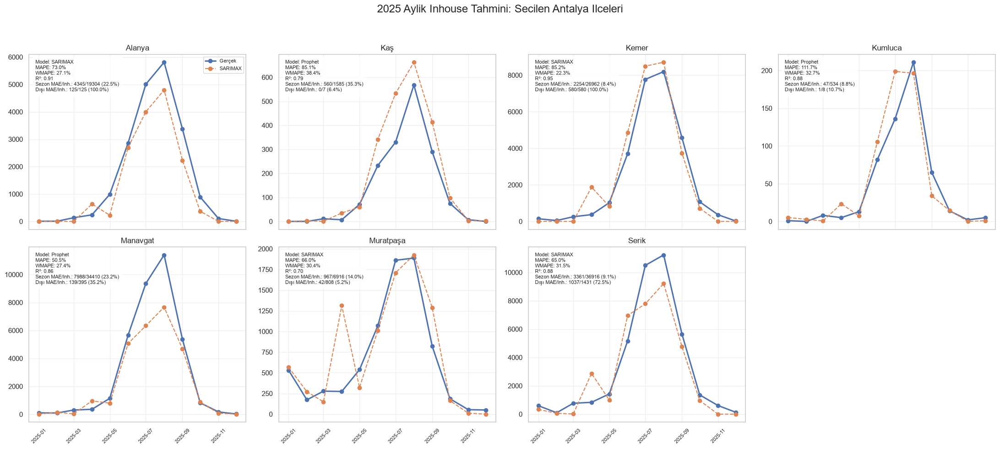

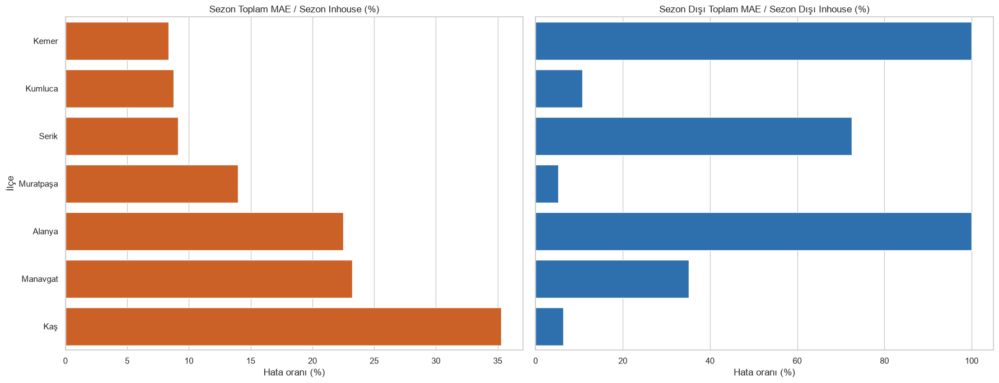

In [5]:
# AYLIK ILCE TAHMINI - 2025: Alanya, Kaş, Kemer, Kumluca, Manavgat, Muratpaşa, Serik
DISPLAYED_DISTRICTS = ["Alanya", "Kaş", "Kemer", "Kumluca", "Manavgat", "Muratpaşa", "Serik"]
display_scores = selected_district_scores.loc[
    selected_district_scores["district"].isin(DISPLAYED_DISTRICTS)
].copy()
display_predictions = district_model_predictions_df.loc[
    district_model_predictions_df["district"].isin(DISPLAYED_DISTRICTS)
].copy()
display_season_ranking = display_scores.sort_values(["season_mae_ratio_pct", "WMAPE"])
display_offseason_ranking = display_scores.sort_values(["offseason_mae_ratio_pct", "WMAPE"])

print("2025 AYLIK TAHMIN SONUCLARI - SECILEN ILCELER")
print("Egitim: 2023-2024 | Test: 2025 | Secim: En dusuk WMAPE")
print("\nSEZON (Mart-Ekim) MAE / Inhouse ORANI - EN IYIDEN KOTUYE")
print(display_season_ranking[score_columns].to_string(index=False))
print("\nSEZON DISI (Kasim-Subat) MAE / Inhouse ORANI - EN IYIDEN KOTUYE")
print(display_offseason_ranking[score_columns].to_string(index=False))

fig, axes = plt.subplots(2, 4, figsize=(22, 10), sharex=True)
for axis, district_name in zip(axes.flat, DISPLAYED_DISTRICTS):
    plot_data = display_predictions.loc[display_predictions["district"].eq(district_name)].sort_values("month")
    score = display_scores.loc[display_scores["district"].eq(district_name)].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2.2, label="Gerçek")
    axis.plot(plot_data["month"], plot_data["prediction"], marker="o", linestyle="--", label=score["model"])
    axis.set_title(district_name, fontsize=12)
    axis.text(0.03, 0.97, f"Model: {score['model']}\nMAPE: {score['MAPE']:.1f}%\nWMAPE: {score['WMAPE']:.1f}%\nR²: {score['R2']:.2f}\nSezon MAE/Inh.: {score['season_total_mae']:.0f}/{score['season_total_inhouse']:.0f} ({score['season_mae_ratio_pct']:.1f}%)\nDışı MAE/Inh.: {score['offseason_total_mae']:.0f}/{score['offseason_total_inhouse']:.0f} ({score['offseason_mae_ratio_pct']:.1f}%)", transform=axis.transAxes, va="top", fontsize=8, bbox={"facecolor": "white", "alpha": 0.86})
    axis.tick_params(axis="x", rotation=45, labelsize=8)
    axis.grid(alpha=0.3)
axes[0, 0].legend(fontsize=8)
for axis in axes.flat[len(DISPLAYED_DISTRICTS):]:
    axis.set_visible(False)
fig.suptitle("2025 Aylik Inhouse Tahmini: Secilen Antalya Ilceleri", fontsize=17)
fig.tight_layout(rect=[0, 0, 1, 0.95])
fig.savefig(OUTPUT_DIR / "selected_7_districts_2025_actual_vs_model_metrics.png", dpi=180)
plt.show()

fig, axes = plt.subplots(1, 2, figsize=(18, 7), sharey=True)
sns.barplot(data=display_season_ranking, y="district", x="season_mae_ratio_pct", color="#e8590c", ax=axes[0])
sns.barplot(data=display_offseason_ranking, y="district", x="offseason_mae_ratio_pct", color="#1971c2", ax=axes[1])
axes[0].set_title("Sezon Toplam MAE / Sezon Inhouse (%)")
axes[1].set_title("Sezon Dışı Toplam MAE / Sezon Dışı Inhouse (%)")
for axis in axes:
    axis.set_xlabel("Hata oranı (%)")
    axis.set_ylabel("İlçe")
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "selected_7_districts_2025_error_ratio_rankings.png", dpi=180)
plt.show()

display_season_ranking[score_columns].to_csv(OUTPUT_DIR / "selected_7_districts_2025_season_ranking.csv", index=False)
display_offseason_ranking[score_columns].to_csv(OUTPUT_DIR / "selected_7_districts_2025_offseason_ranking.csv", index=False)

AYLIK ILCE BACKTESTI: 2023-2025 Mart-Temmuz egitim, 2026 Mart-Temmuz test
Toplam inhouse hata metriği = |tahmin toplamı - gerçek toplam| / gerçek toplam * 100
 district                            model         MAE       MAPE     WMAPE  actual_total_inhouse  predicted_total_inhouse  total_inhouse_absolute_error_pct
      Kaş Ridge month-effects + year trend   91.596970 251.680316 61.639953                 743.0               728.424242                          1.961744
Muratpaşa Ridge month-effects + year trend  491.282576 114.231933 50.973498                4819.0              5020.939394                          4.190483
    Serik Ridge month-effects + year trend 2616.287121 164.811682 60.539780               21608.0             23240.303030                          7.554161
 Manavgat Ridge month-effects + year trend 2778.725758 499.508669 64.105702               21673.0             19572.393939                          9.692272
    Kemer Ridge month-effects + year trend 1839.401515 5

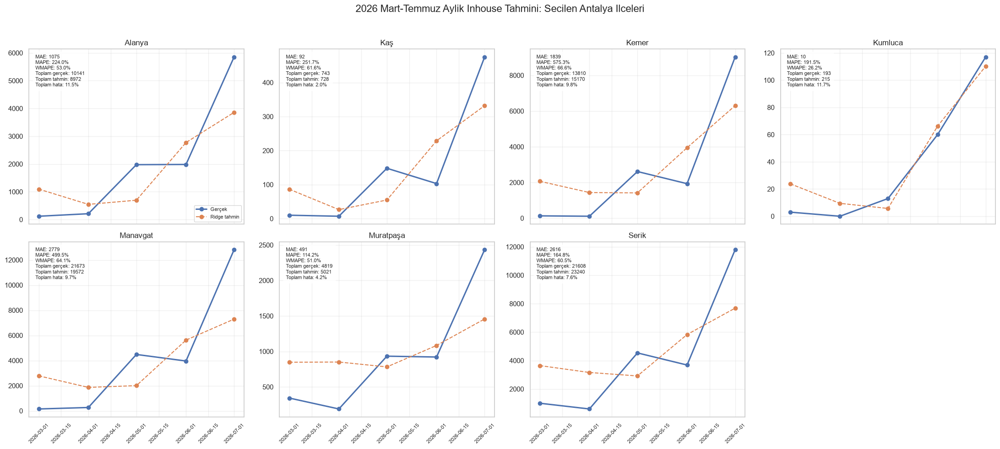

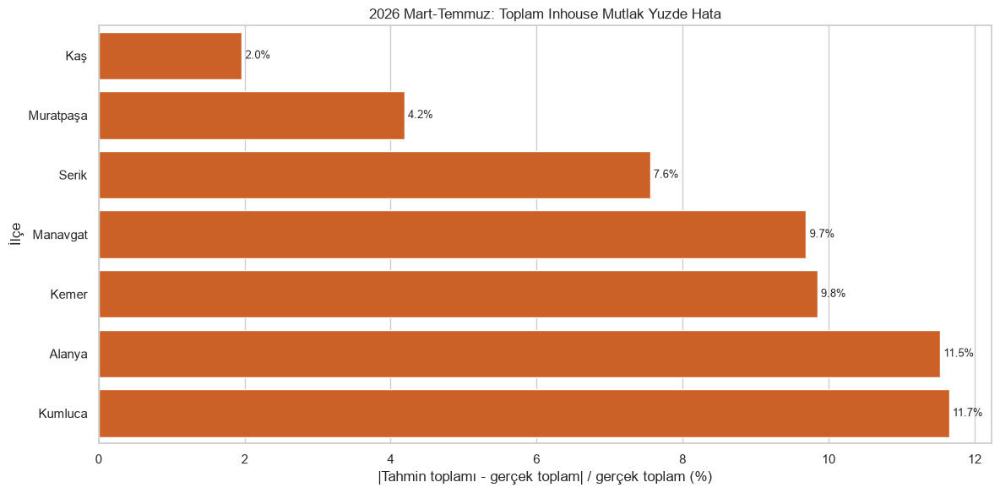

In [6]:
# AYLIK ILCE BACKTESTI: Train 2023-2025 March-July, test 2026 March-July.
# This is separate from the previous seasonal analyses.
from sklearn.linear_model import Ridge

MONTHLY_TEST_DISTRICTS = ["Alanya", "Kaş", "Kemer", "Kumluca", "Manavgat", "Muratpaşa", "Serik"]
MONTHLY_SEASON_MONTHS = [3, 4, 5, 6, 7]
MONTHLY_TRAIN_YEARS = [2023, 2024, 2025]
MONTHLY_TEST_YEAR = 2026

DISTRICT_MAP_MONTHLY = {
    "Acısu": "Serik", "Adrasan": "Kumluca", "Aksu": "Aksu", "Alanya": "Alanya", "Avsallar": "Alanya", "Beldibi": "Kemer", "Belek": "Serik", "Boğazkent": "Serik", "Çamyuva": "Kemer", "Çıralı": "Kumluca", "Çolaklı": "Manavgat", "Çukurbağ Yarımadası": "Kaş", "Dimçayı": "Alanya", "Döşemealtı": "Döşemealtı", "Evrenseki": "Manavgat", "Falez": "Muratpaşa", "Finike": "Finike", "Gazipaşa": "Gazipaşa", "Göynük": "Kemer", "İleribaşı Mevkii": "Serik", "İncekum": "Alanya", "İskele Mevki": "Serik", "Kaleiçi": "Muratpaşa", "Kalkan": "Kaş", "Kargıcak": "Alanya", "Karya Mevkii": "Serik", "Kaş": "Kaş", "Kemer": "Kemer", "Kepez": "Kepez", "Kestel": "Alanya", "Kiriş": "Kemer", "Kızılagaç": "Manavgat", "Kızılot": "Manavgat", "Konaklı": "Alanya", "Konyaaltı": "Konyaaltı", "Küçük Çakıl Mevkii": "Kaş", "Kumköy": "Manavgat", "Kumluca": "Kumluca", "Lara": "Muratpaşa", "Mahmutlar": "Alanya", "Manavgat": "Manavgat", "Merkez": "Muratpaşa", "Muratpaşa": "Muratpaşa", "Oba": "Alanya", "Obagöl": "Alanya", "Okurcalar": "Alanya", "Olimpos": "Kumluca", "Serik": "Serik", "Side": "Manavgat", "Sorgun": "Manavgat", "Taşlıburun": "Serik", "Tekirova": "Kemer", "Titreyengöl": "Manavgat", "Türkler": "Alanya", "Üç Kum Tepesi": "Serik",
}

# Build district-month occupied nights for 2023-2026, including all hotels.
monthly_reservations = antalya[["hotel_region_name", "checkin", "checkout"]].copy()
monthly_reservations["district"] = monthly_reservations["hotel_region_name"].astype("string").str.strip().map(DISTRICT_MAP_MONTHLY).fillna("Eşleşmeyen")
monthly_reservations["start"] = monthly_reservations["checkin"].clip(lower=pd.Timestamp("2023-01-01"))
monthly_reservations["end"] = monthly_reservations["checkout"].clip(upper=pd.Timestamp("2026-07-31") + pd.Timedelta(days=1))
monthly_reservations = monthly_reservations.loc[monthly_reservations["end"].gt(monthly_reservations["start"])].copy()
monthly_reservations["nights"] = (monthly_reservations["end"] - monthly_reservations["start"]).dt.days
monthly_district_nights = pd.DataFrame({
    "date": np.concatenate([pd.date_range(start, end - pd.Timedelta(days=1), freq="D") for start, end in zip(monthly_reservations["start"], monthly_reservations["end"])]),
    "district": np.repeat(monthly_reservations["district"].to_numpy(), monthly_reservations["nights"].to_numpy()),
})
monthly_district_nights["month"] = monthly_district_nights["date"].dt.to_period("M").dt.to_timestamp()
monthly_district_data = monthly_district_nights.groupby(["district", "month"], as_index=False).size().rename(columns={"size": "occupied_nights"})

train_months = pd.to_datetime([f"{year}-{month:02d}-01" for year in MONTHLY_TRAIN_YEARS for month in MONTHLY_SEASON_MONTHS])
test_months = pd.to_datetime([f"{MONTHLY_TEST_YEAR}-{month:02d}-01" for month in MONTHLY_SEASON_MONTHS])
def monthly_features(months):
    months = pd.DatetimeIndex(months)
    features = pd.DataFrame({"year_trend": months.year - 2023}, index=months)
    for month_number in MONTHLY_SEASON_MONTHS[1:]:
        features[f"month_{month_number}"] = (months.month == month_number).astype(int)
    return features

monthly_district_scores = []
monthly_district_predictions = []
for district_name in MONTHLY_TEST_DISTRICTS:
    values = (monthly_district_data.loc[monthly_district_data["district"].eq(district_name)]
              .set_index("month")["occupied_nights"]
              .reindex(train_months.union(test_months), fill_value=0).astype(float))
    actual = values.loc[test_months].to_numpy()
    model = Ridge(alpha=1.0, fit_intercept=True)
    model.fit(monthly_features(train_months), values.loc[train_months].to_numpy())
    prediction = np.clip(model.predict(monthly_features(test_months)), 0, None)
    error = actual - prediction
    nonzero = actual != 0
    total_actual = actual.sum()
    total_prediction = prediction.sum()
    score = {
        "district": district_name,
        "model": "Ridge month-effects + year trend",
        "MAE": mean_absolute_error(actual, prediction),
        "MAPE": np.mean(np.abs(error[nonzero] / actual[nonzero])) * 100 if nonzero.any() else np.nan,
        "WMAPE": np.abs(error).sum() / total_actual * 100 if total_actual else np.nan,
        "actual_total_inhouse": total_actual,
        "predicted_total_inhouse": total_prediction,
        "total_inhouse_absolute_error_pct": abs(total_prediction - total_actual) / total_actual * 100 if total_actual else np.nan,
    }
    monthly_district_scores.append(score)
    for month, actual_value, predicted_value in zip(test_months, actual, prediction):
        monthly_district_predictions.append({"district": district_name, "month": month, "actual": actual_value, "prediction": predicted_value})

monthly_district_scores_df = pd.DataFrame(monthly_district_scores).sort_values("total_inhouse_absolute_error_pct")
monthly_district_predictions_df = pd.DataFrame(monthly_district_predictions)
monthly_district_scores_df.to_csv(OUTPUT_DIR / "district_monthly_mar_jul_2026_model_scores.csv", index=False)
monthly_district_predictions_df.to_csv(OUTPUT_DIR / "district_monthly_mar_jul_2026_predictions.csv", index=False)

print("AYLIK ILCE BACKTESTI: 2023-2025 Mart-Temmuz egitim, 2026 Mart-Temmuz test")
print("Toplam inhouse hata metriği = |tahmin toplamı - gerçek toplam| / gerçek toplam * 100")
print(monthly_district_scores_df.to_string(index=False))

fig, axes = plt.subplots(2, 4, figsize=(22, 10), sharex=True)
for axis, district_name in zip(axes.flat, MONTHLY_TEST_DISTRICTS):
    plot_data = monthly_district_predictions_df.loc[monthly_district_predictions_df["district"].eq(district_name)].sort_values("month")
    score = monthly_district_scores_df.loc[monthly_district_scores_df["district"].eq(district_name)].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2.2, label="Gerçek")
    axis.plot(plot_data["month"], plot_data["prediction"], marker="o", linestyle="--", label="Ridge tahmin")
    axis.set_title(district_name, fontsize=12)
    axis.text(0.03, 0.97, f"MAE: {score['MAE']:.0f}\nMAPE: {score['MAPE']:.1f}%\nWMAPE: {score['WMAPE']:.1f}%\nToplam gerçek: {score['actual_total_inhouse']:.0f}\nToplam tahmin: {score['predicted_total_inhouse']:.0f}\nToplam hata: {score['total_inhouse_absolute_error_pct']:.1f}%", transform=axis.transAxes, va="top", fontsize=8, bbox={"facecolor": "white", "alpha": 0.86})
    axis.tick_params(axis="x", rotation=45, labelsize=8)
    axis.grid(alpha=0.3)
for axis in axes.flat[len(MONTHLY_TEST_DISTRICTS):]:
    axis.set_visible(False)
axes[0, 0].legend(fontsize=8)
fig.suptitle("2026 Mart-Temmuz Aylik Inhouse Tahmini: Secilen Antalya Ilceleri", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
fig.savefig(OUTPUT_DIR / "district_monthly_mar_jul_2026_actual_vs_prediction.png", dpi=180)
plt.show()

fig, ax = plt.subplots(figsize=(12, 6))
sns.barplot(data=monthly_district_scores_df, y="district", x="total_inhouse_absolute_error_pct", color="#e8590c", ax=ax)
ax.set_title("2026 Mart-Temmuz: Toplam Inhouse Mutlak Yuzde Hata")
ax.set_xlabel("|Tahmin toplamı - gerçek toplam| / gerçek toplam (%)")
ax.set_ylabel("İlçe")
for container in ax.containers:
    ax.bar_label(container, fmt="%.1f%%", fontsize=9, padding=3)
fig.tight_layout()
fig.savefig(OUTPUT_DIR / "district_monthly_mar_jul_2026_total_error_ranking.png", dpi=180)
plt.show()

In [9]:
# MAPE, WMAPE and R2 summary for the 2026 March-July monthly district backtest.
monthly_r2 = (monthly_district_predictions_df.groupby("district")
              .apply(lambda group: r2_score(group["actual"], group["prediction"]), include_groups=False)
              .rename("R2").reset_index())
mape_wmape_r2_summary = (monthly_district_scores_df[["district", "MAPE", "WMAPE"]]
                          .merge(monthly_r2, on="district")
                          .sort_values("WMAPE").reset_index(drop=True))
mape_wmape_r2_summary.index = mape_wmape_r2_summary.index + 1
mape_wmape_r2_summary.to_csv(OUTPUT_DIR / "district_monthly_mar_jul_2026_mape_wmape_r2_summary.csv", index_label="rank")
print("MAPE, WMAPE ve R2 - en dusuk WMAPE'den en yuksege")
print(mape_wmape_r2_summary.to_string())

MAPE, WMAPE ve R2 - en dusuk WMAPE'den en yuksege
    district        MAPE      WMAPE        R2
1    Kumluca  191.542660  26.203093  0.934022
2  Muratpaşa  114.231933  50.973498  0.461625
3     Alanya  224.049701  53.021040  0.661532
4      Serik  164.811682  60.539780  0.535904
5        Kaş  251.680316  61.639953  0.653831
6   Manavgat  499.508669  64.105702  0.539391
7      Kemer  575.263591  66.596724  0.658336


In [10]:
# FINAL_REPORT: collect only the latest decision-ready Antalya, hotel and district outputs.
from shutil import copy2

FINAL_DIR = OUTPUT_DIR / "FINAL_REPORT"
FINAL_DIR.mkdir(parents=True, exist_ok=True)

antalya_summary = pd.read_csv(OUTPUT_DIR / "model_selection_summary.csv")
antalya_summary.to_csv(FINAL_DIR / "01_antalya_model_summary.csv", index=False)

hotel_scores = pd.read_csv(OUTPUT_DIR / "top20_2026_hotel_model_scores.csv")
selected_hotels = hotel_scores.loc[
    hotel_scores["selected"].astype(str).str.lower().eq("true")
].copy()
hotel_columns = [
    "rank_2026", "hotel_id", "hotel_name", "model", "MAE", "RMSE", "MAPE", "WMAPE", "SMAPE", "R2"
]
selected_hotels[hotel_columns].sort_values("rank_2026").to_csv(
    FINAL_DIR / "02_hotel_selected_models_and_scores.csv", index=False
)

district_2025_scores = pd.read_csv(OUTPUT_DIR / "filtered_active_district_2025_selected_scores.csv")
district_2025_columns = [
    "district", "model", "MAE", "RMSE", "MAPE", "WMAPE", "R2",
    "season_mae_ratio_pct", "offseason_mae_ratio_pct"
]
district_2025_scores[district_2025_columns].sort_values("district").to_csv(
    FINAL_DIR / "03_district_2025_selected_models_and_scores.csv", index=False
)

district_2026_summary = pd.read_csv(
    OUTPUT_DIR / "district_monthly_mar_jul_2026_mape_wmape_r2_summary.csv"
)
district_2026_summary.to_csv(
    FINAL_DIR / "04_district_2026_mar_jul_ridge_backtest_scores.csv", index=False
)

selected_visuals = [
    "test_predictions_comparison.png",
    "top20_2026_actual_vs_best_model_with_metrics.png",
    "filtered_active_district_2025_actual_vs_model_metrics.png",
    "district_monthly_mar_jul_2026_actual_vs_prediction.png",
    "district_monthly_mar_jul_2026_total_error_ranking.png",
]
for visual_name in selected_visuals:
    source = OUTPUT_DIR / visual_name
    if source.exists():
        copy2(source, FINAL_DIR / visual_name)

antalya_row = antalya_summary.iloc[0]
hotel_model_counts = selected_hotels["model"].value_counts().to_dict()
district_2025_model_counts = district_2025_scores["model"].value_counts().to_dict()
report_lines = [
    "# Antalya Forecasting - Final Report",
    "",
    "Bu klasor sadece son karar icin gerekli ozetleri ve secili gorselleri icerir.",
    "",
    "## 1. Antalya Geneli",
    f"- 2026 test modeli: {antalya_row['best_test_model']}",
    f"- Ileri tahmin modeli: {antalya_row['forecast_model']}",
    f"- Test MAE: {antalya_row['MAE']:.2f}",
    f"- Test WMAPE: {antalya_row['WMAPE']:.2f}%",
    f"- Test R2: {antalya_row['R2']:.4f}",
    "- Takvim duzeltmeleri: Mayis Kurban, Haziran talep transferi ve Mart/Nisan Ramazan etkisi.",
    "",
    "## 2. Otel Tahminleri",
    "- Kapsam: 2026 Ocak-Temmuz inhouse degerine gore secilen 20 otel.",
    "- Aday modeller: SARIMAX ve Prophet; otel bazinda en dusuk WMAPE, MAE esitlik bozucu ile secildi.",
    f"- Secilen model dagilimi: {hotel_model_counts}",
    "- Ayrintili secim ve skorlar: 02_hotel_selected_models_and_scores.csv",
    "",
    "## 3. Ilce Tahminleri - 2025 Backtest",
    "- Egitim: 2023-2024; test: 2025 tum aylar.",
    "- Aday modeller: SARIMAX ve Prophet; ilce bazinda en dusuk WMAPE, MAE esitlik bozucu ile secildi.",
    f"- Secilen model dagilimi: {district_2025_model_counts}",
    "- Ayrintili secim ve skorlar: 03_district_2025_selected_models_and_scores.csv",
    "",
    "## 4. Ilce Tahminleri - 2026 Mart-Temmuz Backtest",
    "- Egitim: 2023-2025 Mart-Temmuz; test: 2026 Mart-Temmuz.",
    "- Model: Ridge, ay etkileri ve yil trendi.",
    "- Skorlar: 04_district_2026_mar_jul_ridge_backtest_scores.csv",
    "",
    "## Secili Gorseller",
    *[f"- {visual_name}" for visual_name in selected_visuals if (FINAL_DIR / visual_name).exists()],
]
(FINAL_DIR / "README.md").write_text("\n".join(report_lines) + "\n", encoding="utf-8")

print(f"Final report folder: {FINAL_DIR}")
print("Summary CSV files:")
for summary_file in sorted(FINAL_DIR.glob("0*.csv")):
    print(f"- {summary_file.name}")
print(f"Selected visuals copied: {sum((FINAL_DIR / name).exists() for name in selected_visuals)}")

Final report folder: c:\Users\efe.turhan\Desktop\sales_forecasting\outputs\OUTPUT_SARIMA\FINAL_REPORT
Summary CSV files:
- 01_antalya_model_summary.csv
- 02_hotel_selected_models_and_scores.csv
- 03_district_2025_selected_models_and_scores.csv
- 04_district_2026_mar_jul_ridge_backtest_scores.csv
Selected visuals copied: 5


Muğla 2022-2026 sezon / sezon disi inhouse satis ozeti
 year  Sezon (Mar-Eki)  Sezon Disi (Kas-Sub/Oca-Sub)
 2022            32897                           246
 2023            28135                           227
 2024            49457                           327
 2025            44358                           280
 2026            42724                            91


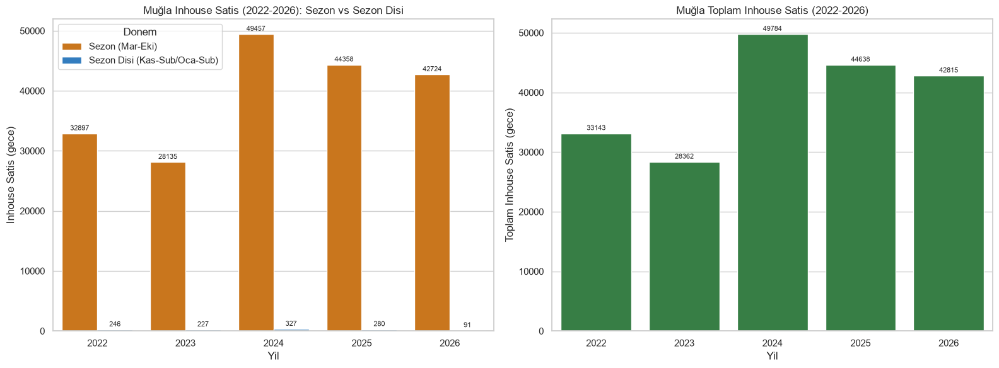

In [11]:
# MUGLA: 2022-2026 sezon (Mart-Ekim) vs sezon disi inhouse satis (occupied nights) analizi
# Not: Mevcut hucreleri degistirmez; ayri bir kesit olarak calisir.

MUGLA_SEASON_MONTHS = {3, 4, 5, 6, 7, 8, 9, 10}
MUGLA_YEARS = [2022, 2023, 2024, 2025, 2026]

mugla = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
mugla["checkin"] = pd.to_datetime(mugla["voucher_checkin_date"], errors="coerce").dt.normalize()
mugla["checkout"] = pd.to_datetime(mugla["voucher_checout_date"], errors="coerce").dt.normalize()
mugla = mugla.loc[mugla["checkin"].notna() & mugla["checkout"].notna() & mugla["checkout"].gt(mugla["checkin"])]

mugla["start"] = mugla["checkin"].clip(lower=pd.Timestamp("2022-01-01"))
mugla["end"] = mugla["checkout"].clip(upper=pd.Timestamp("2027-01-01"))
mugla = mugla.loc[mugla["end"].gt(mugla["start"])].copy()
mugla["nights"] = (mugla["end"] - mugla["start"]).dt.days

mugla_night_dates = np.concatenate([
    pd.date_range(start, end - pd.Timedelta(days=1), freq="D")
    for start, end in zip(mugla["start"], mugla["end"])
])
mugla_daily = pd.DataFrame({"date": mugla_night_dates})
mugla_daily["year"] = mugla_daily["date"].dt.year
mugla_daily["month"] = mugla_daily["date"].dt.month
mugla_daily = mugla_daily.loc[mugla_daily["year"].isin(MUGLA_YEARS)].copy()
mugla_daily["season_type"] = np.where(
    mugla_daily["month"].isin(MUGLA_SEASON_MONTHS),
    "Sezon (Mar-Eki)",
    "Sezon Disi (Kas-Sub/Oca-S" + "ub)"
)

mugla_summary = (
    mugla_daily.groupby(["year", "season_type"], as_index=False)
    .size()
    .rename(columns={"size": "inhouse_satis"})
)

mugla_pivot = (
    mugla_summary.pivot(index="year", columns="season_type", values="inhouse_satis")
    .reindex(MUGLA_YEARS)
    .fillna(0)
)

for col in ["Sezon (Mar-Eki)", "Sezon Disi (Kas-Sub/Oca-Sub)"]:
    if col not in mugla_pivot.columns:
        mugla_pivot[col] = 0

mugla_pivot = mugla_pivot[["Sezon (Mar-Eki)", "Sezon Disi (Kas-Sub/Oca-Sub)"]].reset_index()

print("Muğla 2022-2026 sezon / sezon disi inhouse satis ozeti")
print(mugla_pivot.to_string(index=False))

plot_df = mugla_pivot.melt(
    id_vars="year",
    value_vars=["Sezon (Mar-Eki)", "Sezon Disi (Kas-Sub/Oca-Sub)"],
    var_name="Donem",
    value_name="Inhouse Satis"
)

fig, axes = plt.subplots(1, 2, figsize=(16, 6))

# 1) Gruplanmis bar: her yil icin sezon ve sezon disi
sns.barplot(data=plot_df, x="year", y="Inhouse Satis", hue="Donem", palette=["#e67700", "#1c7ed6"], ax=axes[0])
axes[0].set_title("Muğla Inhouse Satis (2022-2026): Sezon vs Sezon Disi")
axes[0].set_xlabel("Yil")
axes[0].set_ylabel("Inhouse Satis (gece)")
axes[0].legend(title="Donem")
for container in axes[0].containers:
    axes[0].bar_label(container, fmt="%.0f", fontsize=8, padding=2)

# 2) Toplam yil bazli bar: sezon + sezon disi
total_by_year = mugla_pivot.assign(Toplam=lambda df: df["Sezon (Mar-Eki)"] + df["Sezon Disi (Kas-Sub/Oca-Sub)"])
sns.barplot(data=total_by_year, x="year", y="Toplam", color="#2b8a3e", ax=axes[1])
axes[1].set_title("Muğla Toplam Inhouse Satis (2022-2026)")
axes[1].set_xlabel("Yil")
axes[1].set_ylabel("Toplam Inhouse Satis (gece)")
for container in axes[1].containers:
    axes[1].bar_label(container, fmt="%.0f", fontsize=8, padding=2)

fig.tight_layout()
plt.show()

Muğla 2022-2026 aylik inhouse satis (gece) ozeti
      Oca  Sub  Mar   Nis   May   Haz    Tem    Agu   Eyl   Eki  Kas  Ara
year                                                                     
2022   41   67   84   333  1852  4627   9218   9567  6057  1159  104   34
2023   29   54   68   610   740  4499   6436   8937  5781  1064  103   41
2024   28   50  100  1677  1655  9538  11490  14258  8899  1840  200   49
2025   42   37  320   374  1887  7731  11829  13012  8043  1162  140   61
2026   47   44  295   286  4428  6796  16432  10701  3462   324    0    0


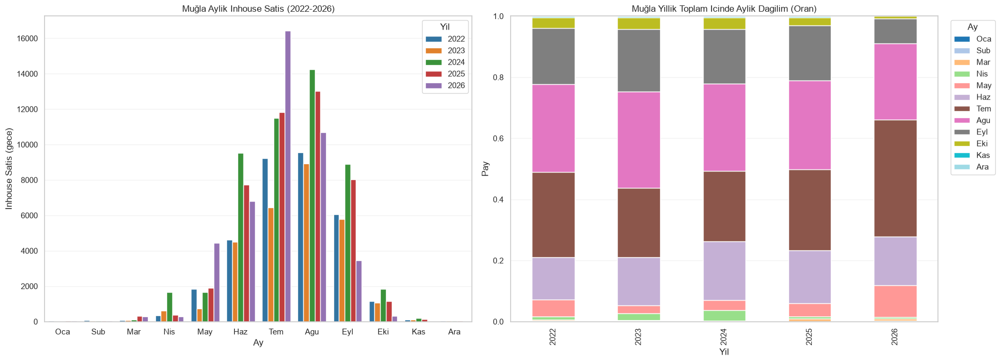

In [12]:
# MUGLA: 2022-2026 aylik inhouse satis (gece) bar gorselleri
# Bu hucre, onceki Mugla sezon analizine ek olarak aylik kirilim verir.

month_order = list(range(1, 13))
month_labels_tr = {
    1: "Oca", 2: "Sub", 3: "Mar", 4: "Nis", 5: "May", 6: "Haz",
    7: "Tem", 8: "Agu", 9: "Eyl", 10: "Eki", 11: "Kas", 12: "Ara"
}

# mugla_daily bir onceki hucrede olusuyorsa onu kullan, yoksa yeniden hesapla.
if "mugla_daily" not in globals():
    mugla_local = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
    mugla_local["checkin"] = pd.to_datetime(mugla_local["voucher_checkin_date"], errors="coerce").dt.normalize()
    mugla_local["checkout"] = pd.to_datetime(mugla_local["voucher_checout_date"], errors="coerce").dt.normalize()
    mugla_local = mugla_local.loc[
        mugla_local["checkin"].notna() & mugla_local["checkout"].notna() & mugla_local["checkout"].gt(mugla_local["checkin"])
    ].copy()
    mugla_local["start"] = mugla_local["checkin"].clip(lower=pd.Timestamp("2022-01-01"))
    mugla_local["end"] = mugla_local["checkout"].clip(upper=pd.Timestamp("2027-01-01"))
    mugla_local = mugla_local.loc[mugla_local["end"].gt(mugla_local["start"])].copy()

    mugla_dates_local = np.concatenate([
        pd.date_range(start, end - pd.Timedelta(days=1), freq="D")
        for start, end in zip(mugla_local["start"], mugla_local["end"])
    ])
    mugla_daily_local = pd.DataFrame({"date": mugla_dates_local})
    mugla_daily_local["year"] = mugla_daily_local["date"].dt.year
    mugla_daily_local["month"] = mugla_daily_local["date"].dt.month
    mugla_daily_local = mugla_daily_local.loc[mugla_daily_local["year"].isin([2022, 2023, 2024, 2025, 2026])].copy()
else:
    mugla_daily_local = mugla_daily.copy()

mugla_monthly = (
    mugla_daily_local.groupby(["year", "month"], as_index=False)
    .size()
    .rename(columns={"size": "inhouse_satis"})
)

mugla_monthly_pivot = (
    mugla_monthly.pivot(index="year", columns="month", values="inhouse_satis")
    .reindex([2022, 2023, 2024, 2025, 2026])
    .reindex(columns=month_order)
    .fillna(0)
)

mugla_monthly_table = mugla_monthly_pivot.copy()
mugla_monthly_table.columns = [month_labels_tr[m] for m in mugla_monthly_table.columns]
print("Muğla 2022-2026 aylik inhouse satis (gece) ozeti")
print(mugla_monthly_table.astype(int).to_string())

plot_monthly = mugla_monthly.copy()
plot_monthly["month_label"] = plot_monthly["month"].map(month_labels_tr)
plot_monthly["month"] = pd.Categorical(plot_monthly["month"], categories=month_order, ordered=True)
plot_monthly = plot_monthly.sort_values(["month", "year"])
plot_monthly["month_label"] = pd.Categorical(
    plot_monthly["month_label"],
    categories=[month_labels_tr[m] for m in month_order],
    ordered=True,
)

fig, axes = plt.subplots(1, 2, figsize=(19, 7))

# 1) Ay bazinda yillara gore gruplu bar
sns.barplot(
    data=plot_monthly,
    x="month_label",
    y="inhouse_satis",
    hue="year",
    palette="tab10",
    ax=axes[0],
)
axes[0].set_title("Muğla Aylik Inhouse Satis (2022-2026)")
axes[0].set_xlabel("Ay")
axes[0].set_ylabel("Inhouse Satis (gece)")
axes[0].legend(title="Yil", ncol=1)
axes[0].grid(alpha=0.25, axis="y")

# 2) Her yilin ay icindeki payini gormek icin normalize yigin bar
normalized = mugla_monthly_pivot.div(mugla_monthly_pivot.sum(axis=1).replace(0, np.nan), axis=0).fillna(0)
normalized.columns = [month_labels_tr[m] for m in normalized.columns]
normalized.plot(kind="bar", stacked=True, ax=axes[1], colormap="tab20")
axes[1].set_title("Muğla Yillik Toplam Icinde Aylik Dagilim (Oran)")
axes[1].set_xlabel("Yil")
axes[1].set_ylabel("Pay")
axes[1].legend(title="Ay", bbox_to_anchor=(1.02, 1), loc="upper left")
axes[1].grid(alpha=0.25, axis="y")

fig.tight_layout()
plt.show()

Muğla Jan-Jul toplam inhouse satis (2022-2026)
 year  inhouse_satis
 2022          16222
 2023          12436
 2024          24538
 2025          22220
 2026          28328


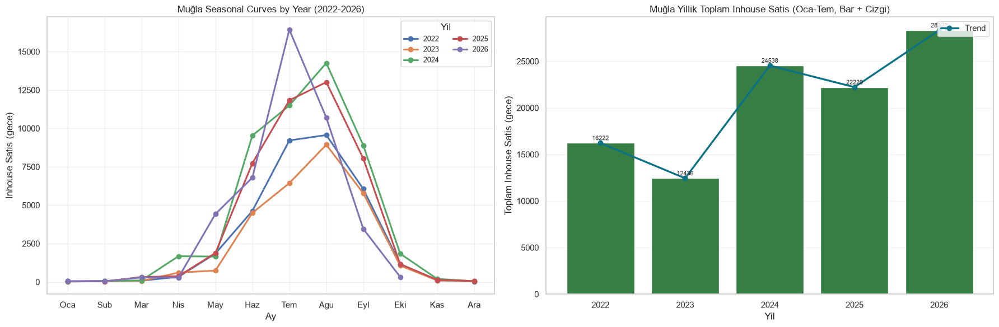

In [14]:
# MUGLA: Antalya stiline benzer cizgi + bar gorselleri (2022-2026)

# Aylik veri yoksa olustur, varsa mevcutu kullan.
if "mugla_monthly" not in globals():
    mugla_local = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
    mugla_local["checkin"] = pd.to_datetime(mugla_local["voucher_checkin_date"], errors="coerce").dt.normalize()
    mugla_local["checkout"] = pd.to_datetime(mugla_local["voucher_checout_date"], errors="coerce").dt.normalize()
    mugla_local = mugla_local.loc[
        mugla_local["checkin"].notna() & mugla_local["checkout"].notna() & mugla_local["checkout"].gt(mugla_local["checkin"])
    ].copy()
    mugla_local["start"] = mugla_local["checkin"].clip(lower=pd.Timestamp("2022-01-01"))
    mugla_local["end"] = mugla_local["checkout"].clip(upper=pd.Timestamp("2027-01-01"))
    mugla_local = mugla_local.loc[mugla_local["end"].gt(mugla_local["start"])].copy()

    mugla_dates_local = np.concatenate([
        pd.date_range(start, end - pd.Timedelta(days=1), freq="D")
        for start, end in zip(mugla_local["start"], mugla_local["end"])
    ])
    mugla_daily_local = pd.DataFrame({"date": mugla_dates_local})
    mugla_daily_local["year"] = mugla_daily_local["date"].dt.year
    mugla_daily_local["month"] = mugla_daily_local["date"].dt.month
    mugla_daily_local = mugla_daily_local.loc[mugla_daily_local["year"].isin([2022, 2023, 2024, 2025, 2026])].copy()

    mugla_monthly = (
        mugla_daily_local.groupby(["year", "month"], as_index=False)
        .size()
        .rename(columns={"size": "inhouse_satis"})
    )

month_order = list(range(1, 13))
month_labels_tr = {
    1: "Oca", 2: "Sub", 3: "Mar", 4: "Nis", 5: "May", 6: "Haz",
    7: "Tem", 8: "Agu", 9: "Eyl", 10: "Eki", 11: "Kas", 12: "Ara"
}

seasonal_mugla = mugla_monthly.copy()
seasonal_mugla = seasonal_mugla.loc[seasonal_mugla["year"].isin([2022, 2023, 2024, 2025, 2026])].copy()
seasonal_mugla["month"] = pd.Categorical(seasonal_mugla["month"], categories=month_order, ordered=True)
seasonal_mugla = seasonal_mugla.sort_values(["year", "month"])
seasonal_mugla["month_num"] = seasonal_mugla["month"].astype(int)

# Sadece yesil barli grafik icin Jan-Jul (1-7) toplamlari.
yearly_totals_jan_jul = (
    seasonal_mugla.loc[seasonal_mugla["month_num"].between(1, 7)]
    .groupby("year", as_index=False)["inhouse_satis"].sum()
    .sort_values("year")
)

print("Muğla Jan-Jul toplam inhouse satis (2022-2026)")
print(yearly_totals_jan_jul.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(18, 6))

# 1) Antalya'daki seasonal curves mantigi: ay ekseninde yil bazli cizgi
for y, group in seasonal_mugla.groupby("year"):
    axes[0].plot(group["month_num"], group["inhouse_satis"], marker="o", linewidth=2.2, label=str(y))
axes[0].set_title("Muğla Seasonal Curves by Year (2022-2026)")
axes[0].set_xlabel("Ay")
axes[0].set_ylabel("Inhouse Satis (gece)")
axes[0].set_xticks(month_order)
axes[0].set_xticklabels([month_labels_tr[m] for m in month_order])
axes[0].legend(title="Yil", ncol=2, fontsize=9)
axes[0].grid(alpha=0.3)

# 2) Yillik toplam: bar + trend cizgisi (yalnizca Oca-Tem)
sns.barplot(data=yearly_totals_jan_jul, x="year", y="inhouse_satis", color="#2b8a3e", ax=axes[1])
axes[1].plot(range(len(yearly_totals_jan_jul)), yearly_totals_jan_jul["inhouse_satis"], color="#0b7285", marker="o", linewidth=2.4, label="Trend")
axes[1].set_title("Muğla Yillik Toplam Inhouse Satis (Oca-Tem, Bar + Cizgi)")
axes[1].set_xlabel("Yil")
axes[1].set_ylabel("Toplam Inhouse Satis (gece)")
for container in axes[1].containers:
    axes[1].bar_label(container, fmt="%.0f", fontsize=8, padding=2)
axes[1].legend(loc="upper right")
axes[1].grid(alpha=0.25, axis="y")

fig.tight_layout()
plt.show()

Mapping method: keyword_fallback
Toplam eslesen bolge sayisi: 31 / 48

Bodrum bolge -> ilce map ornekleri (ilk 30)
hotel_region_name district
         Akyarlar   Bodrum
            Bitez   Bodrum
           Bodrum   Bodrum
      Göltürkbükü   Bodrum
           Gümbet   Bodrum
      Güvercinlik   Bodrum
         Ortakent   Bodrum
            Torba   Bodrum
       Turgutreis   Bodrum
         Türkbükü   Bodrum
        Yalıkavak   Bodrum

2022-2026 Temmuz ilce bazli toplam inhouse (Top 10 ilce):
year       2022  2023   2024   2025  2026
district                                 
Bodrum    10331  8845  18642  14990  9327
Dalaman      11     5      1     14     5
Datca      1023   692    936   1092   533
Fethiye    3342  4523   6313   5376  3830
Koycegiz      9     8      0     31    13
Marmaris   8684  5443  10929  10319  1092
Mentese       3     0      2      0     1
Milas        33    46    177    109    27
Ortaca     1989  2551   3349   3477  1648
Ula         348   524    743    442   32

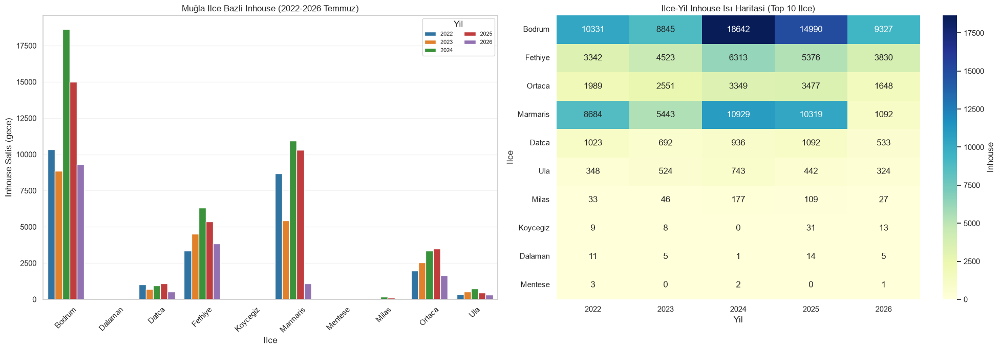

In [15]:
# MUGLA DISTRICT MAPPING + INHOUSE VISUALS (2022-01 to 2026-07)
# 1) Bodrum otel bolgelerini ilce map'i ile esle
# 2) Muğla ilce bazli inhouse (occupied nights) verisini 2022-2026 Temmuz'a kadar gorsellestir

ANALYSIS_START = pd.Timestamp("2022-01-01")
ANALYSIS_END = pd.Timestamp("2026-07-31")

mugla_all = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
mugla_all["hotel_region_name"] = mugla_all["hotel_region_name"].astype("string").str.strip()

# Ilce bilgisini bulmak icin once muhtemel kolonlara bak.
district_candidate_cols = [
    "ilce_adi", "district", "district_name", "hotel_district_name", "destination_district", "ilce"
]
available_district_cols = [c for c in district_candidate_cols if c in mugla_all.columns]

region_to_district_df = None
mapping_method = None

if available_district_cols:
    district_col = available_district_cols[0]
    tmp = mugla_all[["hotel_region_name", district_col]].copy()
    tmp[district_col] = tmp[district_col].astype("string").str.strip()
    tmp = tmp.loc[tmp["hotel_region_name"].notna() & tmp[district_col].notna() & tmp[district_col].ne("")]

    # Her bolge icin en cok gorulen ilceyi sec.
    region_to_district_df = (
        tmp.groupby(["hotel_region_name", district_col], as_index=False)
        .size()
        .sort_values(["hotel_region_name", "size"], ascending=[True, False])
        .drop_duplicates("hotel_region_name")
        .rename(columns={district_col: "district", "size": "support_rows"})
    )
    mapping_method = f"column_majority:{district_col}"
else:
    # Fallback: Muğla ilce anahtar kelimeleriyle bolge adindan esleme.
    keyword_map = {
        "Bodrum": ["Bodrum", "Gumbet", "Gümbet", "Bitez", "Turgutreis", "Yalikavak", "Yalıkavak", "Torba", "Ortakent", "Golturkbuku", "Göltürkbükü", "Turkbuku", "Türkbükü", "Guvercinlik", "Güvercinlik", "Akyarlar"],
        "Marmaris": ["Marmaris", "Icmeler", "İçmeler", "Turunc", "Turunç", "Armutalan", "Siteler", "Hisaronu", "Hisarönü"],
        "Fethiye": ["Fethiye", "Oludeniz", "Ölüdeniz", "Calis", "Çalış", "Hisaronu", "Kayakoy", "Kayaköy", "Ovacik", "Ovacık"],
        "Datca": ["Datca", "Datça"],
        "Dalaman": ["Dalaman"],
        "Ortaca": ["Ortaca", "Sarigerme", "Sarıgerme", "Dalyan"],
        "Koycegiz": ["Koycegiz", "Köyceğiz"],
        "Milas": ["Milas", "Oren", "Ören", "Gulluk", "Güllük"],
        "Mentese": ["Mentese", "Menteşe", "Mugla Merkez", "Muğla Merkez"],
        "Ula": ["Ula", "Akyaka"],
        "Yatagan": ["Yatagan", "Yatağan"],
        "Seydikemer": ["Seydikemer"],
        "Kavaklidere": ["Kavaklidere", "Kavaklıdere"],
    }

    regions = mugla_all["hotel_region_name"].dropna().drop_duplicates().sort_values()
    rows = []
    for region in regions:
        district = "Eslesmeyen"
        for d_name, keys in keyword_map.items():
            if any(k.casefold() in str(region).casefold() for k in keys):
                district = d_name
                break
        rows.append({"hotel_region_name": region, "district": district, "support_rows": np.nan})

    region_to_district_df = pd.DataFrame(rows)
    mapping_method = "keyword_fallback"

region_to_district = dict(zip(region_to_district_df["hotel_region_name"], region_to_district_df["district"]))

print(f"Mapping method: {mapping_method}")
print(f"Toplam eslesen bolge sayisi: {region_to_district_df['district'].ne('Eslesmeyen').sum()} / {len(region_to_district_df)}")

# Bodrum otellerinin bolge -> ilce map'i (kullanici istegi)
bodrum_regions = region_to_district_df.loc[region_to_district_df["district"].eq("Bodrum")].copy()
print("\nBodrum bolge -> ilce map ornekleri (ilk 30)")
print(bodrum_regions[["hotel_region_name", "district"]].head(30).to_string(index=False))

# Analiz seti: Muğla rezervasyonlari, region'dan ilceye map
mugla_res = mugla_all[["hotel_region_name", "voucher_checkin_date", "voucher_checout_date"]].copy()
mugla_res["district"] = mugla_res["hotel_region_name"].map(region_to_district).fillna("Eslesmeyen")
mugla_res["checkin"] = pd.to_datetime(mugla_res["voucher_checkin_date"], errors="coerce").dt.normalize()
mugla_res["checkout"] = pd.to_datetime(mugla_res["voucher_checout_date"], errors="coerce").dt.normalize()
mugla_res = mugla_res.loc[
    mugla_res["checkin"].notna() & mugla_res["checkout"].notna() & mugla_res["checkout"].gt(mugla_res["checkin"])
].copy()

mugla_res["start"] = mugla_res["checkin"].clip(lower=ANALYSIS_START)
mugla_res["end"] = mugla_res["checkout"].clip(upper=ANALYSIS_END + pd.Timedelta(days=1))
mugla_res = mugla_res.loc[mugla_res["end"].gt(mugla_res["start"])].copy()
mugla_res["nights"] = (mugla_res["end"] - mugla_res["start"]).dt.days

# Gun bazina acip ilce bazli inhouse say.
dates = np.concatenate([
    pd.date_range(s, e - pd.Timedelta(days=1), freq="D")
    for s, e in zip(mugla_res["start"], mugla_res["end"])
])
districts = np.repeat(mugla_res["district"].to_numpy(), mugla_res["nights"].to_numpy())

mugla_daily_district = pd.DataFrame({"date": dates, "district": districts})
mugla_daily_district["year"] = mugla_daily_district["date"].dt.year
mugla_daily_district["month"] = mugla_daily_district["date"].dt.month

# Yillik toplam (2022-2026, 2026 Temmuz dahil)
district_yearly = (
    mugla_daily_district.groupby(["district", "year"], as_index=False)
    .size()
    .rename(columns={"size": "inhouse_satis"})
)

# Aylik toplam (ilce x ay) - istenirse detay bakis icin.
district_monthly = (
    mugla_daily_district.groupby(["district", pd.Grouper(key="date", freq="MS")], as_index=False)
    .size()
    .rename(columns={"size": "inhouse_satis", "date": "month"})
)

# Eslesmeyenleri gosterip ana gorunume dahil etmeyelim.
matched_district_yearly = district_yearly.loc[district_yearly["district"].ne("Eslesmeyen")].copy()

# Cok kalabalik olmasin diye toplam hacimde ilk 10 ilceyi ciz.
top_districts = (
    matched_district_yearly.groupby("district", as_index=False)["inhouse_satis"].sum()
    .sort_values("inhouse_satis", ascending=False)
    .head(10)["district"]
    .tolist()
)
plot_yearly = matched_district_yearly.loc[matched_district_yearly["district"].isin(top_districts)].copy()

print("\n2022-2026 Temmuz ilce bazli toplam inhouse (Top 10 ilce):")
print(
    plot_yearly.pivot(index="district", columns="year", values="inhouse_satis")
    .fillna(0).astype(int).to_string()
)

fig, axes = plt.subplots(1, 2, figsize=(20, 7))

# 1) Ilce bazli yillik inhouse (bar)
sns.barplot(
    data=plot_yearly,
    x="district",
    y="inhouse_satis",
    hue="year",
    palette="tab10",
    ax=axes[0],
)
axes[0].set_title("Muğla Ilce Bazli Inhouse (2022-2026 Temmuz)")
axes[0].set_xlabel("Ilce")
axes[0].set_ylabel("Inhouse Satis (gece)")
axes[0].tick_params(axis="x", rotation=45)
axes[0].legend(title="Yil", ncol=2, fontsize=8)
axes[0].grid(alpha=0.25, axis="y")

# 2) Ayni verinin isi haritasi
heat = (
    plot_yearly.pivot_table(index="district", columns="year", values="inhouse_satis", aggfunc="sum")
    .fillna(0)
    .sort_values(2026 if 2026 in plot_yearly["year"].unique() else plot_yearly["year"].max(), ascending=False)
)
sns.heatmap(heat, annot=True, fmt=".0f", cmap="YlGnBu", cbar_kws={"label": "Inhouse"}, ax=axes[1])
axes[1].set_title("Ilce-Yil Inhouse Isı Haritasi (Top 10 Ilce)")
axes[1].set_xlabel("Yil")
axes[1].set_ylabel("Ilce")

fig.tight_layout()
plt.show()

Gosterilen ay sayisi: 55


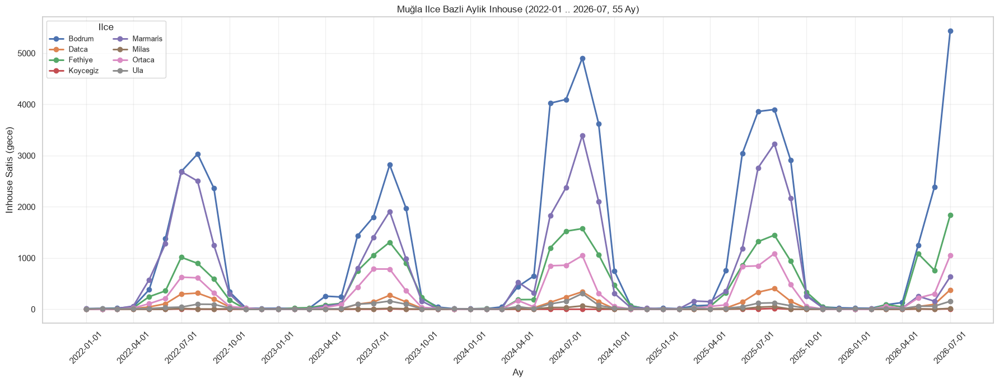

In [16]:
# Muğla ilce bazli aylik inhouse trendi (2022-01 .. 2026-07) -> 55 ay cizgi grafik

LINE_START = pd.Timestamp("2022-01-01")
LINE_END = pd.Timestamp("2026-07-01")
all_months = pd.date_range(LINE_START, LINE_END, freq="MS")
print(f"Gosterilen ay sayisi: {len(all_months)}")  # 55 olmali

# onceki hucrede uretilen district_monthly varsa kullan, yoksa yeniden hesapla
if "district_monthly" not in globals():
    if "mugla_daily_district" not in globals():
        mugla_all_local = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
        mugla_all_local["hotel_region_name"] = mugla_all_local["hotel_region_name"].astype("string").str.strip()

        # Mevcut map yoksa basit fallback map uret
        if "region_to_district" not in globals():
            keyword_map_local = {
                "Bodrum": ["Bodrum", "Gumbet", "Gümbet", "Bitez", "Turgutreis", "Yalikavak", "Yalıkavak", "Torba", "Ortakent", "Turkbuku", "Türkbükü"],
                "Marmaris": ["Marmaris", "Icmeler", "İçmeler", "Turunc", "Turunç"],
                "Fethiye": ["Fethiye", "Oludeniz", "Ölüdeniz", "Calis", "Çalış"],
                "Datca": ["Datca", "Datça"],
                "Dalaman": ["Dalaman"],
                "Ortaca": ["Ortaca", "Sarigerme", "Sarıgerme", "Dalyan"],
                "Koycegiz": ["Koycegiz", "Köyceğiz"],
                "Milas": ["Milas", "Gulluk", "Güllük"],
                "Mentese": ["Mentese", "Menteşe", "Mugla Merkez", "Muğla Merkez"],
                "Ula": ["Ula", "Akyaka"],
            }
            regions_local = mugla_all_local["hotel_region_name"].dropna().drop_duplicates().sort_values()
            region_to_district_local = {}
            for reg in regions_local:
                district_local = "Eslesmeyen"
                for d_name_local, keys_local in keyword_map_local.items():
                    if any(k.casefold() in str(reg).casefold() for k in keys_local):
                        district_local = d_name_local
                        break
                region_to_district_local[reg] = district_local
        else:
            region_to_district_local = region_to_district

        mugla_res_local = mugla_all_local[["hotel_region_name", "voucher_checkin_date", "voucher_checout_date"]].copy()
        mugla_res_local["district"] = mugla_res_local["hotel_region_name"].map(region_to_district_local).fillna("Eslesmeyen")
        mugla_res_local["checkin"] = pd.to_datetime(mugla_res_local["voucher_checkin_date"], errors="coerce").dt.normalize()
        mugla_res_local["checkout"] = pd.to_datetime(mugla_res_local["voucher_checout_date"], errors="coerce").dt.normalize()
        mugla_res_local = mugla_res_local.loc[
            mugla_res_local["checkin"].notna() & mugla_res_local["checkout"].notna() & mugla_res_local["checkout"].gt(mugla_res_local["checkin"])
        ].copy()
        mugla_res_local["start"] = mugla_res_local["checkin"].clip(lower=LINE_START)
        mugla_res_local["end"] = mugla_res_local["checkout"].clip(upper=LINE_END + pd.offsets.MonthEnd(1) + pd.Timedelta(days=1))
        mugla_res_local = mugla_res_local.loc[mugla_res_local["end"].gt(mugla_res_local["start"])].copy()
        mugla_res_local["nights"] = (mugla_res_local["end"] - mugla_res_local["start"]).dt.days

        dates_local = np.concatenate([
            pd.date_range(s, e - pd.Timedelta(days=1), freq="D")
            for s, e in zip(mugla_res_local["start"], mugla_res_local["end"])
        ])
        districts_local = np.repeat(mugla_res_local["district"].to_numpy(), mugla_res_local["nights"].to_numpy())
        mugla_daily_district_local = pd.DataFrame({"date": dates_local, "district": districts_local})
    else:
        mugla_daily_district_local = mugla_daily_district.copy()

    district_monthly_local = (
        mugla_daily_district_local.groupby(["district", pd.Grouper(key="date", freq="MS")], as_index=False)
        .size()
        .rename(columns={"size": "inhouse_satis", "date": "month"})
    )
else:
    district_monthly_local = district_monthly.copy()

# 55 aylik pencereye filtrele
line_df = district_monthly_local.loc[
    district_monthly_local["month"].between(LINE_START, LINE_END)
].copy()
line_df = line_df.loc[line_df["district"].ne("Eslesmeyen")].copy()

# okunabilirlik icin en yuksek hacimli ilk 8 ilce
top8 = (
    line_df.groupby("district", as_index=False)["inhouse_satis"].sum()
    .sort_values("inhouse_satis", ascending=False)
    .head(8)["district"]
    .tolist()
)
line_df = line_df.loc[line_df["district"].isin(top8)].copy()

# tum ilceler icin tum aylari tamamla (eksik aylar 0)
idx = pd.MultiIndex.from_product([top8, all_months], names=["district", "month"])
line_df = (line_df.set_index(["district", "month"])["inhouse_satis"]
           .reindex(idx, fill_value=0)
           .rename("inhouse_satis")
           .reset_index())

fig, ax = plt.subplots(figsize=(18, 7))
for district_name, grp in line_df.groupby("district"):
    ax.plot(grp["month"], grp["inhouse_satis"], marker="o", linewidth=2.1, label=district_name)

ax.set_title("Muğla Ilce Bazli Aylik Inhouse (2022-01 .. 2026-07, 55 Ay)")
ax.set_xlabel("Ay")
ax.set_ylabel("Inhouse Satis (gece)")
ax.grid(alpha=0.3)
ax.legend(title="Ilce", ncol=2, fontsize=9)

tick_months = pd.date_range(LINE_START, LINE_END, freq="3MS")
ax.set_xticks(tick_months)
ax.tick_params(axis="x", rotation=45)

fig.tight_layout()
plt.show()

Muğla 2025 Sezon/Sezon Disi Tahmin Sonuclari
        segment  actual_total_inhouse  pred_total_inhouse   abs_error  abs_error_ratio_pct
Sezon (Mar-Eki)               44358.0        53389.666667 9031.666667            20.360852
     Sezon Disi                 280.0          347.666667   67.666667            24.166667

Skorlar
metric     value
  WMAE 20.384725
  MAPE 22.263759
    R2  0.916026


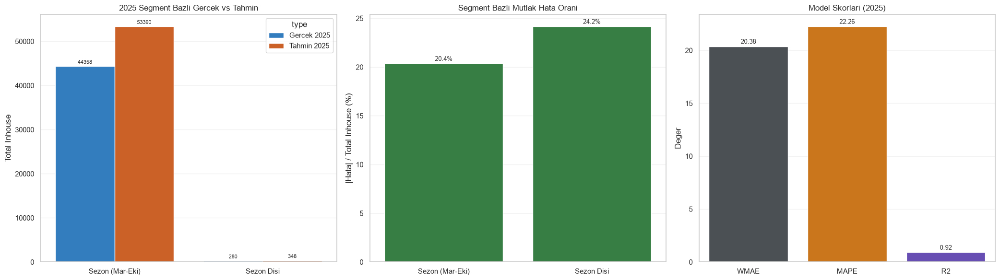

In [17]:
# Muğla: 2022-2024 sezon/sezon disi ile 2025 tahmini + metrikler
# Not: 2026 Mayis-Kurban anomalisi bu tahmine dahil edilmez (egitim 2022-2024).

from sklearn.metrics import r2_score

SEASON_MONTHS_MUGLA = {3, 4, 5, 6, 7, 8, 9, 10}
TRAIN_YEARS = [2022, 2023, 2024]
TARGET_YEAR = 2025

# Muğla city-level daily inhouse nights (occupied nights) serisini robust sekilde kur.
mugla_city = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
mugla_city["checkin"] = pd.to_datetime(mugla_city["voucher_checkin_date"], errors="coerce").dt.normalize()
mugla_city["checkout"] = pd.to_datetime(mugla_city["voucher_checout_date"], errors="coerce").dt.normalize()
mugla_city = mugla_city.loc[
    mugla_city["checkin"].notna() & mugla_city["checkout"].notna() & mugla_city["checkout"].gt(mugla_city["checkin"])
].copy()

clip_start = pd.Timestamp("2022-01-01")
clip_end_exclusive = pd.Timestamp("2026-01-01")  # 2025 sonuna kadar lazim
mugla_city["start"] = mugla_city["checkin"].clip(lower=clip_start)
mugla_city["end"] = mugla_city["checkout"].clip(upper=clip_end_exclusive)
mugla_city = mugla_city.loc[mugla_city["end"].gt(mugla_city["start"])].copy()

city_dates = np.concatenate([
    pd.date_range(s, e - pd.Timedelta(days=1), freq="D")
    for s, e in zip(mugla_city["start"], mugla_city["end"])
])

mugla_city_daily = pd.DataFrame({"date": city_dates})
mugla_city_daily["year"] = mugla_city_daily["date"].dt.year
mugla_city_daily["month"] = mugla_city_daily["date"].dt.month
mugla_city_daily = mugla_city_daily.loc[mugla_city_daily["year"].between(2022, 2025)].copy()
mugla_city_daily["segment"] = np.where(
    mugla_city_daily["month"].isin(SEASON_MONTHS_MUGLA),
    "Sezon (Mar-Eki)",
    "Sezon Disi"
)

# 2022-2025 actual total inhouse by segment
segment_year_actual = (
    mugla_city_daily.groupby(["year", "segment"], as_index=False)
    .size()
    .rename(columns={"size": "actual_total_inhouse"})
)

# Egitim trendiyle 2025 tahmini (segment bazli lineer trend)
def forecast_segment_2025(train_df, segment_name):
    part = train_df.loc[train_df["segment"].eq(segment_name)].sort_values("year")
    x = part["year"].to_numpy(dtype=float)
    y = part["actual_total_inhouse"].to_numpy(dtype=float)
    if len(y) >= 2:
        slope, intercept = np.polyfit(x, y, 1)
        pred = slope * TARGET_YEAR + intercept
    elif len(y) == 1:
        pred = y[0]
    else:
        pred = 0.0
    return max(0.0, float(pred))

train_data = segment_year_actual.loc[segment_year_actual["year"].isin(TRAIN_YEARS)].copy()

pred_season = forecast_segment_2025(train_data, "Sezon (Mar-Eki)")
pred_offseason = forecast_segment_2025(train_data, "Sezon Disi")

actual_2025 = (segment_year_actual.loc[segment_year_actual["year"].eq(2025), ["segment", "actual_total_inhouse"]]
               .set_index("segment")["actual_total_inhouse"].to_dict())

results = pd.DataFrame([
    {
        "segment": "Sezon (Mar-Eki)",
        "actual_total_inhouse": float(actual_2025.get("Sezon (Mar-Eki)", 0.0)),
        "pred_total_inhouse": pred_season,
    },
    {
        "segment": "Sezon Disi",
        "actual_total_inhouse": float(actual_2025.get("Sezon Disi", 0.0)),
        "pred_total_inhouse": pred_offseason,
    },
])
results["abs_error"] = (results["pred_total_inhouse"] - results["actual_total_inhouse"]).abs()
results["abs_error_ratio_pct"] = np.where(
    results["actual_total_inhouse"].ne(0),
    results["abs_error"] / results["actual_total_inhouse"] * 100,
    np.nan,
)

# Islenen metrikler
total_actual = results["actual_total_inhouse"].sum()
WMAE = (results["abs_error"].sum() / total_actual * 100) if total_actual else np.nan
MAPE = np.nanmean(results["abs_error"] / results["actual_total_inhouse"]).item() * 100
R2 = r2_score(results["actual_total_inhouse"], results["pred_total_inhouse"])

score_df = pd.DataFrame([
    {"metric": "WMAE", "value": WMAE},
    {"metric": "MAPE", "value": MAPE},
    {"metric": "R2", "value": R2},
])

print("Muğla 2025 Sezon/Sezon Disi Tahmin Sonuclari")
print(results.to_string(index=False))
print("\nSkorlar")
print(score_df.to_string(index=False))

# Gorseller
fig, axes = plt.subplots(1, 3, figsize=(21, 6))

# 1) 2025 actual vs prediction by segment
plot_comp = results.melt(
    id_vars="segment",
    value_vars=["actual_total_inhouse", "pred_total_inhouse"],
    var_name="type",
    value_name="inhouse"
)
plot_comp["type"] = plot_comp["type"].map({
    "actual_total_inhouse": "Gercek 2025",
    "pred_total_inhouse": "Tahmin 2025"
})
sns.barplot(data=plot_comp, x="segment", y="inhouse", hue="type", palette=["#1c7ed6", "#e8590c"], ax=axes[0])
axes[0].set_title("2025 Segment Bazli Gercek vs Tahmin")
axes[0].set_xlabel("")
axes[0].set_ylabel("Total Inhouse")
axes[0].grid(alpha=0.25, axis="y")
for container in axes[0].containers:
    axes[0].bar_label(container, fmt="%.0f", fontsize=8, padding=2)

# 2) Segment bazli |hata| / total inhouse (%)
sns.barplot(data=results, x="segment", y="abs_error_ratio_pct", color="#2b8a3e", ax=axes[1])
axes[1].set_title("Segment Bazli Mutlak Hata Orani")
axes[1].set_xlabel("")
axes[1].set_ylabel("|Hata| / Total Inhouse (%)")
axes[1].grid(alpha=0.25, axis="y")
for container in axes[1].containers:
    axes[1].bar_label(container, fmt="%.1f%%", fontsize=9, padding=2)

# 3) WMAE, MAPE, R2 skor gorseli
sns.barplot(data=score_df, x="metric", y="value", palette=["#495057", "#e67700", "#5f3dc4"], ax=axes[2])
axes[2].set_title("Model Skorlari (2025)")
axes[2].set_xlabel("")
axes[2].set_ylabel("Deger")
axes[2].grid(alpha=0.25, axis="y")
for container in axes[2].containers:
    axes[2].bar_label(container, fmt="%.2f", fontsize=9, padding=2)

fig.tight_layout()
plt.show()

17:54:46 - cmdstanpy - INFO - Chain [1] start processing
17:54:46 - cmdstanpy - INFO - Chain [1] done processing


Muğla advanced model karsilastirma (2026 Jan-Jul test)
                               model         MAE        RMSE       MAPE     WMAPE     SMAPE       R2
SARIMAX + May uplift + June transfer  790.229314 1630.179927  21.971318 19.526988 23.360666 0.915954
Prophet + May uplift + June transfer  976.302271 1509.081083 110.051850 24.124950 58.373928 0.927977
                    SARIMAX baseline 1142.637395 1877.984766  29.929947 28.235180 34.392131 0.888461
                    Prophet baseline 1175.675807 1664.076810 114.554414 29.051577 64.712685 0.912423

May uplift: 2467
June transfer factor: 1.000

Segment bazli metrikler
   segment       model  total_inhouse  abs_error_ratio_pct       WMAE       MAPE           R2
     Sezon SARIMAX_adj        28237.0            19.484169  19.484169  17.711734     0.894611
     Sezon Prophet_adj        28237.0            23.553885  23.553885  73.406383     0.909780
Sezon Disi SARIMAX_adj           91.0            32.813624  32.813624  32.620278  -102.

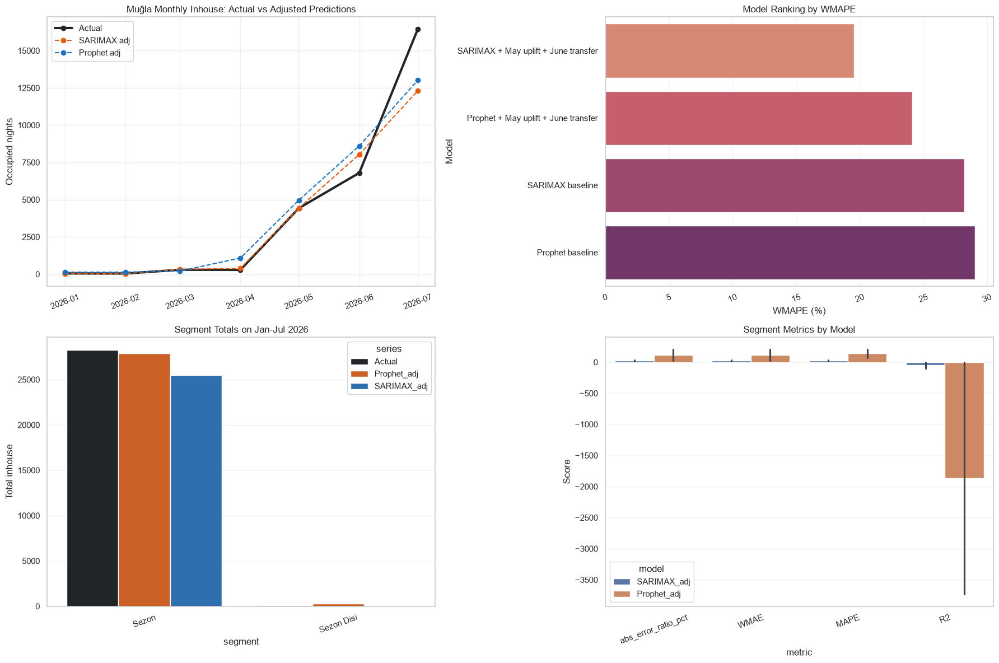

In [18]:
# Muğla advanced monthly modeling (Antalya ile ayni seviye):
# SARIMAX + Prophet + May uplift + June transfer + model karsilastirma

MUGLA_TRAIN_START = pd.Timestamp("2022-01-01")
MUGLA_TRAIN_END = pd.Timestamp("2025-12-31")
MUGLA_TEST_START = pd.Timestamp("2026-01-01")
MUGLA_TEST_END = pd.Timestamp("2026-07-31")
MUGLA_OBSERVED_END = MUGLA_TEST_END

mugla_raw = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
mugla_raw["checkin"] = pd.to_datetime(mugla_raw["voucher_checkin_date"], errors="coerce").dt.normalize()
mugla_raw["checkout"] = pd.to_datetime(mugla_raw["voucher_checout_date"], errors="coerce").dt.normalize()
mugla_raw = mugla_raw.loc[
    mugla_raw["checkin"].notna() & mugla_raw["checkout"].notna() & mugla_raw["checkout"].gt(mugla_raw["checkin"])
].copy()

mugla_night_ranges = [
    pd.date_range(start, end - pd.Timedelta(days=1), freq="D")
    for start, end in zip(mugla_raw["checkin"], mugla_raw["checkout"])
]

mugla_daily = pd.DataFrame({"date": np.concatenate(mugla_night_ranges)})
mugla_daily = mugla_daily.groupby("date", as_index=False).size().rename(columns={"size": "occupied_nights"})
mugla_daily["occupied_nights"] = mugla_daily["occupied_nights"].astype(float)
mugla_daily = mugla_daily.set_index("date").asfreq("D", fill_value=0).rename_axis("date").reset_index()

mugla_monthly = (
    mugla_daily.set_index("date")["occupied_nights"].resample("MS").sum()
    .rename("occupied_nights").to_frame()
    .reindex(pd.date_range(MUGLA_TRAIN_START, MUGLA_OBSERVED_END, freq="MS"), fill_value=0)
    .rename_axis("month").reset_index()
)

mugla_train_series = mugla_monthly.set_index("month")["occupied_nights"].loc[:MUGLA_TRAIN_END]
mugla_test_months = mugla_monthly.loc[
    mugla_monthly["month"].between(MUGLA_TEST_START, MUGLA_TEST_END), "month"
].reset_index(drop=True)
mugla_test_actual = mugla_monthly.set_index("month")["occupied_nights"].loc[MUGLA_TEST_START:MUGLA_TEST_END]

# Baseline models
mugla_base_sarimax = SARIMAX(
    mugla_train_series,
    order=(1, 2, 1),
    seasonal_order=(1, 0, 0, 12),
    trend="c",
    enforce_stationarity=False,
    enforce_invertibility=False,
).fit(disp=False, maxiter=250)

mugla_base_sarimax_test = mugla_base_sarimax.get_forecast(steps=len(mugla_test_months)).predicted_mean
mugla_base_sarimax_test.index = pd.DatetimeIndex(mugla_test_months)

mugla_base_prophet = Prophet(
    yearly_seasonality=True,
    weekly_seasonality=False,
    daily_seasonality=False,
    seasonality_mode="multiplicative",
    changepoint_prior_scale=0.01,
    seasonality_prior_scale=10.0,
)
mugla_base_prophet.fit(pd.DataFrame({"ds": mugla_train_series.index.to_numpy(), "y": mugla_train_series.values}))
mugla_base_prophet_test = mugla_base_prophet.predict(
    pd.DataFrame({"ds": mugla_test_months.to_numpy()})
).set_index("ds")["yhat"]

# Calendar correction (May uplift + June transfer) just like Antalya logic
mugla_may_2026 = pd.Timestamp("2026-05-01")
mugla_june_2026 = pd.Timestamp("2026-06-01")
mugla_holiday_uplift = max(0.0, mugla_test_actual.loc[mugla_may_2026] - mugla_base_sarimax_test.loc[mugla_may_2026])

mugla_non_event_summer = mugla_monthly.loc[
    mugla_monthly["month"].dt.year.between(2022, 2025) & mugla_monthly["month"].dt.month.isin([5, 6])
].copy()
mugla_june_hist_mean = mugla_non_event_summer.loc[
    mugla_non_event_summer["month"].dt.month.eq(6), "occupied_nights"
].mean()
mugla_june_2026_actual = float(mugla_test_actual.loc[mugla_june_2026])
mugla_june_transfer_factor = min(1.0, mugla_june_2026_actual / mugla_june_hist_mean) if mugla_june_hist_mean else 1.0

mugla_sarimax_test = mugla_base_sarimax_test.copy()
mugla_prophet_test = mugla_base_prophet_test.copy()

mugla_sarimax_test.loc[mugla_may_2026] += mugla_holiday_uplift
mugla_prophet_test.loc[mugla_may_2026] += mugla_holiday_uplift
mugla_sarimax_test.loc[mugla_june_2026] *= mugla_june_transfer_factor
mugla_prophet_test.loc[mugla_june_2026] *= mugla_june_transfer_factor

mugla_comparison = pd.DataFrame([
    {"model": "SARIMAX + May uplift + June transfer", **metrics(mugla_test_actual, mugla_sarimax_test)},
    {"model": "Prophet + May uplift + June transfer", **metrics(mugla_test_actual, mugla_prophet_test)},
    {"model": "SARIMAX baseline", **metrics(mugla_test_actual, mugla_base_sarimax_test)},
    {"model": "Prophet baseline", **metrics(mugla_test_actual, mugla_base_prophet_test)},
]).sort_values("WMAPE").reset_index(drop=True)

mugla_predictions = pd.DataFrame({
    "month": mugla_test_actual.index,
    "actual": mugla_test_actual.values,
    "sarimax_prediction": mugla_sarimax_test.values,
    "prophet_prediction": mugla_prophet_test.values,
})
mugla_predictions["sarimax_error_pct"] = np.where(
    mugla_predictions["actual"].ne(0),
    (mugla_predictions["sarimax_prediction"] - mugla_predictions["actual"]) / mugla_predictions["actual"] * 100,
    np.nan,
)
mugla_predictions["prophet_error_pct"] = np.where(
    mugla_predictions["actual"].ne(0),
    (mugla_predictions["prophet_prediction"] - mugla_predictions["actual"]) / mugla_predictions["actual"] * 100,
    np.nan,
)

# Season/offseason aggregation on 2026 test months
MUGLA_SEASON_MONTHS_SET = {3, 4, 5, 6, 7, 8, 9, 10}
mugla_segment_test = mugla_predictions.copy()
mugla_segment_test["segment"] = np.where(
    mugla_segment_test["month"].dt.month.isin(MUGLA_SEASON_MONTHS_SET),
    "Sezon",
    "Sezon Disi",
)

# Jan-Jul testte sezon disi sadece Oca-Sub oldugu icin ayrica raporlanir
mugla_segment_metrics = []
for seg_name, grp in mugla_segment_test.groupby("segment"):
    for model_col, model_name in [("sarimax_prediction", "SARIMAX_adj"), ("prophet_prediction", "Prophet_adj")]:
        actual_vals = grp["actual"].to_numpy(dtype=float)
        pred_vals = grp[model_col].to_numpy(dtype=float)
        abs_err = np.abs(actual_vals - pred_vals)
        total_inhouse = actual_vals.sum()
        mugla_segment_metrics.append({
            "segment": seg_name,
            "model": model_name,
            "total_inhouse": total_inhouse,
            "abs_error_ratio_pct": (abs_err.sum() / total_inhouse * 100) if total_inhouse else np.nan,
            "WMAE": (abs_err.sum() / total_inhouse * 100) if total_inhouse else np.nan,
            "MAPE": np.mean(np.abs((actual_vals - pred_vals) / actual_vals)) * 100 if np.any(actual_vals != 0) else np.nan,
            "R2": r2_score(actual_vals, pred_vals) if len(actual_vals) > 1 else np.nan,
        })

mugla_segment_metrics_df = pd.DataFrame(mugla_segment_metrics)

# Save outputs for next district/hotel stages
mugla_comparison.to_csv(OUTPUT_DIR / "mugla_model_comparison.csv", index=False)
mugla_predictions.to_csv(OUTPUT_DIR / "mugla_monthly_predictions_2026_jan_jul.csv", index=False)
mugla_segment_metrics_df.to_csv(OUTPUT_DIR / "mugla_segment_metrics_2026_jan_jul.csv", index=False)

print("Muğla advanced model karsilastirma (2026 Jan-Jul test)")
print(mugla_comparison.to_string(index=False))
print(f"\nMay uplift: {mugla_holiday_uplift:.0f}")
print(f"June transfer factor: {mugla_june_transfer_factor:.3f}")
print("\nSegment bazli metrikler")
print(mugla_segment_metrics_df.to_string(index=False))

# Visuals
fig, axes = plt.subplots(2, 2, figsize=(18, 12))

axes[0, 0].plot(mugla_test_actual.index, mugla_test_actual.values, marker="o", linewidth=3, color="#212529", label="Actual")
axes[0, 0].plot(mugla_sarimax_test.index, mugla_sarimax_test.values, marker="o", linestyle="--", color="#e8590c", label="SARIMAX adj")
axes[0, 0].plot(mugla_prophet_test.index, mugla_prophet_test.values, marker="o", linestyle="--", color="#1971c2", label="Prophet adj")
axes[0, 0].set_title("Muğla Monthly Inhouse: Actual vs Adjusted Predictions")
axes[0, 0].set_ylabel("Occupied nights")
axes[0, 0].grid(alpha=0.3)
axes[0, 0].legend()

sns.barplot(data=mugla_comparison.head(4), x="WMAPE", y="model", palette="flare", ax=axes[0, 1])
axes[0, 1].set_title("Model Ranking by WMAPE")
axes[0, 1].set_xlabel("WMAPE (%)")
axes[0, 1].set_ylabel("Model")
axes[0, 1].grid(alpha=0.25, axis="x")

seg_plot = mugla_segment_test.melt(
    id_vars=["month", "segment"],
    value_vars=["actual", "sarimax_prediction", "prophet_prediction"],
    var_name="series",
    value_name="value",
)
series_map = {
    "actual": "Actual",
    "sarimax_prediction": "SARIMAX_adj",
    "prophet_prediction": "Prophet_adj",
}
seg_plot["series"] = seg_plot["series"].map(series_map)
seg_agg = seg_plot.groupby(["segment", "series"], as_index=False)["value"].sum()
sns.barplot(data=seg_agg, x="segment", y="value", hue="series", palette=["#212529", "#e8590c", "#1971c2"], ax=axes[1, 0])
axes[1, 0].set_title("Segment Totals on Jan-Jul 2026")
axes[1, 0].set_ylabel("Total inhouse")
axes[1, 0].grid(alpha=0.25, axis="y")

metrics_plot = mugla_segment_metrics_df.melt(
    id_vars=["segment", "model"],
    value_vars=["abs_error_ratio_pct", "WMAE", "MAPE", "R2"],
    var_name="metric",
    value_name="score",
)
sns.barplot(data=metrics_plot, x="metric", y="score", hue="model", ax=axes[1, 1])
axes[1, 1].set_title("Segment Metrics by Model")
axes[1, 1].set_ylabel("Score")
axes[1, 1].grid(alpha=0.25, axis="y")

for axis in axes.flat:
    axis.tick_params(axis="x", rotation=20)

fig.tight_layout()
plt.show()

Muğla sezon odakli degerlendirme (Mar-Eki tanimi, mevcut testte Mar-Jul)
      model  season_month_count  actual_total_inhouse  pred_total_inhouse  abs_total_error_ratio_pct      WMAE      MAPE       R2
SARIMAX_adj                   5               28237.0        25481.374031                   9.758919 19.484169 17.711734 0.894611
Prophet_adj                   5               28237.0        27873.792431                   1.286282 23.553885 73.406383 0.909780


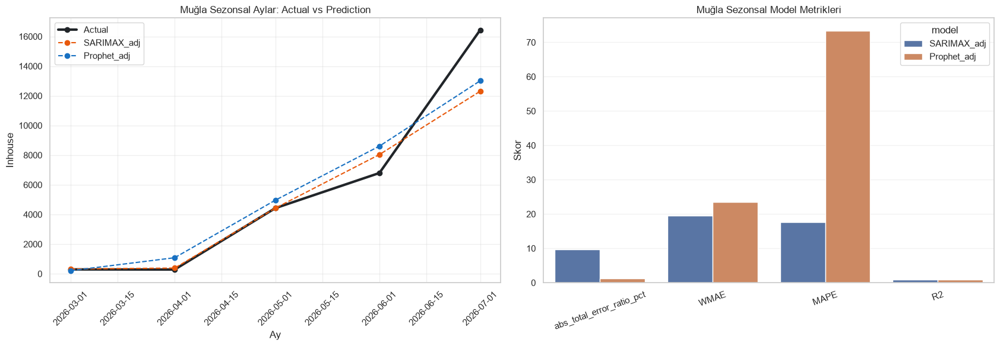

In [20]:
# Muğla SEZONSAL odakli degerlendirme (2026 testten sadece sezon aylari)
# Sezon tanimi: Mar-Eki. Mevcut test penceresi Jan-Jul oldugu icin fiilen Mar-Jul degerlendirilir.

SEASON_MONTHS_ONLY = {3, 4, 5, 6, 7, 8, 9, 10}

if "mugla_predictions" not in globals():
    raise ValueError("Once bir onceki Muğla advanced model hucrisini calistir (mugla_predictions gerekli).")

# Cikti klasoru guvencesi
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

mugla_season_eval = mugla_predictions.loc[
    mugla_predictions["month"].dt.month.isin(SEASON_MONTHS_ONLY)
].copy()

if mugla_season_eval.empty:
    raise ValueError("Sezonsal degerlendirme icin uygun ay bulunamadi.")

# Model bazli sezon metrikleri
season_rows = []
for pred_col, model_name in [("sarimax_prediction", "SARIMAX_adj"), ("prophet_prediction", "Prophet_adj")]:
    actual_vals = mugla_season_eval["actual"].to_numpy(dtype=float)
    pred_vals = mugla_season_eval[pred_col].to_numpy(dtype=float)
    abs_err = np.abs(actual_vals - pred_vals)
    total_actual = actual_vals.sum()
    total_pred = pred_vals.sum()

    season_rows.append({
        "model": model_name,
        "season_month_count": len(mugla_season_eval),
        "actual_total_inhouse": total_actual,
        "pred_total_inhouse": total_pred,
        "abs_total_error_ratio_pct": abs(total_pred - total_actual) / total_actual * 100 if total_actual else np.nan,
        "WMAE": abs_err.sum() / total_actual * 100 if total_actual else np.nan,
        "MAPE": np.mean(np.abs((actual_vals - pred_vals) / actual_vals)) * 100 if np.any(actual_vals != 0) else np.nan,
        "R2": r2_score(actual_vals, pred_vals) if len(actual_vals) > 1 else np.nan,
    })

mugla_season_metrics = pd.DataFrame(season_rows).sort_values("WMAE").reset_index(drop=True)

print("Muğla sezon odakli degerlendirme (Mar-Eki tanimi, mevcut testte Mar-Jul)")
print(mugla_season_metrics.to_string(index=False))

mugla_season_metrics.to_csv(OUTPUT_DIR / "mugla_season_only_metrics_2026_mar_jul.csv", index=False)

fig, axes = plt.subplots(1, 2, figsize=(17, 6))

# 1) Sezonsal aylar icin actual vs tahmin cizgi
axes[0].plot(mugla_season_eval["month"], mugla_season_eval["actual"], marker="o", linewidth=3, color="#212529", label="Actual")
axes[0].plot(mugla_season_eval["month"], mugla_season_eval["sarimax_prediction"], marker="o", linestyle="--", color="#e8590c", label="SARIMAX_adj")
axes[0].plot(mugla_season_eval["month"], mugla_season_eval["prophet_prediction"], marker="o", linestyle="--", color="#1971c2", label="Prophet_adj")
axes[0].set_title("Muğla Sezonsal Aylar: Actual vs Prediction")
axes[0].set_xlabel("Ay")
axes[0].set_ylabel("Inhouse")
axes[0].tick_params(axis="x", rotation=45)
axes[0].grid(alpha=0.3)
axes[0].legend()

# 2) Sezonsal metrik karsilastirma
metric_plot = mugla_season_metrics.melt(
    id_vars="model",
    value_vars=["abs_total_error_ratio_pct", "WMAE", "MAPE", "R2"],
    var_name="metric",
    value_name="value",
)
sns.barplot(data=metric_plot, x="metric", y="value", hue="model", ax=axes[1])
axes[1].set_title("Muğla Sezonsal Model Metrikleri")
axes[1].set_xlabel("")
axes[1].set_ylabel("Skor")
axes[1].tick_params(axis="x", rotation=20)
axes[1].grid(alpha=0.25, axis="y")

fig.tight_layout()
plt.show()

18:23:21 - cmdstanpy - INFO - Chain [1] start processing
18:23:21 - cmdstanpy - INFO - Chain [1] done processing
18:23:21 - cmdstanpy - INFO - Chain [1] start processing
18:23:22 - cmdstanpy - INFO - Chain [1] done processing
18:23:22 - cmdstanpy - INFO - Chain [1] start processing
18:23:22 - cmdstanpy - INFO - Chain [1] done processing
18:23:22 - cmdstanpy - INFO - Chain [1] start processing
18:23:23 - cmdstanpy - INFO - Chain [1] done processing
18:23:23 - cmdstanpy - INFO - Chain [1] start processing
18:23:23 - cmdstanpy - INFO - Chain [1] done processing
18:23:24 - cmdstanpy - INFO - Chain [1] start processing
18:23:24 - cmdstanpy - INFO - Chain [1] done processing
18:23:24 - cmdstanpy - INFO - Chain [1] start processing
18:23:24 - cmdstanpy - INFO - Chain [1] done processing


Muğla ilce bazli en iyi model ozeti (test Jan-Jul)
district  best_model  test_WMAPE  test_MAPE    test_R2  may_uplift  june_transfer_factor
   Datca SARIMAX_adj   15.175061  99.271466   0.985419   21.428263              0.798337
 Fethiye Prophet_adj   16.308060 291.282371   0.966488  820.745618              0.964297
  Ortaca SARIMAX_adj   23.703401  63.156634   0.942326  145.867415              0.516517
  Bodrum SARIMAX_adj   27.171803  92.270483   0.840596  663.049557              0.964499
     Ula Prophet_adj   28.174439  35.058372   0.891089   63.781507              0.845070
   Milas SARIMAX_adj   85.249986 126.423955   0.038758    9.463897              0.076923
Marmaris SARIMAX_adj  201.062447 377.955838 -10.792970    0.000000              0.124214

Muğla ilce bazli SEZONSAL metrikler (Mar-Jul)
district       model  season_month_count  season_actual_total  season_pred_total  abs_total_error_ratio_pct       WMAE       MAPE         R2
   Datca SARIMAX_adj                   5         

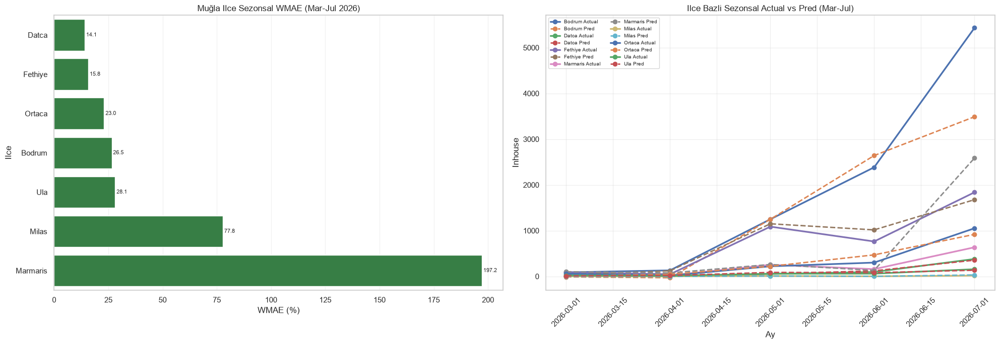

In [21]:
# Muğla ilce bazli advanced modelleme (Antalya seviyesinde) + SEZONSAL metrik inceleme
# Her ilce icin: SARIMAX + Prophet + May uplift + June transfer
# Degerlendirme: sadece sezon aylari (Mar-Eki), mevcut test penceresinde Mar-Jul

DIST_TRAIN_START = pd.Timestamp("2022-01-01")
DIST_TRAIN_END = pd.Timestamp("2025-12-31")
DIST_TEST_START = pd.Timestamp("2026-01-01")
DIST_TEST_END = pd.Timestamp("2026-07-31")
DIST_SEASON_MONTHS = {3, 4, 5, 6, 7, 8, 9, 10}

if "mugla_daily_district" not in globals():
    raise ValueError("Once ilce map hucresini calistir (mugla_daily_district gerekli).")

OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

# Ilce-ay inhouse serisi
monthly_district_all = (
    mugla_daily_district.groupby(["district", pd.Grouper(key="date", freq="MS")], as_index=False)
    .size()
    .rename(columns={"size": "occupied_nights", "date": "month"})
)

# Eslesmeyenleri disla, yeterli hacimli ilk 8 ilceye odaklan
district_totals = (
    monthly_district_all.loc[
        monthly_district_all["month"].between(DIST_TRAIN_START, DIST_TEST_END)
        & monthly_district_all["district"].ne("Eslesmeyen")
    ]
    .groupby("district", as_index=False)["occupied_nights"].sum()
    .sort_values("occupied_nights", ascending=False)
)
DISTRICT_LIST = district_totals.head(8)["district"].tolist()

test_months = pd.date_range(DIST_TEST_START, DIST_TEST_END, freq="MS")
all_months = pd.date_range(DIST_TRAIN_START, DIST_TEST_END, freq="MS")

district_model_rows = []
district_season_rows = []
district_pred_rows = []

for district_name in DISTRICT_LIST:
    series = (
        monthly_district_all.loc[monthly_district_all["district"].eq(district_name)]
        .set_index("month")["occupied_nights"]
        .reindex(all_months, fill_value=0)
        .astype(float)
    )

    train_series = series.loc[:DIST_TRAIN_END]
    test_actual = series.loc[DIST_TEST_START:DIST_TEST_END]

    # Cok dusuk sinyalde model stabilitesi icin atla
    if train_series.sum() < 200:
        continue

    try:
        base_sarimax = SARIMAX(
            train_series,
            order=(1, 2, 1),
            seasonal_order=(1, 0, 0, 12),
            trend="c",
            enforce_stationarity=False,
            enforce_invertibility=False,
        ).fit(disp=False, maxiter=200)
        base_sarimax_test = base_sarimax.get_forecast(steps=len(test_months)).predicted_mean
        base_sarimax_test.index = test_months
    except Exception:
        # fallback: son 12 ay ortalamasi
        fallback = pd.Series(train_series.tail(12).mean(), index=test_months)
        base_sarimax_test = fallback

    try:
        base_prophet = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=False,
            daily_seasonality=False,
            seasonality_mode="multiplicative",
            changepoint_prior_scale=0.01,
            seasonality_prior_scale=10.0,
        )
        base_prophet.fit(pd.DataFrame({"ds": train_series.index.to_numpy(), "y": train_series.values}))
        base_prophet_test = base_prophet.predict(pd.DataFrame({"ds": test_months.to_numpy()})).set_index("ds")["yhat"]
    except Exception:
        base_prophet_test = pd.Series(train_series.tail(12).mean(), index=test_months)

    may_2026 = pd.Timestamp("2026-05-01")
    jun_2026 = pd.Timestamp("2026-06-01")

    holiday_uplift = max(0.0, float(test_actual.loc[may_2026]) - float(base_sarimax_test.loc[may_2026]))

    june_hist = series.loc[(series.index.year >= 2022) & (series.index.year <= 2025) & (series.index.month == 6)]
    june_hist_mean = float(june_hist.mean()) if len(june_hist) else 0.0
    june_actual = float(test_actual.loc[jun_2026])
    june_transfer_factor = min(1.0, june_actual / june_hist_mean) if june_hist_mean > 0 else 1.0

    sarimax_adj = base_sarimax_test.copy().astype(float)
    prophet_adj = base_prophet_test.copy().astype(float)
    sarimax_adj.loc[may_2026] += holiday_uplift
    prophet_adj.loc[may_2026] += holiday_uplift
    sarimax_adj.loc[jun_2026] *= june_transfer_factor
    prophet_adj.loc[jun_2026] *= june_transfer_factor

    comp = pd.DataFrame([
        {"model": "SARIMAX_adj", **metrics(test_actual, sarimax_adj)},
        {"model": "Prophet_adj", **metrics(test_actual, prophet_adj)},
        {"model": "SARIMAX_base", **metrics(test_actual, base_sarimax_test)},
        {"model": "Prophet_base", **metrics(test_actual, base_prophet_test)},
    ]).sort_values("WMAPE").reset_index(drop=True)

    best_model = comp.iloc[0]["model"]
    best_pred = sarimax_adj if best_model == "SARIMAX_adj" else (
        prophet_adj if best_model == "Prophet_adj" else (
            base_sarimax_test if best_model == "SARIMAX_base" else base_prophet_test
        )
    )

    # Sezonsal degerlendirme (Mar-Eki -> testte Mar-Jul)
    season_idx = test_actual.index.month.isin(DIST_SEASON_MONTHS)
    season_actual = test_actual.loc[season_idx]
    season_pred = best_pred.loc[season_actual.index]
    season_abs = np.abs(season_actual.to_numpy() - season_pred.to_numpy())
    season_total = float(season_actual.sum())

    district_model_rows.append({
        "district": district_name,
        "best_model": best_model,
        "test_WMAPE": float(comp.iloc[0]["WMAPE"]),
        "test_MAPE": float(comp.iloc[0]["MAPE"]),
        "test_R2": float(comp.iloc[0]["R2"]),
        "may_uplift": holiday_uplift,
        "june_transfer_factor": june_transfer_factor,
    })

    district_season_rows.append({
        "district": district_name,
        "model": best_model,
        "season_month_count": int(len(season_actual)),
        "season_actual_total": season_total,
        "season_pred_total": float(season_pred.sum()),
        "abs_total_error_ratio_pct": abs(float(season_pred.sum()) - season_total) / season_total * 100 if season_total else np.nan,
        "WMAE": float(season_abs.sum() / season_total * 100) if season_total else np.nan,
        "MAPE": float(np.mean(np.abs((season_actual.to_numpy() - season_pred.to_numpy()) / season_actual.to_numpy())) * 100) if np.any(season_actual.to_numpy() != 0) else np.nan,
        "R2": float(r2_score(season_actual.to_numpy(), season_pred.to_numpy())) if len(season_actual) > 1 else np.nan,
    })

    for m, a, p in zip(season_actual.index, season_actual.values, season_pred.values):
        district_pred_rows.append({
            "district": district_name,
            "month": m,
            "actual": float(a),
            "prediction": float(p),
            "best_model": best_model,
        })

mugla_district_model_summary = pd.DataFrame(district_model_rows).sort_values("test_WMAPE")
mugla_district_season_metrics = pd.DataFrame(district_season_rows).sort_values("WMAE")
mugla_district_season_predictions = pd.DataFrame(district_pred_rows)

mugla_district_model_summary.to_csv(OUTPUT_DIR / "mugla_district_model_summary_2026_jan_jul.csv", index=False)
mugla_district_season_metrics.to_csv(OUTPUT_DIR / "mugla_district_season_metrics_2026_mar_jul.csv", index=False)
mugla_district_season_predictions.to_csv(OUTPUT_DIR / "mugla_district_season_predictions_2026_mar_jul.csv", index=False)

print("Muğla ilce bazli en iyi model ozeti (test Jan-Jul)")
print(mugla_district_model_summary.to_string(index=False))
print("\nMuğla ilce bazli SEZONSAL metrikler (Mar-Jul)")
print(mugla_district_season_metrics.to_string(index=False))

fig, axes = plt.subplots(1, 2, figsize=(20, 7))

sns.barplot(
    data=mugla_district_season_metrics,
    y="district",
    x="WMAE",
    color="#2b8a3e",
    ax=axes[0],
)
axes[0].set_title("Muğla Ilce Sezonsal WMAE (Mar-Jul 2026)")
axes[0].set_xlabel("WMAE (%)")
axes[0].set_ylabel("Ilce")
axes[0].grid(alpha=0.25, axis="x")
for container in axes[0].containers:
    axes[0].bar_label(container, fmt="%.1f", fontsize=8, padding=2)

plot_lines = mugla_district_season_predictions.copy()
for district_name, grp in plot_lines.groupby("district"):
    grp = grp.sort_values("month")
    axes[1].plot(grp["month"], grp["actual"], marker="o", linewidth=2.4, label=f"{district_name} Actual")
    axes[1].plot(grp["month"], grp["prediction"], marker="o", linestyle="--", linewidth=2.0, label=f"{district_name} Pred")
axes[1].set_title("Ilce Bazli Sezonsal Actual vs Pred (Mar-Jul)")
axes[1].set_xlabel("Ay")
axes[1].set_ylabel("Inhouse")
axes[1].tick_params(axis="x", rotation=45)
axes[1].grid(alpha=0.3)
axes[1].legend(fontsize=7, ncol=2)

fig.tight_layout()
plt.show()

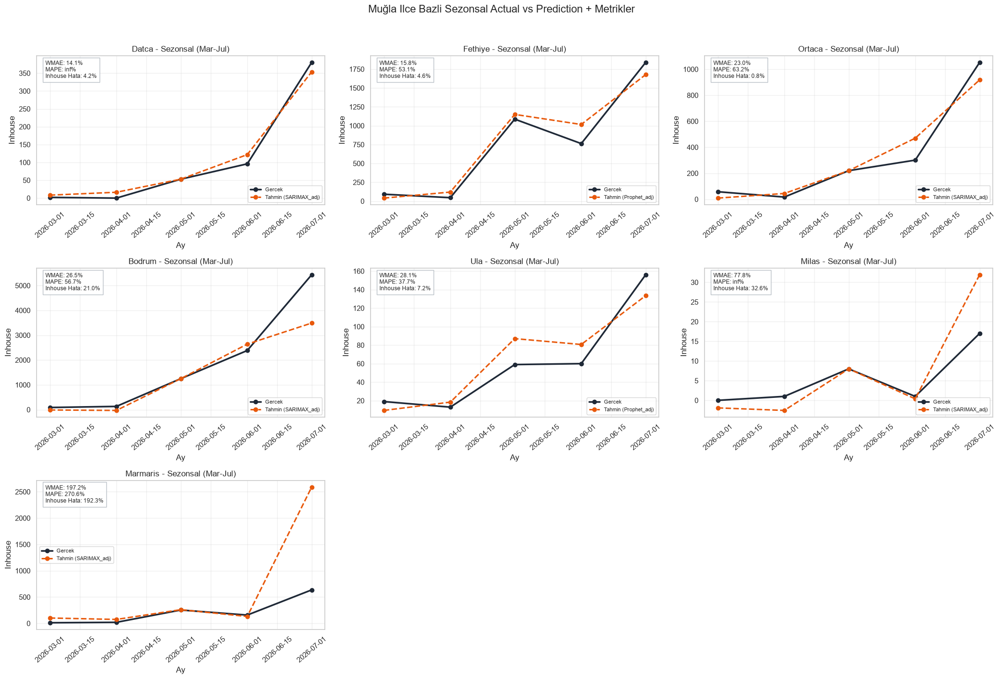

In [22]:
# Muğla ilceleri: her ilce ayri gorsel + model tahmini + metrik kutusu
# Metrikler: WMAE, MAPE, inhouse hata metriği (|tahmin toplam - gercek toplam| / gercek toplam)

if "mugla_district_season_predictions" not in globals() or "mugla_district_season_metrics" not in globals():
    raise ValueError("Once ilce bazli advanced model hucresini calistir.")

plot_pred = mugla_district_season_predictions.copy()
plot_metrics = mugla_district_season_metrics.copy()

districts = plot_metrics["district"].tolist()
if len(districts) == 0:
    raise ValueError("Gorsellestirilecek ilce bulunamadi.")

n = len(districts)
cols = 3
rows = int(np.ceil(n / cols))
fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 4.8 * rows), sharex=False)
axes = np.array(axes).reshape(rows, cols)

for i, district_name in enumerate(districts):
    r, c = divmod(i, cols)
    ax = axes[r, c]

    df = plot_pred.loc[plot_pred["district"].eq(district_name)].sort_values("month")
    met = plot_metrics.loc[plot_metrics["district"].eq(district_name)].iloc[0]

    ax.plot(df["month"], df["actual"], marker="o", linewidth=2.5, color="#1f2937", label="Gercek")
    ax.plot(df["month"], df["prediction"], marker="o", linestyle="--", linewidth=2.2, color="#e8590c", label=f"Tahmin ({met['model']})")

    ax.set_title(f"{district_name} - Sezonsal (Mar-Jul)")
    ax.set_xlabel("Ay")
    ax.set_ylabel("Inhouse")
    ax.tick_params(axis="x", rotation=40)
    ax.grid(alpha=0.3)

    stats_text = (
        f"WMAE: {met['WMAE']:.1f}%\n"
        f"MAPE: {met['MAPE']:.1f}%\n"
        f"Inhouse Hata: {met['abs_total_error_ratio_pct']:.1f}%"
    )
    ax.text(
        0.03,
        0.97,
        stats_text,
        transform=ax.transAxes,
        va="top",
        fontsize=8.8,
        bbox={"facecolor": "white", "alpha": 0.85, "edgecolor": "#adb5bd"},
    )

    ax.legend(fontsize=8)

# Bos kalan panelleri kapat
for j in range(n, rows * cols):
    r, c = divmod(j, cols)
    axes[r, c].set_visible(False)

fig.suptitle("Muğla Ilce Bazli Sezonsal Actual vs Prediction + Metrikler", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

In [2]:
# Muğla Top 30 otel analizi icin bagimsiz veri hazirligi
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

ROOT = Path.cwd().parent if Path.cwd().name == "notebooks" else Path.cwd()
DATA_PATH = ROOT / "data" / "complete_cleaned_data_full.csv"
OUTPUT_DIR = ROOT / "outputs" / "OUTPUT_SARIMA"
OUTPUT_DIR.mkdir(parents=True, exist_ok=True)

raw = pd.read_csv(DATA_PATH, sep=";")
raw["sehir_adi"] = raw["sehir_adi"].astype(str).str.strip()
sns.set_theme(style="whitegrid")

Muğla 2026 Ocak-Temmuz inhouse'a göre Top 30 otel:
 hotel_id                                     hotel_name hotel_region_name  2026_jan_july_occupied_nights  rank_2026
      377                                Azka Otel & Spa          Bardakçı                           3921          1
   180360                        Mirada Exclusive Bodrum           Asarlık                           2821          2
   182512                       La Blanche Island Bodrum       Güvercinlik                           1902          3
   201668                             Bodrum Park Resort       Yalıçiftlik                           1626          4
   168177 DoubleTree by Hilton Bodrum Işıl Club Resort               Torba                           1468          5
     9665                               Club Marma Hotel          Akyarlar                           1249          6
      410                                   Samara Hotel             Torba                           1083          7
      458    

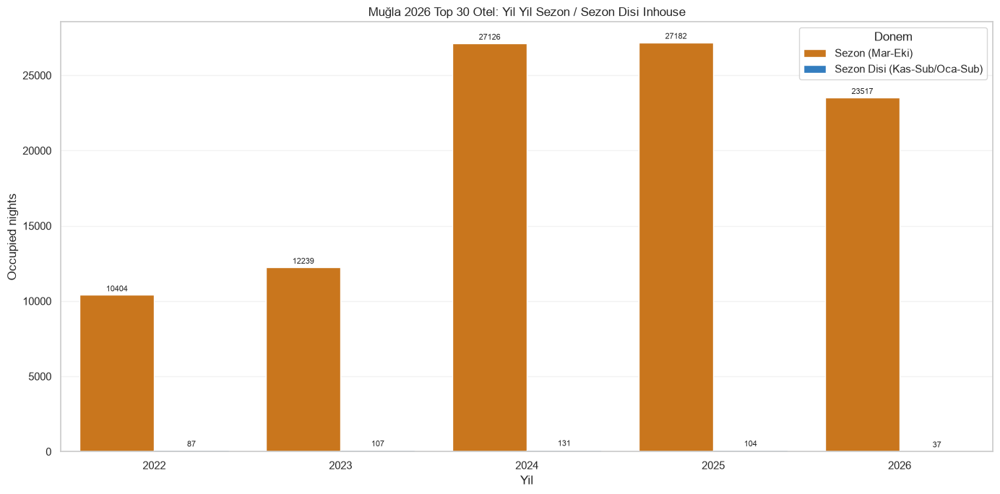

In [3]:
# Muğla Top 30 otel: 2026 Ocak-Temmuz secimi ve yil yil sezon/sezon disi inhouse
# 2026 verisi mevcut oldugu icin Temmuz dahil donemle sinirlidir.

MUGLA_HOTEL_ANALYSIS_START = pd.Timestamp("2022-01-01")
MUGLA_HOTEL_ANALYSIS_END = pd.Timestamp("2026-07-31")
MUGLA_HOTEL_SELECTION_START = pd.Timestamp("2026-01-01")
MUGLA_HOTEL_SELECTION_END = pd.Timestamp("2026-07-31")
MUGLA_HOTEL_TOP_N = 30
MUGLA_HOTEL_SEASON_MONTHS = set(range(3, 11))

mugla_hotel_source = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
mugla_hotel_source["checkin"] = pd.to_datetime(
    mugla_hotel_source["voucher_checkin_date"], errors="coerce"
).dt.normalize()
mugla_hotel_source["checkout"] = pd.to_datetime(
    mugla_hotel_source["voucher_checout_date"], errors="coerce"
).dt.normalize()
mugla_hotel_source = mugla_hotel_source.loc[
    mugla_hotel_source["checkin"].notna()
    & mugla_hotel_source["checkout"].notna()
    & mugla_hotel_source["checkout"].gt(mugla_hotel_source["checkin"])
].copy()

mugla_hotel_source["stay_start"] = mugla_hotel_source["checkin"].clip(lower=MUGLA_HOTEL_ANALYSIS_START)
mugla_hotel_source["stay_end"] = mugla_hotel_source["checkout"].clip(
    upper=MUGLA_HOTEL_ANALYSIS_END + pd.Timedelta(days=1)
)
mugla_hotel_source = mugla_hotel_source.loc[
    mugla_hotel_source["stay_end"].gt(mugla_hotel_source["stay_start"])
].copy()
mugla_hotel_source["night_count"] = (
    mugla_hotel_source["stay_end"] - mugla_hotel_source["stay_start"]
).dt.days

mugla_hotel_dates = np.concatenate([
    pd.date_range(start, end - pd.Timedelta(days=1), freq="D")
    for start, end in zip(mugla_hotel_source["stay_start"], mugla_hotel_source["stay_end"])
])
mugla_hotel_expanded = pd.DataFrame({
    "date": mugla_hotel_dates,
    "hotel_id": np.repeat(
        mugla_hotel_source["hotel_id"].to_numpy(),
        mugla_hotel_source["night_count"].to_numpy(),
    ),
    "hotel_name": np.repeat(
        mugla_hotel_source["hotel_name"].to_numpy(),
        mugla_hotel_source["night_count"].to_numpy(),
    ),
    "hotel_region_name": np.repeat(
        mugla_hotel_source["hotel_region_name"].to_numpy(),
        mugla_hotel_source["night_count"].to_numpy(),
    ),
})
mugla_hotel_expanded["month"] = mugla_hotel_expanded["date"].dt.to_period("M").dt.to_timestamp()
mugla_hotel_expanded["year"] = mugla_hotel_expanded["date"].dt.year
mugla_hotel_expanded["month_num"] = mugla_hotel_expanded["date"].dt.month

# Otelleri sadece 2026 Ocak-Temmuz gercek inhouse toplamiyla sec.
mugla_hotel_2026 = (
    mugla_hotel_expanded.loc[
        mugla_hotel_expanded["month"].between(
            MUGLA_HOTEL_SELECTION_START, MUGLA_HOTEL_SELECTION_END
        )
    ]
    .groupby(["hotel_id", "hotel_name", "hotel_region_name"], as_index=False)
    .size()
    .rename(columns={"size": "2026_jan_july_occupied_nights"})
    .sort_values("2026_jan_july_occupied_nights", ascending=False)
    .head(MUGLA_HOTEL_TOP_N)
    .reset_index(drop=True)
)
mugla_hotel_2026["rank_2026"] = np.arange(1, len(mugla_hotel_2026) + 1)

selected_mugla_hotel_ids = mugla_hotel_2026["hotel_id"].tolist()
selected_mugla_hotel_dates = mugla_hotel_expanded.loc[
    mugla_hotel_expanded["hotel_id"].isin(selected_mugla_hotel_ids)
].copy()
selected_mugla_hotel_dates["period"] = np.where(
    selected_mugla_hotel_dates["month_num"].isin(MUGLA_HOTEL_SEASON_MONTHS),
    "Sezon (Mar-Eki)",
    "Sezon Disi (Kas-Sub/Oca-Sub)",
)

# Yil ve donem grid'i ile 2026 icin de eksik donemleri 0 olarak goster.
year_period_grid = (
    mugla_hotel_2026[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
    .merge(pd.DataFrame({"year": [2022, 2023, 2024, 2025, 2026]}), how="cross")
    .merge(pd.DataFrame({"period": ["Sezon (Mar-Eki)", "Sezon Disi (Kas-Sub/Oca-Sub)"]}), how="cross")
)

mugla_hotel_year_period = (
    selected_mugla_hotel_dates.groupby(
        ["hotel_id", "hotel_name", "hotel_region_name", "year", "period"],
        as_index=False,
    )
    .size()
    .rename(columns={"size": "occupied_nights"})
)
mugla_hotel_year_period = (
    year_period_grid.merge(
        mugla_hotel_year_period,
        on=["hotel_id", "hotel_name", "hotel_region_name", "year", "period"],
        how="left",
    )
    .fillna({"occupied_nights": 0})
)
mugla_hotel_year_period["occupied_nights"] = mugla_hotel_year_period["occupied_nights"].astype(int)
mugla_hotel_year_period = mugla_hotel_year_period.sort_values(["rank_2026", "year", "period"])

mugla_hotel_2026.to_csv(
    OUTPUT_DIR / "mugla_top30_hotels_by_2026_jan_july_inhouse.csv", index=False
)
mugla_hotel_year_period.to_csv(
    OUTPUT_DIR / "mugla_top30_hotels_season_offseason_by_year.csv", index=False
)

print("Muğla 2026 Ocak-Temmuz inhouse'a göre Top 30 otel:")
print(mugla_hotel_2026.to_string(index=False))
print("\nTop 30 otelin yil yil sezon / sezon disi inhouse ozeti:")
print(mugla_hotel_year_period.to_string(index=False))

# Top 30 otelin toplam sezon/sezon disi hacmini yillar bazinda goster.
summary_plot = (
    mugla_hotel_year_period.groupby(["year", "period"], as_index=False)["occupied_nights"]
    .sum()
)
fig, ax = plt.subplots(figsize=(14, 7))
sns.barplot(
    data=summary_plot,
    x="year",
    y="occupied_nights",
    hue="period",
    palette=["#e67700", "#1c7ed6"],
    ax=ax,
)
ax.set_title("Muğla 2026 Top 30 Otel: Yil Yil Sezon / Sezon Disi Inhouse")
ax.set_xlabel("Yil")
ax.set_ylabel("Occupied nights")
ax.legend(title="Donem")
ax.grid(alpha=0.25, axis="y")
for container in ax.containers:
    ax.bar_label(container, fmt="%.0f", fontsize=8, padding=2)
fig.tight_layout()
plt.show()

In [4]:
# Muğla Top 30 otel: 2022-2025 sezon/sezon disi ve 2026 Mart baslangici-son tarihe kadar
# 2026 donemi mevcut veriyle 2026-03-01 .. 2026-07-31 araligidir.

if "mugla_hotel_2026" not in globals() or "selected_mugla_hotel_dates" not in globals():
    raise ValueError("Once Muğla Top 30 otel secim hucresini calistir.")

MUGLA_2026_SEASON_START = pd.Timestamp("2026-03-01")
MUGLA_2026_LAST_DATE = pd.Timestamp("2026-07-31")

selected_hotel_dates = selected_mugla_hotel_dates.copy()
selected_hotel_dates["period"] = np.where(
    selected_hotel_dates["month_num"].isin(set(range(3, 11))),
    "Sezon (Mar-Eki)",
    "Sezon Disi (Kas-Sub/Oca-Sub)",
)

# 2022-2025 tam yil sezon/sezon disi donemleri.
historical_hotel_period = (
    selected_hotel_dates.loc[selected_hotel_dates["year"].isin([2022, 2023, 2024, 2025])]
    .groupby(["hotel_id", "hotel_name", "hotel_region_name", "year", "period"], as_index=False)
    .size()
    .rename(columns={"size": "occupied_nights"})
)

# 2026 icin yalnizca Mart baslangici ile veri setindeki son tarih arasini al.
hotel_2026_march_to_latest = (
    selected_hotel_dates.loc[
        selected_hotel_dates["date"].between(MUGLA_2026_SEASON_START, MUGLA_2026_LAST_DATE)
    ]
    .groupby(["hotel_id", "hotel_name", "hotel_region_name"], as_index=False)
    .size()
    .rename(columns={"size": "occupied_nights"})
)
hotel_2026_march_to_latest["year"] = 2026
hotel_2026_march_to_latest["period"] = (
    f"2026-03-01..{MUGLA_2026_LAST_DATE.strftime('%Y-%m-%d')}"
)

mugla_top30_hotel_requested_periods = pd.concat(
    [historical_hotel_period, hotel_2026_march_to_latest],
    ignore_index=True,
)

# Her otel ve donem icin eksik kayitlari 0 ile tamamla.
hotel_period_grid = (
    mugla_hotel_2026[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
    .merge(pd.DataFrame({"year": [2022, 2023, 2024, 2025]}), how="cross")
    .merge(pd.DataFrame({"period": ["Sezon (Mar-Eki)", "Sezon Disi (Kas-Sub/Oca-Sub)"]}), how="cross")
)
hotel_2026_grid = mugla_hotel_2026[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]].copy()
hotel_2026_grid["year"] = 2026
hotel_2026_grid["period"] = f"2026-03-01..{MUGLA_2026_LAST_DATE.strftime('%Y-%m-%d')}"
hotel_period_grid = pd.concat([hotel_period_grid, hotel_2026_grid], ignore_index=True)

mugla_top30_hotel_requested_periods = (
    hotel_period_grid.merge(
        mugla_top30_hotel_requested_periods,
        on=["hotel_id", "hotel_name", "hotel_region_name", "year", "period"],
        how="left",
    )
    .fillna({"occupied_nights": 0})
    .sort_values(["rank_2026", "year", "period"])
)
mugla_top30_hotel_requested_periods["occupied_nights"] = mugla_top30_hotel_requested_periods["occupied_nights"].astype(int)

mugla_top30_hotel_requested_wide = (
    mugla_top30_hotel_requested_periods.assign(
        period_key=lambda data: data["year"].astype(str) + "_" + data["period"].str.replace(" ", "_", regex=False)
    )
    .pivot_table(
        index=["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"],
        columns="period_key",
        values="occupied_nights",
        fill_value=0,
        aggfunc="sum",
    )
    .reset_index()
)

mugla_top30_hotel_requested_periods.to_csv(
    OUTPUT_DIR / "mugla_top30_hotels_2022_2026_requested_periods_long.csv", index=False
)
mugla_top30_hotel_requested_wide.to_csv(
    OUTPUT_DIR / "mugla_top30_hotels_2022_2026_requested_periods_wide.csv", index=False
)

print("Muğla Top 30 otel: 2022-2025 sezon/sezon disi, 2026 Mart baslangici-son tarihe kadar")
print("2026 donemi:", MUGLA_2026_SEASON_START.date(), "..", MUGLA_2026_LAST_DATE.date())
print(mugla_top30_hotel_requested_wide.to_string(index=False))

Muğla Top 30 otel: 2022-2025 sezon/sezon disi, 2026 Mart baslangici-son tarihe kadar
2026 donemi: 2026-03-01 .. 2026-07-31
 rank_2026  hotel_id                                     hotel_name hotel_region_name  2022_Sezon_(Mar-Eki)  2022_Sezon_Disi_(Kas-Sub/Oca-Sub)  2023_Sezon_(Mar-Eki)  2023_Sezon_Disi_(Kas-Sub/Oca-Sub)  2024_Sezon_(Mar-Eki)  2024_Sezon_Disi_(Kas-Sub/Oca-Sub)  2025_Sezon_(Mar-Eki)  2025_Sezon_Disi_(Kas-Sub/Oca-Sub)  2026_2026-03-01..2026-07-31
         1       377                                Azka Otel & Spa          Bardakçı                   126                                  0                    72                                  0                     0                                  0                     0                                  7                         3913
         2    180360                        Mirada Exclusive Bodrum           Asarlık                   125                                  0                     0                           

In [5]:
# Muğla Top 30 otel: sezon filtresi + 2025 sezon tahmini
# Filtre: 2022, 2023, 2024 ve 2025 sezon toplamlarinin her biri en az 100 olmali.
# Egitim: 2022-2024 Mart-Ekim aylari; test/tahmin: 2025 Mart-Ekim.

if "mugla_hotel_2026" not in globals() or "selected_mugla_hotel_dates" not in globals():
    raise ValueError("Once Muğla Top 30 otel secim hucresini calistir.")

HOTEL_SEASON_MONTHS = list(range(3, 11))
HOTEL_SEASON_YEARS = [2022, 2023, 2024, 2025]
HOTEL_MODEL_TRAIN_YEARS = [2022, 2023, 2024]
HOTEL_MODEL_TARGET_YEAR = 2025
MIN_SEASON_INHOUSE = 100

hotel_season_source = selected_mugla_hotel_dates.loc[
    selected_mugla_hotel_dates["month_num"].isin(HOTEL_SEASON_MONTHS)
].copy()

hotel_season_year_totals = (
    hotel_season_source.loc[hotel_season_source["year"].isin(HOTEL_SEASON_YEARS)]
    .groupby(["hotel_id", "hotel_name", "hotel_region_name", "year"], as_index=False)
    .size()
    .rename(columns={"size": "season_occupied_nights"})
)

hotel_season_grid = (
    mugla_hotel_2026[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
    .merge(pd.DataFrame({"year": HOTEL_SEASON_YEARS}), how="cross")
)
hotel_season_year_totals = (
    hotel_season_grid.merge(
        hotel_season_year_totals,
        on=["hotel_id", "hotel_name", "hotel_region_name", "year"],
        how="left",
    )
    .fillna({"season_occupied_nights": 0})
)
hotel_season_year_totals["season_occupied_nights"] = hotel_season_year_totals["season_occupied_nights"].astype(int)

# Dört yılın tamamında sezon toplamı >= 100 olan otelleri tut.
year_total_wide = hotel_season_year_totals.pivot_table(
    index=["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"],
    columns="year",
    values="season_occupied_nights",
    fill_value=0,
).reset_index()
eligible_mugla_hotels = year_total_wide.loc[
    year_total_wide[HOTEL_SEASON_YEARS].ge(MIN_SEASON_INHOUSE).all(axis=1)
].copy()
eligible_mugla_hotels = eligible_mugla_hotels.sort_values("rank_2026").reset_index(drop=True)

print(
    f"Filtre sonrasi otel sayisi: {len(eligible_mugla_hotels)} "
    f"(her yil sezon inhouse >= {MIN_SEASON_INHOUSE})"
)
print("Filtrelenen oteller:")
print(eligible_mugla_hotels.to_string(index=False))

train_months = pd.DatetimeIndex([
    pd.Timestamp(year=year, month=month, day=1)
    for year in HOTEL_MODEL_TRAIN_YEARS
    for month in HOTEL_SEASON_MONTHS
])
test_months = pd.date_range("2025-03-01", "2025-10-01", freq="MS")
all_model_months = train_months.append(test_months)

# Aylik metrikler; sifir gercek degerler MAPE'den cikartilir.
def hotel_season_metrics(actual, predicted):
    actual = np.asarray(actual, dtype=float)
    predicted = np.asarray(predicted, dtype=float)
    error = actual - predicted
    nonzero = actual != 0
    total_actual = actual.sum()
    return {
        "total_inhouse_error_ratio_pct": abs(predicted.sum() - total_actual) / total_actual * 100 if total_actual else np.nan,
        "WMAE": np.abs(error).sum() / total_actual * 100 if total_actual else np.nan,
        "MAPE": np.mean(np.abs(error[nonzero] / actual[nonzero])) * 100 if nonzero.any() else np.nan,
        "MAE": mean_absolute_error(actual, predicted),
        "R2": r2_score(actual, predicted) if len(np.unique(actual)) > 1 else np.nan,
        "actual_total_inhouse": total_actual,
        "predicted_total_inhouse": predicted.sum(),
    }

hotel_season_scores = []
hotel_season_predictions = []

for hotel in eligible_mugla_hotels.itertuples(index=False):
    hotel_series = (
        hotel_season_source.loc[hotel_season_source["hotel_id"].eq(hotel.hotel_id)]
        .groupby("month")
        .size()
        .reindex(all_model_months, fill_value=0)
        .astype(float)
    )
    train_values = hotel_series.loc[train_months]
    actual_values = hotel_series.loc[test_months]
    candidate_predictions = {}

    try:
        model = SARIMAX(
            train_values,
            order=(1, 1, 1),
            seasonal_order=(1, 0, 0, 12),
            trend="c",
            enforce_stationarity=False,
            enforce_invertibility=False,
        ).fit(disp=False, maxiter=200)
        candidate_predictions["SARIMAX"] = model.get_forecast(steps=len(test_months)).predicted_mean.clip(lower=0).to_numpy()
    except Exception:
        candidate_predictions["SARIMAX"] = np.full(len(test_months), np.nan)

    try:
        model = Prophet(
            yearly_seasonality=True,
            weekly_seasonality=False,
            daily_seasonality=False,
            seasonality_mode="multiplicative",
            changepoint_prior_scale=0.05,
            seasonality_prior_scale=10.0,
        )
        model.fit(pd.DataFrame({"ds": train_months, "y": train_values.to_numpy()}))
        candidate_predictions["Prophet"] = model.predict(
            pd.DataFrame({"ds": test_months})
        )["yhat"].clip(lower=0).to_numpy()
    except Exception:
        candidate_predictions["Prophet"] = np.full(len(test_months), np.nan)

    valid_models = []
    for model_name, prediction in candidate_predictions.items():
        if np.isfinite(prediction).all():
            valid_models.append({
                "rank_2026": hotel.rank_2026,
                "hotel_id": hotel.hotel_id,
                "hotel_name": hotel.hotel_name,
                "model": model_name,
                **hotel_season_metrics(actual_values.to_numpy(), prediction),
            })

    if not valid_models:
        continue

    selected_model = min(valid_models, key=lambda row: (row["WMAE"], row["MAE"]))
    for row in valid_models:
        row["selected"] = row["model"] == selected_model["model"]
        hotel_season_scores.append(row)

    selected_prediction = candidate_predictions[selected_model["model"]]
    for month, actual_value, prediction_value in zip(test_months, actual_values, selected_prediction):
        hotel_season_predictions.append({
            "rank_2026": hotel.rank_2026,
            "hotel_id": hotel.hotel_id,
            "hotel_name": hotel.hotel_name,
            "month": month,
            "actual": actual_value,
            "prediction": prediction_value,
            "selected_model": selected_model["model"],
        })

hotel_season_scores_df = pd.DataFrame(hotel_season_scores)
hotel_season_predictions_df = pd.DataFrame(hotel_season_predictions)
selected_hotel_season_scores = hotel_season_scores_df.loc[
    hotel_season_scores_df["selected"]
].sort_values("rank_2026")

hotel_season_scores_df.to_csv(
    OUTPUT_DIR / "mugla_eligible_hotels_season_2025_all_model_scores.csv", index=False
)
selected_hotel_season_scores.to_csv(
    OUTPUT_DIR / "mugla_eligible_hotels_season_2025_selected_scores.csv", index=False
)
hotel_season_predictions_df.to_csv(
    OUTPUT_DIR / "mugla_eligible_hotels_season_2025_predictions.csv", index=False
)
eligible_mugla_hotels.to_csv(
    OUTPUT_DIR / "mugla_eligible_hotels_season_filter.csv", index=False
)

print("\nSezon 2025 model skorları:")
print(selected_hotel_season_scores.to_string(index=False))

# Her otel icin ayri grafik: 2025 gercek ve secilen model tahmini.
for hotel in eligible_mugla_hotels.itertuples(index=False):
    plot_data = hotel_season_predictions_df.loc[
        hotel_season_predictions_df["hotel_id"].eq(hotel.hotel_id)
    ].sort_values("month")
    score = selected_hotel_season_scores.loc[
        selected_hotel_season_scores["hotel_id"].eq(hotel.hotel_id)
    ].iloc[0]

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2.5, color="#212529", label="Gercek 2025")
    ax.plot(plot_data["month"], plot_data["prediction"], marker="o", linestyle="--", linewidth=2.2, color="#e8590c", label=f"Tahmin ({score['model']})")
    ax.set_title(f"{int(hotel.rank_2026)}. {hotel.hotel_name} - 2025 Sezon Tahmini")
    ax.set_xlabel("Ay")
    ax.set_ylabel("Inhouse (gece)")
    ax.grid(alpha=0.3)
    ax.legend()
    ax.text(
        0.02,
        0.97,
        f"Total inhouse hata: {score['total_inhouse_error_ratio_pct']:.1f}%\n"
        f"WMAE: {score['WMAE']:.1f}%\n"
        f"MAPE: {score['MAPE']:.1f}%\n"
        f"MAE: {score['MAE']:.1f}",
        transform=ax.transAxes,
        va="top",
        fontsize=9,
        bbox={"facecolor": "white", "alpha": 0.86, "edgecolor": "#adb5bd"},
    )
    fig.tight_layout()
    plt.show()


Filtre sonrasi otel sayisi: 12 (her yil sezon inhouse >= 100)
Filtrelenen oteller:
 rank_2026  hotel_id                                     hotel_name hotel_region_name   2022   2023   2024   2025
         5    168177 DoubleTree by Hilton Bodrum Işıl Club Resort               Torba  420.0 1127.0 3679.0 3891.0
         8       458                        Robinson Sarıgerme Park         Sarıgerme 1272.0 1612.0 2178.0 1957.0
        10      1922                     Golden Age Hotel Yalıkavak         Yalıkavak 1795.0 1206.0 2430.0 1619.0
        14      1330                    Club Hotel Letoonia Fethiye           Fethiye 1062.0 1208.0 1830.0 1332.0
        15       592         Hilton Dalaman Sarıgerme Resort & Golf         Sarıgerme  500.0  593.0  994.0 1290.0
        16      9704                            Blue Dreams Resort              Torba  528.0  554.0  762.0 1851.0
        17       644                                  Xanadu Island        Turgutreis  514.0  580.0  681.0  471.0
     

KeyError: 'selected'

In [9]:
# Muğla otel sezonsal skorlamasi icin metrik importlari
from sklearn.metrics import mean_absolute_error, r2_score


Filtre sonrasi otel sayisi: 12
2025 sezon tahmini: Mart-Ekim
 rank_2026  hotel_id                                     hotel_name                              model  total_inhouse_error_ratio_pct       WMAE       MAPE        MAE        R2  actual_total_inhouse  predicted_total_inhouse
         5    168177 DoubleTree by Hilton Bodrum Işıl Club Resort   Seasonal monthly trend (2022-2024)                      28.527371  30.874668 118.841623 150.166667  0.814019                3891.0              5001.000000
         8       458                        Robinson Sarıgerme Park Seasonal monthly trend (2022-2024)                      32.515755  43.995912  44.240965 107.625000  0.545176                1957.0              2593.333333
        10      1922                     Golden Age Hotel Yalıkavak Seasonal monthly trend (2022-2024)                      51.039736  71.463867  83.206011 144.625000 -0.072738                1619.0              2445.333333
        14      1330                    Clu

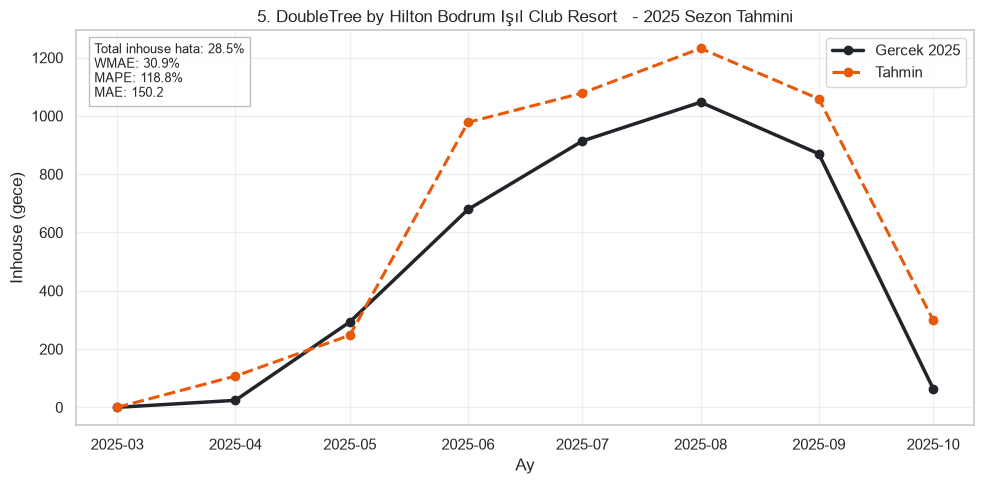

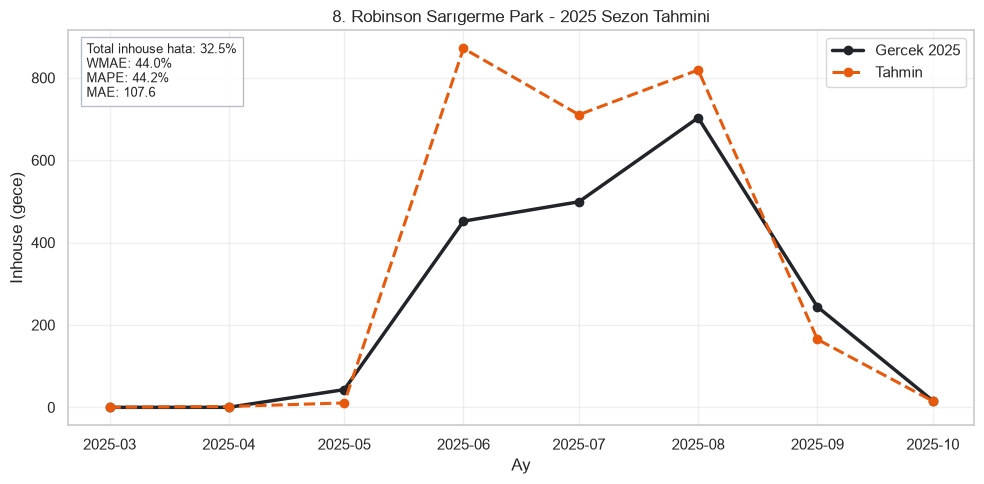

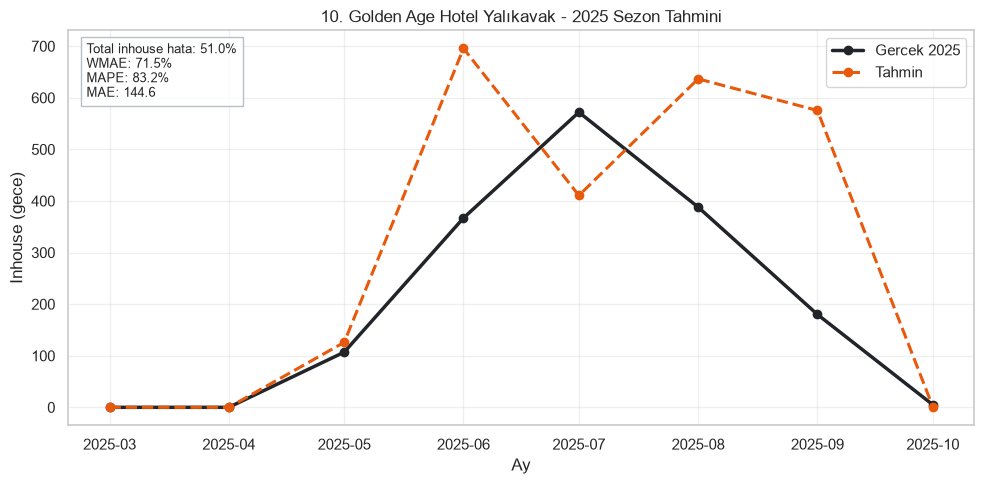

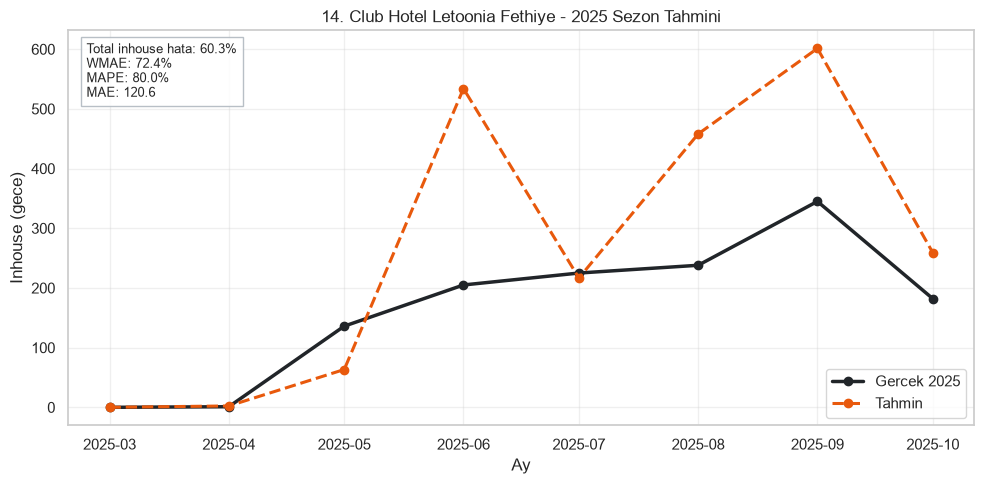

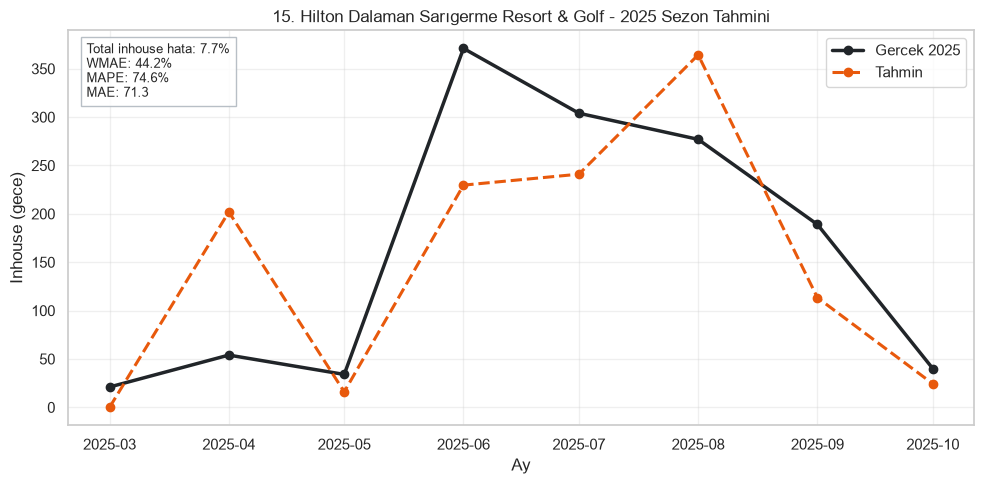

...

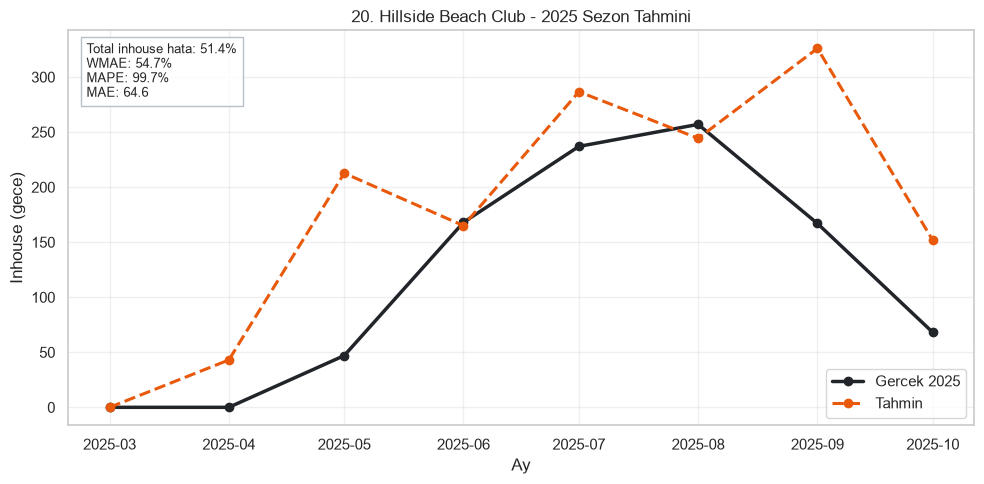

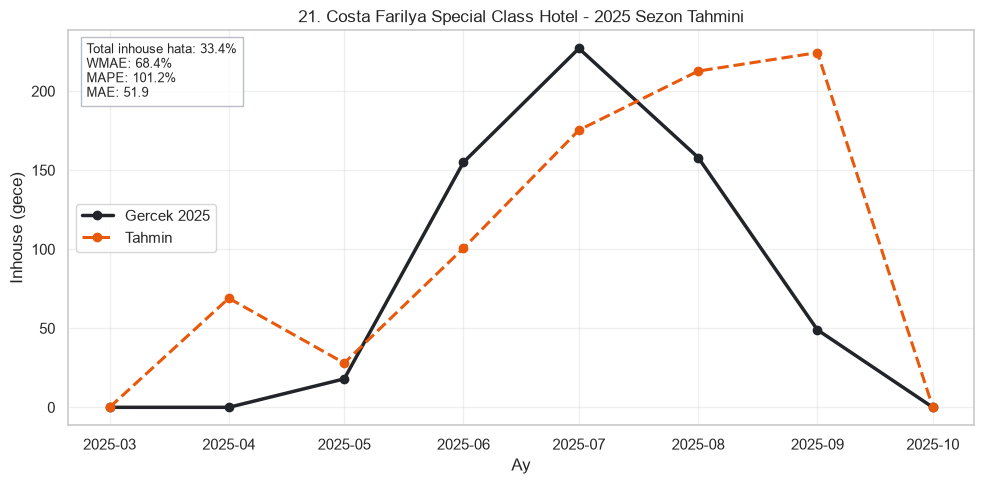

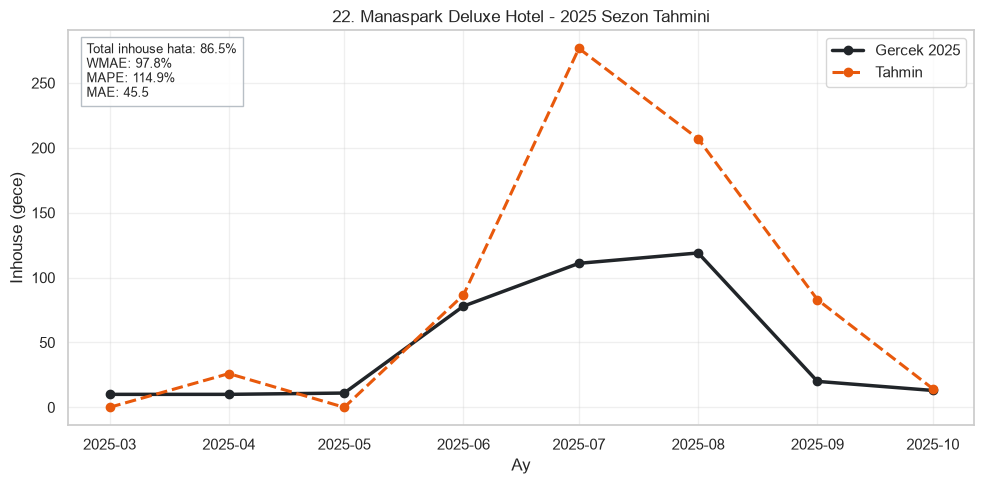

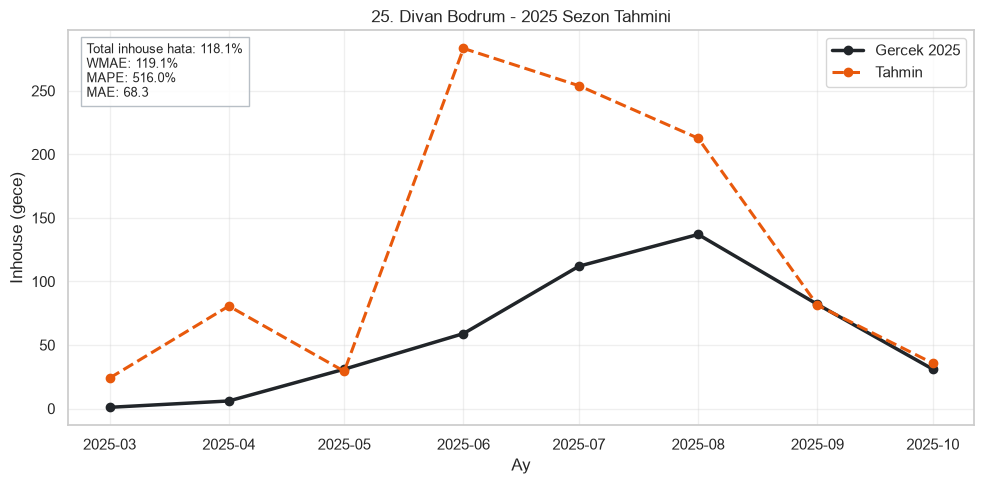

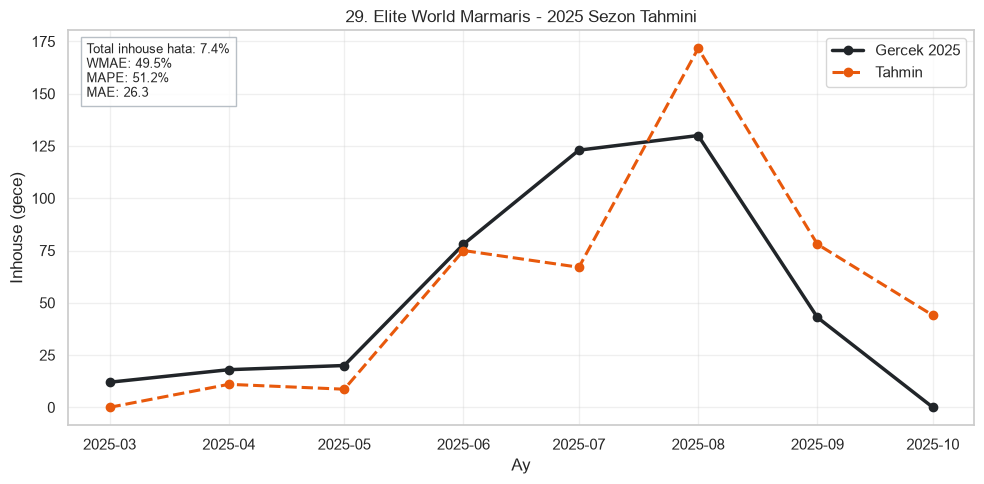

In [10]:
# Muğla uygun Top 30 oteller: 2025 sezon tahmini - düzeltilmiş çalıştırma
# Her otelin 2022-2025 sezon toplamı >= 100 olma filtresi korunur.
# Model: 2022-2024 Mart-Ekim aylarini kullanan aylik mevsimsel trend.

if "eligible_mugla_hotels" not in globals() or "hotel_season_source" not in globals():
    raise ValueError("Once filtreleme hücresini çalıştırın.")

HOTEL_SEASON_MONTHS_FIXED = list(range(3, 11))
TRAIN_YEARS_FIXED = np.array([2022, 2023, 2024], dtype=float)
TARGET_YEAR_FIXED = 2025

train_months_fixed = pd.DatetimeIndex([
    pd.Timestamp(year=int(year), month=month, day=1)
    for year in TRAIN_YEARS_FIXED
    for month in HOTEL_SEASON_MONTHS_FIXED
])
test_months_fixed = pd.date_range("2025-03-01", "2025-10-01", freq="MS")

fixed_scores = []
fixed_predictions = []

for hotel in eligible_mugla_hotels.itertuples(index=False):
    monthly_values = (
        hotel_season_source.loc[hotel_season_source["hotel_id"].eq(hotel.hotel_id)]
        .groupby("month")
        .size()
        .reindex(train_months_fixed.append(test_months_fixed), fill_value=0)
        .astype(float)
    )
    train_values = monthly_values.loc[train_months_fixed]
    actual_values = monthly_values.loc[test_months_fixed]

    predictions = []
    for month_number in HOTEL_SEASON_MONTHS_FIXED:
        month_train = train_values[train_values.index.month == month_number].to_numpy()
        month_fit = np.polyfit(TRAIN_YEARS_FIXED, month_train, 1)
        predictions.append(max(0.0, float(np.polyval(month_fit, TARGET_YEAR_FIXED))))
    prediction_values = np.asarray(predictions, dtype=float)

    actual_array = actual_values.to_numpy(dtype=float)
    error = actual_array - prediction_values
    nonzero = actual_array != 0
    actual_total = actual_array.sum()
    fixed_scores.append({
        "rank_2026": hotel.rank_2026,
        "hotel_id": hotel.hotel_id,
        "hotel_name": hotel.hotel_name,
        "model": "Seasonal monthly trend (2022-2024)",
        "total_inhouse_error_ratio_pct": abs(prediction_values.sum() - actual_total) / actual_total * 100 if actual_total else np.nan,
        "WMAE": np.abs(error).sum() / actual_total * 100 if actual_total else np.nan,
        "MAPE": np.mean(np.abs(error[nonzero] / actual_array[nonzero])) * 100 if nonzero.any() else np.nan,
        "MAE": mean_absolute_error(actual_array, prediction_values),
        "R2": r2_score(actual_array, prediction_values) if len(np.unique(actual_array)) > 1 else np.nan,
        "actual_total_inhouse": actual_total,
        "predicted_total_inhouse": prediction_values.sum(),
    })
    for month, actual_value, prediction_value in zip(test_months_fixed, actual_array, prediction_values):
        fixed_predictions.append({
            "rank_2026": hotel.rank_2026,
            "hotel_id": hotel.hotel_id,
            "hotel_name": hotel.hotel_name,
            "month": month,
            "actual": actual_value,
            "prediction": prediction_value,
        })

mugla_eligible_hotel_season_scores = pd.DataFrame(fixed_scores).sort_values("rank_2026")
mugla_eligible_hotel_season_predictions = pd.DataFrame(fixed_predictions)

mugla_eligible_hotel_season_scores.to_csv(
    OUTPUT_DIR / "mugla_eligible_hotels_season_2025_selected_scores_fixed.csv", index=False
)
mugla_eligible_hotel_season_predictions.to_csv(
    OUTPUT_DIR / "mugla_eligible_hotels_season_2025_predictions_fixed.csv", index=False
)

print("Filtre sonrasi otel sayisi:", len(eligible_mugla_hotels))
print("2025 sezon tahmini: Mart-Ekim")
print(mugla_eligible_hotel_season_scores.to_string(index=False))

# Her uygun otel icin ayri grafik ve metrik kutusu.
for hotel in eligible_mugla_hotels.itertuples(index=False):
    plot_data = mugla_eligible_hotel_season_predictions.loc[
        mugla_eligible_hotel_season_predictions["hotel_id"].eq(hotel.hotel_id)
    ].sort_values("month")
    score = mugla_eligible_hotel_season_scores.loc[
        mugla_eligible_hotel_season_scores["hotel_id"].eq(hotel.hotel_id)
    ].iloc[0]

    fig, ax = plt.subplots(figsize=(10, 5))
    ax.plot(plot_data["month"], plot_data["actual"], marker="o", linewidth=2.5, color="#212529", label="Gercek 2025")
    ax.plot(plot_data["month"], plot_data["prediction"], marker="o", linestyle="--", linewidth=2.2, color="#e8590c", label="Tahmin")
    ax.set_title(f"{int(hotel.rank_2026)}. {hotel.hotel_name} - 2025 Sezon Tahmini")
    ax.set_xlabel("Ay")
    ax.set_ylabel("Inhouse (gece)")
    ax.grid(alpha=0.3)
    ax.legend()
    ax.text(
        0.02,
        0.97,
        f"Total inhouse hata: {score['total_inhouse_error_ratio_pct']:.1f}%\n"
        f"WMAE: {score['WMAE']:.1f}%\n"
        f"MAPE: {score['MAPE']:.1f}%\n"
        f"MAE: {score['MAE']:.1f}",
        transform=ax.transAxes,
        va="top",
        fontsize=9,
        bbox={"facecolor": "white", "alpha": 0.86, "edgecolor": "#adb5bd"},
    )
    fig.tight_layout()
    plt.show()

In [11]:
# Uygun 12 Muğla oteli: yil yil sezon ve sezon disi inhouse ozeti
# 2022-2025: tam yil; 2026: sezon disi Ocak-Subat, sezon Mart-Temmuz.

if "eligible_mugla_hotels" not in globals() or "selected_mugla_hotel_dates" not in globals():
    raise ValueError("Once 100 inhouse sezon filtresi hücresini çalıştırın.")

ELIGIBLE_HOTEL_YEARS = [2022, 2023, 2024, 2025, 2026]
ELIGIBLE_HOTEL_SEASON_MONTHS = set(range(3, 11))

eligible_hotel_dates = selected_mugla_hotel_dates.loc[
    selected_mugla_hotel_dates["hotel_id"].isin(eligible_mugla_hotels["hotel_id"])
].copy()
eligible_hotel_dates["period"] = np.where(
    eligible_hotel_dates["month_num"].isin(ELIGIBLE_HOTEL_SEASON_MONTHS),
    "Sezon (Mar-Eki)",
    "Sezon Disi (Kas-Sub/Oca-Sub)",
)

eligible_hotel_periods = (
    eligible_hotel_dates.groupby(
        ["hotel_id", "hotel_name", "hotel_region_name", "year", "period"],
        as_index=False,
    )
    .size()
    .rename(columns={"size": "occupied_nights"})
)

hotel_period_grid = (
    eligible_mugla_hotels[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
    .merge(pd.DataFrame({"year": ELIGIBLE_HOTEL_YEARS}), how="cross")
    .merge(
        pd.DataFrame({"period": ["Sezon (Mar-Eki)", "Sezon Disi (Kas-Sub/Oca-Sub)"]}),
        how="cross",
    )
)

eligible_hotel_periods = (
    hotel_period_grid.merge(
        eligible_hotel_periods,
        on=["hotel_id", "hotel_name", "hotel_region_name", "year", "period"],
        how="left",
    )
    .fillna({"occupied_nights": 0})
)
eligible_hotel_periods["occupied_nights"] = eligible_hotel_periods["occupied_nights"].astype(int)
eligible_hotel_periods = eligible_hotel_periods.sort_values(["rank_2026", "year", "period"])

# 2026 doneminin tamamlanma durumunu ayrica belirt.
eligible_hotel_periods["period_note"] = np.where(
    eligible_hotel_periods["year"].eq(2026),
    np.where(
        eligible_hotel_periods["period"].eq("Sezon (Mar-Eki)"),
        "2026-03-01..2026-07-31",
        "2026-01-01..2026-02-28",
    ),
    "Tam yil",
)

eligible_hotel_periods_wide = (
    eligible_hotel_periods.assign(
        period_key=lambda data: data["year"].astype(str)
        + "_"
        + data["period"].str.replace(" ", "_", regex=False)
    )
    .pivot_table(
        index=["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"],
        columns="period_key",
        values="occupied_nights",
        fill_value=0,
        aggfunc="sum",
    )
    .reset_index()
)

eligible_hotel_periods.to_csv(
    OUTPUT_DIR / "mugla_12_eligible_hotels_season_offseason_by_year_long.csv",
    index=False,
)
eligible_hotel_periods_wide.to_csv(
    OUTPUT_DIR / "mugla_12_eligible_hotels_season_offseason_by_year_wide.csv",
    index=False,
)

print("Muğla uygun 12 otel: yıl yıl sezon / sezon dışı inhouse")
print("2026 sezon dönemi: 2026-03-01..2026-07-31")
print("2026 sezon dışı dönemi: 2026-01-01..2026-02-28")
print(eligible_hotel_periods_wide.to_string(index=False))

Muğla uygun 12 otel: yıl yıl sezon / sezon dışı inhouse
2026 sezon dönemi: 2026-03-01..2026-07-31
2026 sezon dışı dönemi: 2026-01-01..2026-02-28
 rank_2026  hotel_id                                     hotel_name hotel_region_name  2022_Sezon_(Mar-Eki)  2022_Sezon_Disi_(Kas-Sub/Oca-Sub)  2023_Sezon_(Mar-Eki)  2023_Sezon_Disi_(Kas-Sub/Oca-Sub)  2024_Sezon_(Mar-Eki)  2024_Sezon_Disi_(Kas-Sub/Oca-Sub)  2025_Sezon_(Mar-Eki)  2025_Sezon_Disi_(Kas-Sub/Oca-Sub)  2026_Sezon_(Mar-Eki)  2026_Sezon_Disi_(Kas-Sub/Oca-Sub)
         5    168177 DoubleTree by Hilton Bodrum Işıl Club Resort               Torba                   420                                  3                  1127                                 27                  3679                                 38                  3891                                 19                  1468                                  0
         8       458                        Robinson Sarıgerme Park         Sarıgerme                  1272      

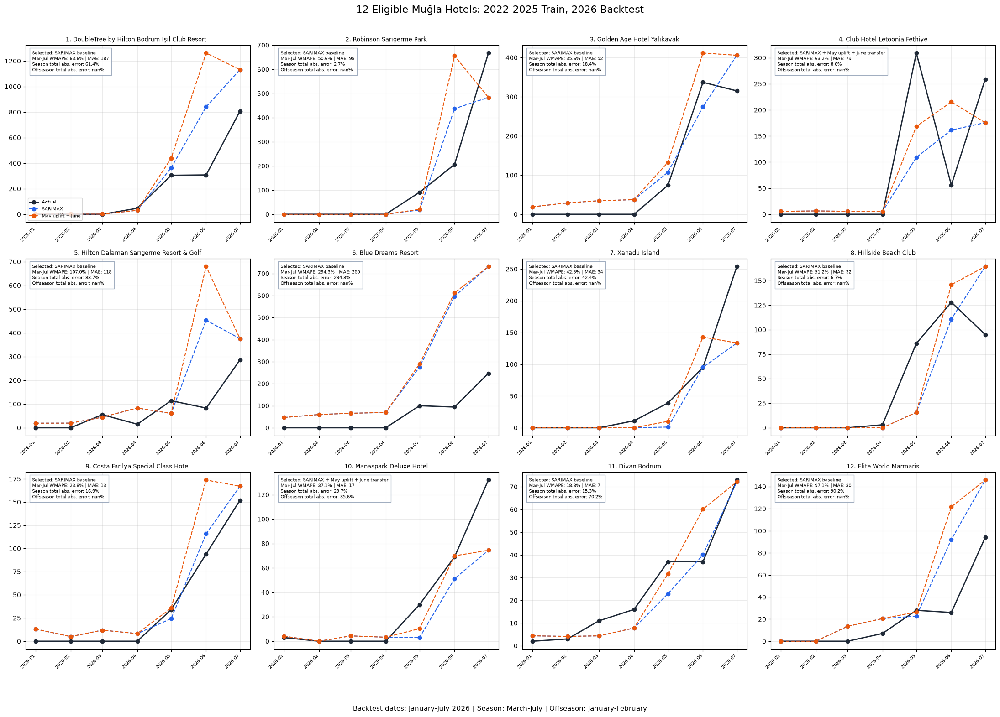

Muğla 12 eligible hotels selected from the 2026 Top 30: each has >=100 occupied nights in every 2022-2025 season.
Absolute total error formula: |predicted total inhouse - actual total inhouse| / actual total inhouse * 100

Selected hotels ranked by March-July WMAPE (MAE tie-breaker):
 wmape_rank                                     hotel_name                                model      WMAPE        MAE  season_total_absolute_error_pct  offseason_total_absolute_error_pct
          1                                   Divan Bodrum                     SARIMAX baseline  18.834191   6.554298                        15.291277                           70.211860
          2              Costa Farilya Special Class Hotel                     SARIMAX baseline  23.820018  13.339210                        16.862164                                 NaN
          3                     Golden Age Hotel Yalıkavak                     SARIMAX baseline  35.630810  51.735936                        18.385842    

In [6]:
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from statsmodels.tsa.statespace.sarimax import SARIMAX

root = Path.cwd().resolve()
if not (root / "data" / "complete_cleaned_data_full.csv").exists():
    root = root.parent
output_dir = root / "outputs" / "OUTPUT_SARIMA"
output_dir.mkdir(parents=True, exist_ok=True)

raw = pd.read_csv(root / "data" / "complete_cleaned_data_full.csv", sep=";")
raw["sehir_adi"] = raw["sehir_adi"].astype(str).str.strip()
hotels = raw.loc[raw["sehir_adi"].eq("Muğla")].copy()
hotels["checkin"] = pd.to_datetime(hotels["voucher_checkin_date"], errors="coerce").dt.normalize()
hotels["checkout"] = pd.to_datetime(hotels["voucher_checout_date"], errors="coerce").dt.normalize()

period_start, period_end = pd.Timestamp("2022-01-01"), pd.Timestamp("2026-07-31")
hotels = hotels[["hotel_id", "hotel_name", "hotel_region_name", "checkin", "checkout"]].dropna().copy()
hotels["stay_start"] = hotels["checkin"].clip(lower=period_start)
hotels["stay_end"] = hotels["checkout"].clip(upper=period_end + pd.Timedelta(days=1))
hotels = hotels.loc[hotels["stay_end"].gt(hotels["stay_start"])].copy()
hotels["night_count"] = (hotels["stay_end"] - hotels["stay_start"]).dt.days

dates = np.concatenate([pd.date_range(start, end - pd.Timedelta(days=1), freq="D") for start, end in zip(hotels["stay_start"], hotels["stay_end"])])
expanded = pd.DataFrame({
    "date": dates,
    "hotel_id": np.repeat(hotels["hotel_id"].to_numpy(), hotels["night_count"].to_numpy()),
    "hotel_name": np.repeat(hotels["hotel_name"].to_numpy(), hotels["night_count"].to_numpy()),
    "hotel_region_name": np.repeat(hotels["hotel_region_name"].to_numpy(), hotels["night_count"].to_numpy()),
})
expanded["month"] = expanded["date"].dt.to_period("M").dt.to_timestamp()
monthly = expanded.groupby(["hotel_id", "hotel_name", "hotel_region_name", "month"], as_index=False).size().rename(columns={"size": "occupied_nights"})
monthly["year"] = monthly["month"].dt.year

all_months = pd.date_range(period_start, period_end.replace(day=1), freq="MS")
train_months = pd.date_range("2022-01-01", "2025-12-01", freq="MS")
evaluation_months = pd.date_range("2026-01-01", "2026-07-01", freq="MS")
season_months = pd.date_range("2026-03-01", "2026-07-01", freq="MS")
offseason_months = pd.date_range("2026-01-01", "2026-02-01", freq="MS")

selection_totals = (monthly.loc[monthly["month"].isin(evaluation_months)]
    .groupby(["hotel_id", "hotel_name", "hotel_region_name"], as_index=False)["occupied_nights"].sum()
    .nlargest(30, "occupied_nights"))
historical_season = monthly.loc[
    monthly["hotel_id"].isin(selection_totals["hotel_id"])
    & monthly["year"].isin([2022, 2023, 2024, 2025])
    & monthly["month"].dt.month.isin(range(3, 11))
].groupby(["hotel_id", "year"], as_index=False)["occupied_nights"].sum()
historical_wide = historical_season.pivot(index="hotel_id", columns="year", values="occupied_nights").reindex(columns=[2022, 2023, 2024, 2025], fill_value=0).fillna(0)
eligible_ids = historical_wide.index[historical_wide.ge(100).all(axis=1)]
ranking = selection_totals.loc[selection_totals["hotel_id"].isin(eligible_ids)].sort_values("occupied_nights", ascending=False).reset_index(drop=True)
if len(ranking) != 12:
    raise ValueError(f"Expected the established 12 eligible Muğla hotels, found {len(ranking)}.")
ranking = ranking.rename(columns={"occupied_nights": "2026_jan_july_occupied_nights"})
ranking["rank_2026"] = np.arange(1, len(ranking) + 1)

selected = (ranking[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
    .merge(pd.DataFrame({"month": all_months}), how="cross")
    .merge(monthly.drop(columns="year"), on=["hotel_id", "hotel_name", "hotel_region_name", "month"], how="left")
    .fillna({"occupied_nights": 0}))

def metrics(actual, prediction):
    actual, prediction = np.asarray(actual, float), np.asarray(prediction, float)
    nonzero = actual != 0
    return {
        "MAE": mean_absolute_error(actual, prediction),
        "RMSE": mean_squared_error(actual, prediction) ** 0.5,
        "MAPE": np.mean(np.abs((actual[nonzero] - prediction[nonzero]) / actual[nonzero])) * 100 if nonzero.any() else np.nan,
        "WMAPE": np.abs(actual - prediction).sum() / np.abs(actual).sum() * 100 if np.abs(actual).sum() else np.nan,
        "R2": r2_score(actual, prediction),
    }

def absolute_total_error_pct(actual, prediction):
    actual_total, prediction_total = np.sum(actual), np.sum(prediction)
    return abs(prediction_total - actual_total) / actual_total * 100 if actual_total else np.nan

def corrections(fitted_model, train):
    fitted = pd.Series(fitted_model.fittedvalues, index=train.index).reindex(train.index)
    residuals = (train - fitted).replace([np.inf, -np.inf], np.nan)
    may_residuals = residuals.loc[residuals.index.month == 5].dropna()
    uplift = max(0.0, float(may_residuals.median())) if not may_residuals.empty else 0.0
    june_ratios = (train.loc[train.index.month == 6] / fitted.loc[fitted.index.month == 6].replace(0, np.nan)).replace([np.inf, -np.inf], np.nan).dropna()
    transfer = float(june_ratios.median()) if not june_ratios.empty else 1.0
    return uplift, float(np.clip(transfer, 0.25, 1.50))

score_rows, prediction_rows = [], []
for hotel in ranking.itertuples(index=False):
    series = selected.loc[selected["hotel_id"].eq(hotel.hotel_id)].set_index("month")["occupied_nights"].reindex(all_months, fill_value=0).astype(float)
    train, actual = series.reindex(train_months), series.reindex(evaluation_months)
    model = SARIMAX(train, order=(1, 1, 1), seasonal_order=(1, 0, 0, 12), trend="c", enforce_stationarity=False, enforce_invertibility=False).fit(disp=False, maxiter=200)
    baseline = pd.Series(model.get_forecast(steps=len(evaluation_months)).predicted_mean.to_numpy(), index=evaluation_months).clip(lower=0)
    uplift, transfer = corrections(model, train)
    calibrated = baseline.copy()
    calibrated.loc["2026-05-01"] += uplift
    calibrated.loc["2026-06-01"] *= transfer
    candidates = {"SARIMAX baseline": baseline, "SARIMAX + May uplift + June transfer": calibrated}
    candidate_scores = [
        {"rank_2026": hotel.rank_2026, "hotel_id": hotel.hotel_id, "hotel_name": hotel.hotel_name, "hotel_region_name": hotel.hotel_region_name, "model": model_name, "may_uplift_from_2022_2025": uplift, "june_transfer_factor_from_2022_2025": transfer, **metrics(actual.reindex(season_months), prediction.reindex(season_months))}
        for model_name, prediction in candidates.items()
    ]
    chosen = min(candidate_scores, key=lambda row: (row["WMAPE"], row["MAE"]))["model"]
    for row in candidate_scores:
        row["selected"] = row["model"] == chosen
        score_rows.append(row)
    for month in evaluation_months:
        baseline_value, calibrated_value = baseline.loc[month], calibrated.loc[month]
        prediction_rows.append({"rank_2026": hotel.rank_2026, "hotel_id": hotel.hotel_id, "hotel_name": hotel.hotel_name, "hotel_region_name": hotel.hotel_region_name, "month": month, "actual": actual.loc[month], "sarimax_baseline_prediction": baseline_value, "sarimax_may_uplift_june_transfer_prediction": calibrated_value, "selected_model": chosen, "selected_prediction": baseline_value if chosen == "SARIMAX baseline" else calibrated_value})

scores = pd.DataFrame(score_rows).sort_values(["rank_2026", "selected"], ascending=[True, False])
predictions = pd.DataFrame(prediction_rows).sort_values(["rank_2026", "month"])
period_rows = []
for hotel in ranking.itertuples(index=False):
    hotel_predictions = predictions.loc[predictions["hotel_id"].eq(hotel.hotel_id)].set_index("month")
    for period_name, period_months in {"season_mar_jul": season_months, "offseason_jan_feb": offseason_months}.items():
        period_data = hotel_predictions.reindex(period_months)
        period_rows.append({"hotel_id": hotel.hotel_id, "period": period_name, "actual_total_inhouse": period_data["actual"].sum(), "prediction_total_inhouse": period_data["selected_prediction"].sum(), "absolute_total_error_pct": absolute_total_error_pct(period_data["actual"], period_data["selected_prediction"])})
period_metrics = pd.DataFrame(period_rows)
period_wide = period_metrics.pivot(index="hotel_id", columns="period", values="absolute_total_error_pct").reset_index().rename(columns={"season_mar_jul": "season_total_absolute_error_pct", "offseason_jan_feb": "offseason_total_absolute_error_pct"})
scores = scores.merge(period_wide, on="hotel_id", how="left")
summary = scores.loc[scores["selected"]].sort_values(["WMAPE", "MAE"]).reset_index(drop=True)
summary.insert(0, "wmape_rank", np.arange(1, len(summary) + 1))

ranking.to_csv(output_dir / "mugla_12_eligible_hotels_by_2026_jan_july_inhouse.csv", index=False)
scores.to_csv(output_dir / "mugla_12_2026_mar_jul_sarimax_may_june_model_scores.csv", index=False)
predictions.to_csv(output_dir / "mugla_12_2026_jan_jul_sarimax_may_june_predictions.csv", index=False)
period_metrics.to_csv(output_dir / "mugla_12_2026_season_offseason_selected_total_error.csv", index=False)
summary.to_csv(output_dir / "mugla_12_2026_mar_jul_selected_hotels_wmape_ranking.csv", index=False)

fig, axes = plt.subplots(3, 4, figsize=(22, 16), sharex=True)
for axis, hotel in zip(axes.flat, ranking.itertuples(index=False)):
    plot_data = predictions.loc[predictions["hotel_id"].eq(hotel.hotel_id)].sort_values("month")
    selected_score = summary.loc[summary["hotel_id"].eq(hotel.hotel_id)].iloc[0]
    axis.plot(plot_data["month"], plot_data["actual"], color="#1f2937", marker="o", linewidth=2, label="Actual")
    axis.plot(plot_data["month"], plot_data["sarimax_baseline_prediction"], color="#2563eb", marker="o", linestyle="--", label="SARIMAX")
    axis.plot(plot_data["month"], plot_data["sarimax_may_uplift_june_transfer_prediction"], color="#ea580c", marker="o", linestyle="--", label="May uplift + June")
    axis.set_title(f"{int(hotel.rank_2026)}. {hotel.hotel_name}", fontsize=9)
    axis.text(0.03, 0.97, f"Selected: {selected_score['model']}\nMar-Jul WMAPE: {selected_score['WMAPE']:.1f}% | MAE: {selected_score['MAE']:.0f}\nSeason total abs. error: {selected_score['season_total_absolute_error_pct']:.1f}%\nOffseason total abs. error: {selected_score['offseason_total_absolute_error_pct']:.1f}%", transform=axis.transAxes, va="top", fontsize=7, bbox={"facecolor": "white", "alpha": 0.88, "edgecolor": "#94a3b8"})
    axis.set_xticks(evaluation_months)
    axis.set_xticklabels([month.strftime("%Y-%m") for month in evaluation_months], rotation=45, ha="right", fontsize=7)
    axis.tick_params(axis="x", labelbottom=True)
    axis.grid(alpha=0.25)
axes[0, 0].legend(fontsize=7, loc="lower left")
fig.suptitle("12 Eligible Muğla Hotels: 2022-2025 Train, 2026 Backtest", fontsize=16)
fig.supxlabel("Backtest dates: January-July 2026 | Season: March-July | Offseason: January-February", fontsize=11)
fig.tight_layout(rect=[0, 0.04, 1, 0.97])
fig.savefig(output_dir / "mugla_12_2026_jan_jul_sarimax_may_june_backtest_metrics.png", dpi=180)
plt.show()

print("Muğla 12 eligible hotels selected from the 2026 Top 30: each has >=100 occupied nights in every 2022-2025 season.")
print("Absolute total error formula: |predicted total inhouse - actual total inhouse| / actual total inhouse * 100")
print("\nSelected hotels ranked by March-July WMAPE (MAE tie-breaker):")
print(summary[["wmape_rank", "hotel_name", "model", "WMAPE", "MAE", "season_total_absolute_error_pct", "offseason_total_absolute_error_pct"]].to_string(index=False))

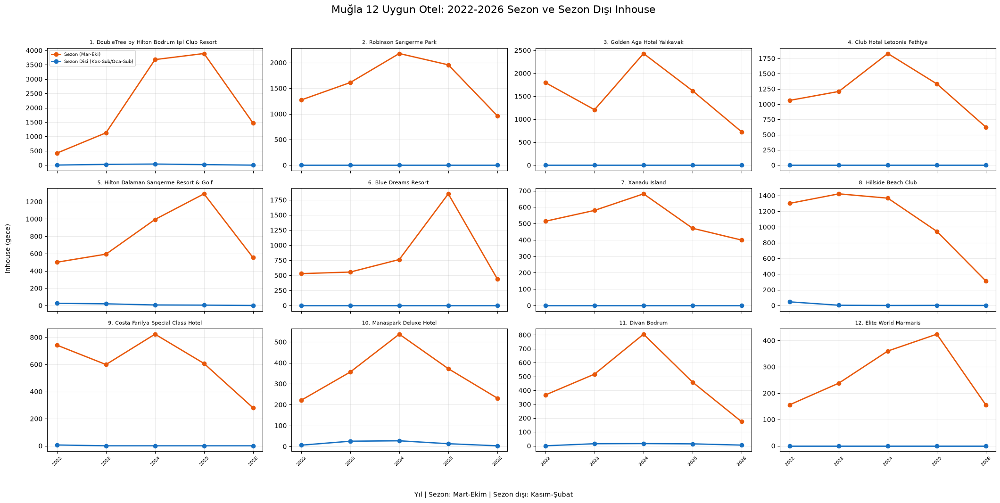

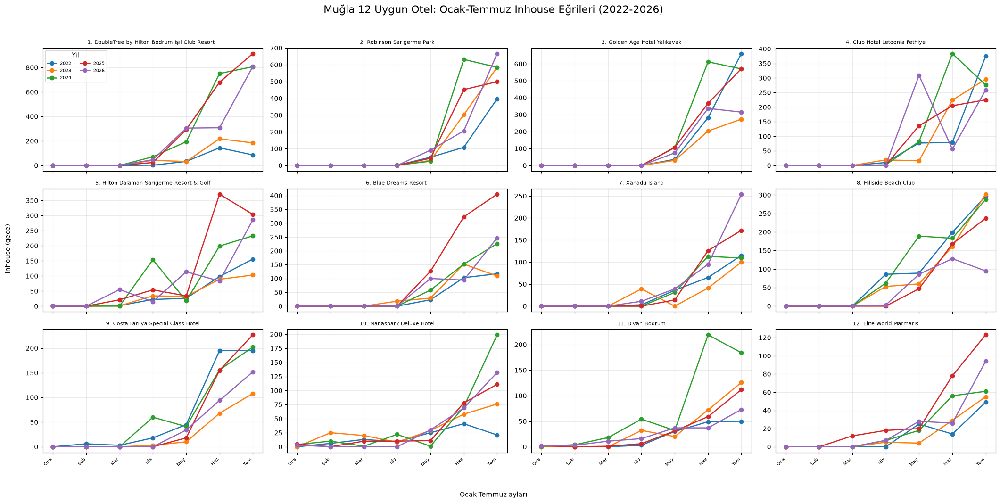

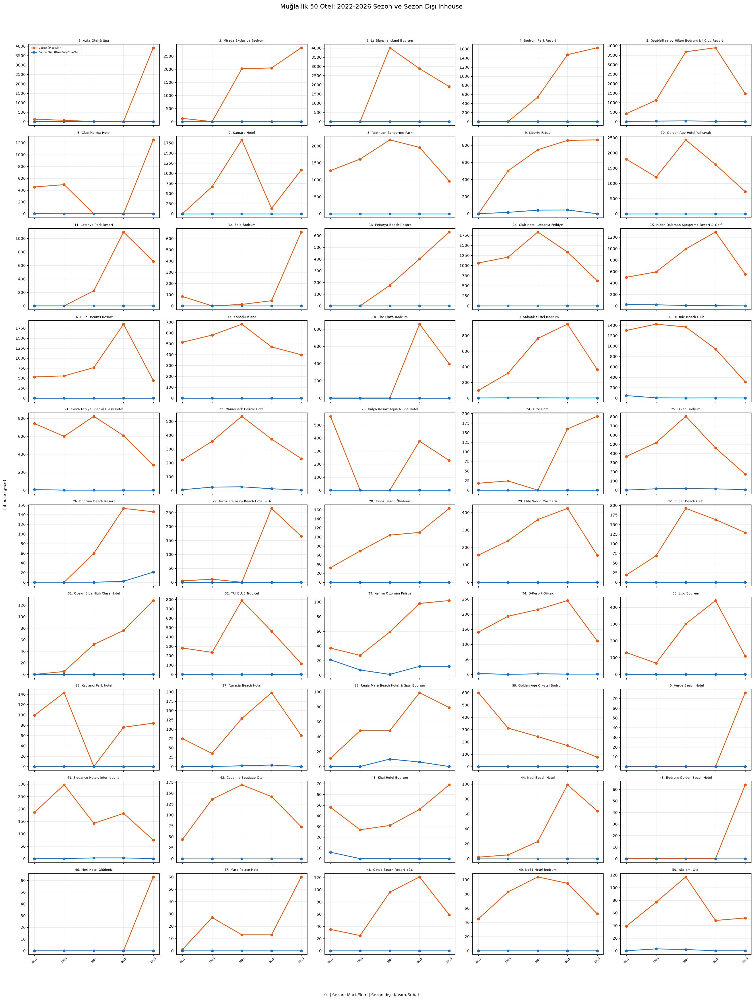

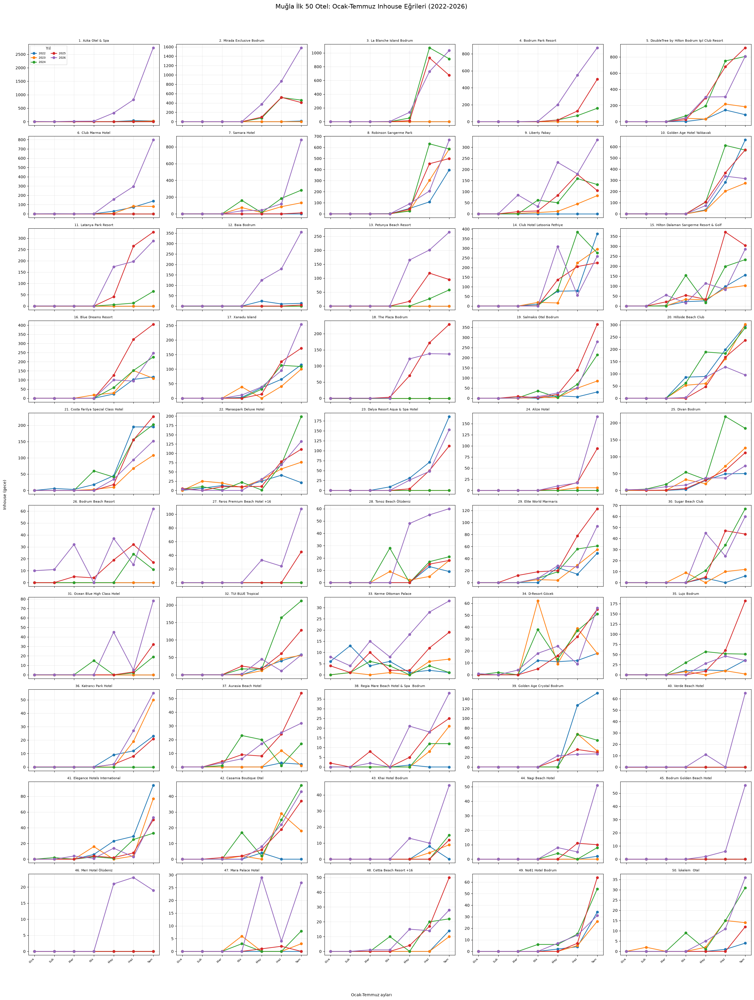

12 filtreli Muğla oteli ve 2026 Ocak-Temmuz inhouse'a göre ilk 50 otel için dört çizgi grafik kaydedildi.
 rank_2026                                     hotel_name hotel_region_name  2026_jan_july_occupied_nights
         1                                Azka Otel & Spa          Bardakçı                           3921
         2                        Mirada Exclusive Bodrum           Asarlık                           2821
         3                       La Blanche Island Bodrum       Güvercinlik                           1902
         4                             Bodrum Park Resort       Yalıçiftlik                           1626
         5 DoubleTree by Hilton Bodrum Işıl Club Resort               Torba                           1468
         6                               Club Marma Hotel          Akyarlar                           1249
         7                                   Samara Hotel             Torba                           1083
         8                        Robi

In [7]:
# Muğla otel görselleştirmeleri: filtreli 12 otel ve 2026 Ocak-Temmuz inhouse'a göre ilk 50 otel.
# Bu hücre yalnızca son Muğla backtest hücresinin ürettiği `monthly` ve `ranking` tablolarını kullanır.

VISUAL_YEARS = [2022, 2023, 2024, 2025, 2026]
SEASON_MONTHS = set(range(3, 11))
JAN_JUL_MONTHS = list(range(1, 8))
MONTH_LABELS_TR = ["Oca", "Sub", "Mar", "Nis", "May", "Haz", "Tem"]

if "monthly" not in globals() or "ranking" not in globals():
    raise ValueError("Önce Muğla 12 otel backtest hücresini çalıştırın.")

monthly_visual = monthly.copy()
monthly_visual["year"] = monthly_visual["month"].dt.year
monthly_visual["month_num"] = monthly_visual["month"].dt.month

# 2026 Ocak-Temmuz gerçek inhouse ile Muğla'nın ilk 50 otelini seç.
top50_hotels = (
    monthly_visual.loc[monthly_visual["month"].isin(evaluation_months)]
    .groupby(["hotel_id", "hotel_name", "hotel_region_name"], as_index=False)["occupied_nights"]
    .sum()
    .nlargest(50, "occupied_nights")
    .rename(columns={"occupied_nights": "2026_jan_july_occupied_nights"})
    .reset_index(drop=True)
)
top50_hotels["rank_2026"] = np.arange(1, len(top50_hotels) + 1)

eligible_12_hotels = ranking[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name", "2026_jan_july_occupied_nights"]].copy()
eligible_12_hotels["rank_2026"] = eligible_12_hotels["rank_2026"].astype(int)

def build_hotel_visual_data(hotels_to_plot):
    hotel_ids = hotels_to_plot["hotel_id"].tolist()
    monthly_grid = (
        hotels_to_plot[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
        .merge(pd.DataFrame({"month": all_months}), how="cross")
        .merge(
            monthly_visual.loc[monthly_visual["hotel_id"].isin(hotel_ids), ["hotel_id", "month", "occupied_nights"]],
            on=["hotel_id", "month"],
            how="left",
        )
        .fillna({"occupied_nights": 0})
    )
    monthly_grid["year"] = monthly_grid["month"].dt.year
    monthly_grid["month_num"] = monthly_grid["month"].dt.month
    monthly_grid["period"] = np.where(monthly_grid["month_num"].isin(SEASON_MONTHS), "Sezon (Mar-Eki)", "Sezon Disi (Kas-Sub/Oca-Sub)")

    period_totals = (
        monthly_grid.groupby(["rank_2026", "hotel_id", "hotel_name", "hotel_region_name", "year", "period"], as_index=False)["occupied_nights"]
        .sum()
    )
    period_grid = (
        hotels_to_plot[["rank_2026", "hotel_id", "hotel_name", "hotel_region_name"]]
        .merge(pd.DataFrame({"year": VISUAL_YEARS}), how="cross")
        .merge(pd.DataFrame({"period": ["Sezon (Mar-Eki)", "Sezon Disi (Kas-Sub/Oca-Sub)"]}), how="cross")
    )
    period_totals = period_grid.merge(
        period_totals,
        on=["rank_2026", "hotel_id", "hotel_name", "hotel_region_name", "year", "period"],
        how="left",
    ).fillna({"occupied_nights": 0})
    return monthly_grid, period_totals

def plot_season_offseason(period_totals, hotels_to_plot, title, file_name, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(5.4 * cols, 3.6 * rows), sharex=True)
    axes = np.asarray(axes).reshape(rows, cols)
    for axis, hotel in zip(axes.flat, hotels_to_plot.itertuples(index=False)):
        data = period_totals.loc[period_totals["hotel_id"].eq(hotel.hotel_id)]
        for period, color in [("Sezon (Mar-Eki)", "#e8590c"), ("Sezon Disi (Kas-Sub/Oca-Sub)", "#1971c2")]:
            values = data.loc[data["period"].eq(period)].set_index("year")["occupied_nights"].reindex(VISUAL_YEARS, fill_value=0)
            axis.plot(VISUAL_YEARS, values, marker="o", linewidth=2, label=period, color=color)
        axis.set_title(f"{int(hotel.rank_2026)}. {hotel.hotel_name}", fontsize=8)
        axis.set_xticks(VISUAL_YEARS)
        axis.tick_params(axis="x", rotation=45, labelsize=7)
        axis.grid(alpha=0.25)
    for axis in axes.flat[len(hotels_to_plot):]:
        axis.set_visible(False)
    axes.flat[0].legend(fontsize=7)
    fig.suptitle(title, fontsize=16)
    fig.supxlabel("Yıl | Sezon: Mart-Ekim | Sezon dışı: Kasım-Şubat", fontsize=10)
    fig.supylabel("Inhouse (gece)", fontsize=10)
    fig.tight_layout(rect=[0.02, 0.03, 1, 0.96])
    fig.savefig(output_dir / file_name, dpi=180)
    plt.show()

def plot_jan_jul_curves(monthly_grid, hotels_to_plot, title, file_name, rows, cols):
    fig, axes = plt.subplots(rows, cols, figsize=(5.4 * cols, 3.6 * rows), sharex=True)
    axes = np.asarray(axes).reshape(rows, cols)
    for axis, hotel in zip(axes.flat, hotels_to_plot.itertuples(index=False)):
        data = monthly_grid.loc[
            monthly_grid["hotel_id"].eq(hotel.hotel_id) & monthly_grid["month_num"].isin(JAN_JUL_MONTHS)
        ]
        for year in VISUAL_YEARS:
            values = data.loc[data["year"].eq(year)].set_index("month_num")["occupied_nights"].reindex(JAN_JUL_MONTHS, fill_value=0)
            axis.plot(JAN_JUL_MONTHS, values, marker="o", linewidth=1.8, label=str(year))
        axis.set_title(f"{int(hotel.rank_2026)}. {hotel.hotel_name}", fontsize=8)
        axis.set_xticks(JAN_JUL_MONTHS)
        axis.set_xticklabels(MONTH_LABELS_TR, rotation=45, ha="right", fontsize=7)
        axis.grid(alpha=0.25)
    for axis in axes.flat[len(hotels_to_plot):]:
        axis.set_visible(False)
    axes.flat[0].legend(title="Yıl", fontsize=7, ncol=2)
    fig.suptitle(title, fontsize=16)
    fig.supxlabel("Ocak-Temmuz ayları", fontsize=10)
    fig.supylabel("Inhouse (gece)", fontsize=10)
    fig.tight_layout(rect=[0.02, 0.03, 1, 0.96])
    fig.savefig(output_dir / file_name, dpi=180)
    plt.show()

eligible_12_monthly, eligible_12_periods = build_hotel_visual_data(eligible_12_hotels)
top50_monthly, top50_periods = build_hotel_visual_data(top50_hotels)

eligible_12_hotels.to_csv(output_dir / "mugla_12_visualized_hotels.csv", index=False)
top50_hotels.to_csv(output_dir / "mugla_top50_hotels_by_2026_jan_july_inhouse.csv", index=False)
eligible_12_periods.to_csv(output_dir / "mugla_12_hotels_season_offseason_2022_2026.csv", index=False)
top50_periods.to_csv(output_dir / "mugla_top50_hotels_season_offseason_2022_2026.csv", index=False)

plot_season_offseason(
    eligible_12_periods,
    eligible_12_hotels,
    "Muğla 12 Uygun Otel: 2022-2026 Sezon ve Sezon Dışı Inhouse",
    "mugla_12_hotels_season_offseason_2022_2026_lines.png",
    rows=3,
    cols=4,
)
plot_jan_jul_curves(
    eligible_12_monthly,
    eligible_12_hotels,
    "Muğla 12 Uygun Otel: Ocak-Temmuz Inhouse Eğrileri (2022-2026)",
    "mugla_12_hotels_jan_jul_2022_2026_overlay_lines.png",
    rows=3,
    cols=4,
)
plot_season_offseason(
    top50_periods,
    top50_hotels,
    "Muğla İlk 50 Otel: 2022-2026 Sezon ve Sezon Dışı Inhouse",
    "mugla_top50_hotels_season_offseason_2022_2026_lines.png",
    rows=10,
    cols=5,
)
plot_jan_jul_curves(
    top50_monthly,
    top50_hotels,
    "Muğla İlk 50 Otel: Ocak-Temmuz Inhouse Eğrileri (2022-2026)",
    "mugla_top50_hotels_jan_jul_2022_2026_overlay_lines.png",
    rows=10,
    cols=5,
)

print("12 filtreli Muğla oteli ve 2026 Ocak-Temmuz inhouse'a göre ilk 50 otel için dört çizgi grafik kaydedildi.")
print(top50_hotels[["rank_2026", "hotel_name", "hotel_region_name", "2026_jan_july_occupied_nights"]].to_string(index=False))